# 1. Problem Statement <a id='Problem Statement'></a>

A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below.
The company is looking at prospective properties to buy to enter the market. You are required to build a regression model using regularisation in order to predict the actual value of the prospective properties and decide whether to invest in them or not.
The company wants to know:
    - Which variables are significant in predicting the price of a house, and
    - How well those variables describe the price of a house.
Also, determine the optimal value of lambda for ridge and lasso regression

<b>Business Goal</b>

You are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for management to understand the pricing dynamics of a new market.

# Approach to problem Solving
- We will do following in incremental steps to solve the problem
    - Load and understand data
    - Check the skewness of traget variable and do log transformation of target variable
    - Exploratory data analysis to look for outliers and correlation amongst features
    - Data imputation using plots and various other methods
    - Feature engineering to create new meaningfull columns
    - Drop irrelevant columns using plots and value_counts etc.
    - Explore data after data cleaning and check for heatmap to check correlation between variables and target column
    - Convert various ordinal features using LabelEncoder
    - Create dummies for categorical columns
    - Scale various features using StandardSacalar
    - Divide dataset into X andy
    - Fit various models like Linear Regression, Lasso, Ridge, ElasticNet regression using cross validation and check for the best model
    - Fit the best model and look for 5 top predictors
    - Conclude and recommend

# 2. Table of Content  <a id='Table of Contents'></a>

- <a href='#Problem Statement'>1. Problem Statement</a>


- <a href='#Table of Contents'>2. Table of Contents</a>

- <a href='#Data Imports'>3. Library Imports</a>

- <a href='#Load Data'>4. Read and understand data Data</a>
    - <a href='#Initial Missingness' >4.1 Check for missing values and duplicates</a>

- <a href='#Check Target Skewness'>5. Check Target variable skewness</a>

- <a href='#Data Cleaning'>6. Data Cleaning</a>
    - <a href='#Check Missingness'>6.1 Check for missing values and handle missing data</a>
        - <a href='#Check Missingness 30'>6.1.1 Columns with missing value percentage greater than 30%</a>
        - <a href='#Check Missingness 2'>6.1.2 Columns with missing value percentage greater than 2%</a>
        - <a href='#Check Missingness 0'>6.1.3 Columns with missing value percentage greater than 0%</a>
        - <a href='#Categorical Columns Check'>6.1.4 Categorical columns check</a>
        - <a href='#Data retained'>6.1.5 Percentage of data retained after data cleaning</a>
- <a href='#Feature Engineering'> 7. Feature Engineering</a>
- <a href='#EDA after data cleaning'> 8. Exploratory Data Analysis after data cleaning</a>
    - <a href='#Univariate analysis'>8.1 Univariate Analysis</a>
    - <a href='#Bivariate analysis'>8.2 Bivariate Analysis</a>
    - <a href='#Heatmap'>8.3 Heatmap to check the correlation amongst the features and traget variable</a>
- <a href='#Data preparation'>9. Data preparation</a>
    - <a href='#Label Encoder'>9.1 Convert the ordinal variables using LabelEncoder</a>
    - <a href='#Get dummies'>9.2 Convert the variables using get_dummies</a>
- <a href='#Model Preparation'>10. Model Preparation</a>
    - <a href='#Create X and y'>10.1 Divide into X and Y for model building</a>
    - <a href='#Train Test Split'>10.2 Train-Test Split</a>
    - <a href='#Scaling'>10.3 Scale features</a>
- <a href='#Data Modelling'>11. Data Modelling</a>
    - <a href='#Cross Validation'>11.1 Setup cross validation folds</a>
    - <a href='#Define metrics'>11.2 Define metrics</a>
    - <a href='#DataFrame Save Results'>11.3 Create DataFrame to save results</a>
    - <a href='#LinearRegression'>11.4 Model 1 - Linear Regression without Regularization</a>
    - <a href='#Lasso'>11.5 Model 2 - Lasso</a>
    - <a href='#Ridge'>11.6 Model 3 - Ridge</a>
    - <a href='#ElasticNet'>11.7 Model 4 - ElasticNet</a>
    - <a href='#Conclusion and Recommendations'>11.8 Conclusion and Recommendations</a>
- <a href='#Subjective Questions'>12. Subjective Questions</a>
    - <a href='#Question1'>12.1 Question 1</a>
    - <a href='#Question2'>12.2 Question 2</a>
    - <a href='#Question3'>12.2 Question 3</a>

# 3. Library Imports  <a id='Data Imports'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

In [623]:
import numpy as np
import pandas as pd
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression, Lasso, Ridge, LassoCV, RidgeCV, ElasticNet
from sklearn.feature_selection import RFE
from scipy.stats import norm
from scipy.stats import stats
from scipy.stats import probplot
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV
from sklearn.metrics import mean_squared_error,r2_score,make_scorer


%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.style.use('ggplot')

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)

In [624]:
%%HTML
<style type="text/css">
table.dataframe td, table.dataframe th {
    border: 1px  black solid !important;
  color: black !important;
}
</style>

# 4. Reading and understanding data<a id='Load Data'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

In [625]:
houseprice_df = pd.read_csv('./dataset/train.csv')
houseprice_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
Id               1460 non-null int64
MSSubClass       1460 non-null int64
MSZoning         1460 non-null object
LotFrontage      1201 non-null float64
LotArea          1460 non-null int64
Street           1460 non-null object
Alley            91 non-null object
LotShape         1460 non-null object
LandContour      1460 non-null object
Utilities        1460 non-null object
LotConfig        1460 non-null object
LandSlope        1460 non-null object
Neighborhood     1460 non-null object
Condition1       1460 non-null object
Condition2       1460 non-null object
BldgType         1460 non-null object
HouseStyle       1460 non-null object
OverallQual      1460 non-null int64
OverallCond      1460 non-null int64
YearBuilt        1460 non-null int64
YearRemodAdd     1460 non-null int64
RoofStyle        1460 non-null object
RoofMatl         1460 non-null object
Exterior1st      1460 non-n

In [626]:
houseprice_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [627]:
original_rows = houseprice_df.shape[0]

### Lets bring target variable in front

In [628]:
col_list = list(houseprice_df.columns)
col_list.insert(0,col_list.pop(col_list.index('SalePrice')))
houseprice_df = houseprice_df.loc[:,col_list]

### Convert datatype of MSSubClass from int to object. This is because as per data dictionary
- MSSubClass: Identifies the type of dwelling involved in the sale.	

        20	1-STORY 1946 & NEWER ALL STYLES
        30	1-STORY 1945 & OLDER
        40	1-STORY W/FINISHED ATTIC ALL AGES
        45	1-1/2 STORY - UNFINISHED ALL AGES
        50	1-1/2 STORY FINISHED ALL AGES
        60	2-STORY 1946 & NEWER
        70	2-STORY 1945 & OLDER
        75	2-1/2 STORY ALL AGES
        80	SPLIT OR MULTI-LEVEL
        85	SPLIT FOYER
        90	DUPLEX - ALL STYLES AND AGES
       120	1-STORY PUD (Planned Unit Development) - 1946 & NEWER
       150	1-1/2 STORY PUD - ALL AGES
       160	2-STORY PUD - 1946 & NEWER
       180	PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
       190	2 FAMILY CONVERSION - ALL STYLES AND AGES

In [629]:
print('datatype of column "MSSubClass" before conversion: {0}'.format(houseprice_df['MSSubClass'].dtype))
houseprice_df['MSSubClass'] = houseprice_df['MSSubClass'].astype(str)
print('datatype of column "MSSubClass" after conversion: {0}'.format(houseprice_df['MSSubClass'].dtype))

datatype of column "MSSubClass" before conversion: int64
datatype of column "MSSubClass" after conversion: object


### Convert datatype of Month Sold from int to object. This is because number 1,2,3 etc. are the months

In [630]:
print('datatype of column "MoSold" before conversion: {0}'.format(houseprice_df['MoSold'].dtype))
houseprice_df['MoSold'] = houseprice_df['MoSold'].astype(str)
print('datatype of column "MoSold" after conversion: {0}'.format(houseprice_df['MoSold'].dtype))

datatype of column "MoSold" before conversion: int64
datatype of column "MoSold" after conversion: object


## 4.1 Check for missing values and duplicates <a id='Initial Missingness'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

In [631]:
pd.DataFrame([[houseprice_df.shape],
            [houseprice_df.isnull().sum().sum()],
             [houseprice_df.duplicated().sum()]],
            columns = ['Application Data Set'],
            index = ['Shape', 'Missingness', 'Duplicates'])

,Application Data Set
Shape,"(1460, 81)"
Missingness,6965
Duplicates,0


## Look for missing value percentage

In [632]:
houseprice_df[houseprice_df.columns[houseprice_df.isnull().any()]].isnull().sum()

LotFrontage      259
Alley           1369
MasVnrType         8
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64

In [633]:
#In terms of missing%
percent_missing = houseprice_df.isnull().sum() * 100 / len(houseprice_df)
missing_value_df = pd.DataFrame({'column_name': houseprice_df.columns,
                                 'percent_missing': percent_missing})
missing_value_df

,column_name,percent_missing
SalePrice,SalePrice,0.000000
Id,Id,0.000000
MSSubClass,MSSubClass,0.000000
MSZoning,MSZoning,0.000000
LotFrontage,LotFrontage,17.739726
LotArea,LotArea,0.000000
Street,Street,0.000000
Alley,Alley,93.767123
LotShape,LotShape,0.000000
LandContour,LandContour,0.000000


## Before we work on missing values, lets first check the skewness of target column

In [634]:
## Function to create histograms

def subplot_histograms(dist_df, list_of_columns, cols = 2):
    nrows = int(np.ceil(len(list_of_columns)/cols)) # Makes sure you have enough rows
    
    #Scales the height of the fig to accomodate a long list of features    
    fig, ax = plt.subplots(nrows=nrows, ncols=cols, figsize=(25, len(list_of_columns)*(10/cols)),squeeze=False) 
    ax = ax.ravel() # Ravel turns a matrix into a vector, which is easier to iterate
    for i, column in enumerate(list_of_columns): # Gives us an index value to get into all our lists
        try:
            sns.distplot(dist_df[column], ax=ax[i],fit=norm, kde=True) 
            mean_val = dist_df[column].mean()
            skewness = dist_df[column].skew()
            #runs D’Agostino's normality test to print on graph
            #The D’Agostino’s K^2 test calculates summary statistics from the data, namely kurtosis and skewness, 
            #to determine if the data distribution departs from the normal distribution, named for Ralph D’Agostino.
            #Skew is a quantification of how much a distribution is pushed left or right, 
            #a measure of asymmetry in the distribution.
            #Kurtosis quantifies how much of the distribution is in the tail. 
            #It is a simple and commonly used statistical test for normality.
            
            normality_test = stats.normaltest(dist_df[column]).pvalue < 0.05
            ax[i].set_title("Histogram for {}".format(list_of_columns[i]),color='blue')
            ax[i].set_xlabel(list_of_columns[i]) 
            ax[i].axvline(x = mean_val, label = "mean", color = "darkred").set_linestyle("--")
            ax[i].text(0.75, 0.83, "Normal: {}".format(not normality_test), ha="left", va="top", transform=ax[i].transAxes, fontsize=12)
            ax[i].text(0.75, 0.77, "Skewness: {}".format(round(skewness,2)), ha="left", va="top", transform=ax[i].transAxes, fontsize=12)
            ax[i].legend()
        except:
            ax[i].text(0.75, 0.5, "Could not plot {}".format(column), ha="left", va="top", transform=ax[i].transAxes, fontsize=12)

# 5. Check Target variable skewness<a id='Check Target Skewness'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

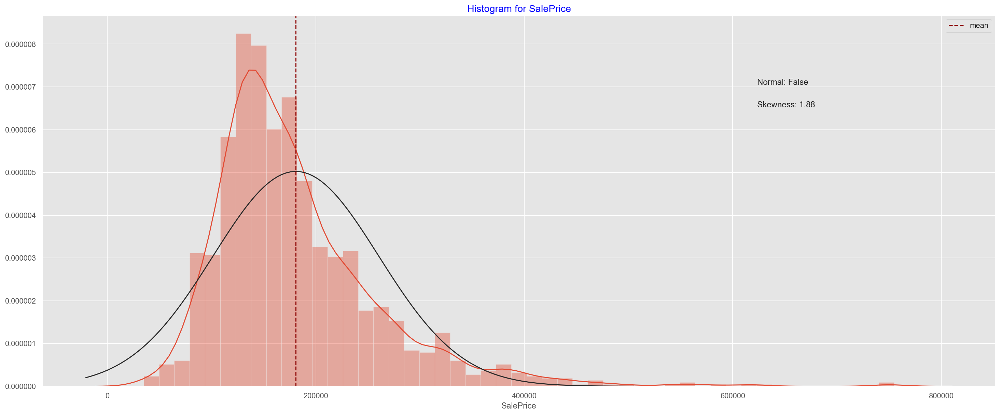

In [635]:
subplot_histograms(houseprice_df, ['SalePrice'], cols = 1)

## Observations from above plot
- It can be seen that the distribution of our target column is right skewed with skewness of 1.88
- Lets do log transformation of our target column and check for normaility of target column distribution

In [636]:
houseprice_df['SalePrice'] = np.log1p(houseprice_df['SalePrice'])
houseprice_df[['SalePrice']].head()

,SalePrice
0,12.247699
1,12.109016
2,12.317171
3,11.849405
4,12.429220


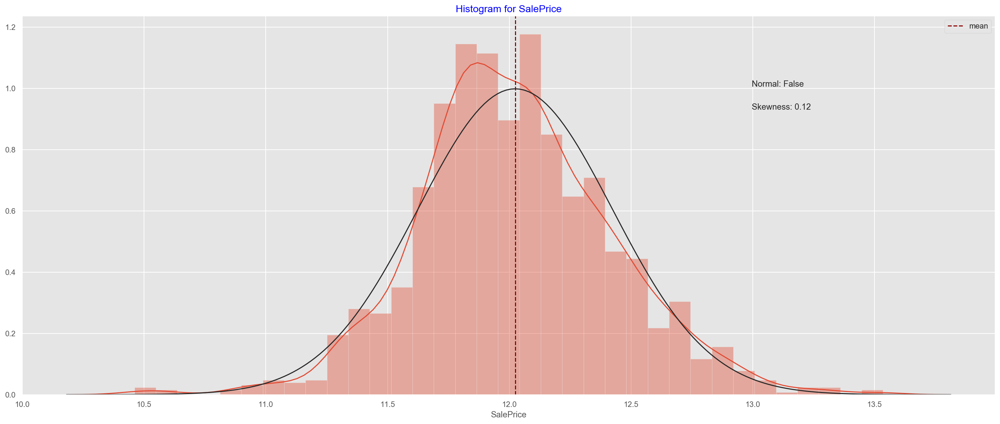

In [637]:
## Lets check for normality again
subplot_histograms(houseprice_df, ['SalePrice'], cols = 1)

### Observations from above plot
- Skewness is now 0.12 which is within the range so after log transformation our target column is now normaly distributed

## Function to create pairplot

In [638]:
#do the pairplot of selected features
def pairplot_features(df,numeric_features,target):
    features_count = len(numeric_features)
    for i in range(0,features_count,2):
        if (i+1)<features_count:
            g=sns.pairplot(df, kind='reg', x_vars=numeric_features[i:i+2],y_vars = target)
        else:
            g=sns.pairplot(df, kind='reg', x_vars=numeric_features[i],y_vars = target)
        g.fig.set_size_inches(10,5)

## Lets create pairplot of numerical features
- to check for correlation between target column and various features
- to also check the presence of outliers

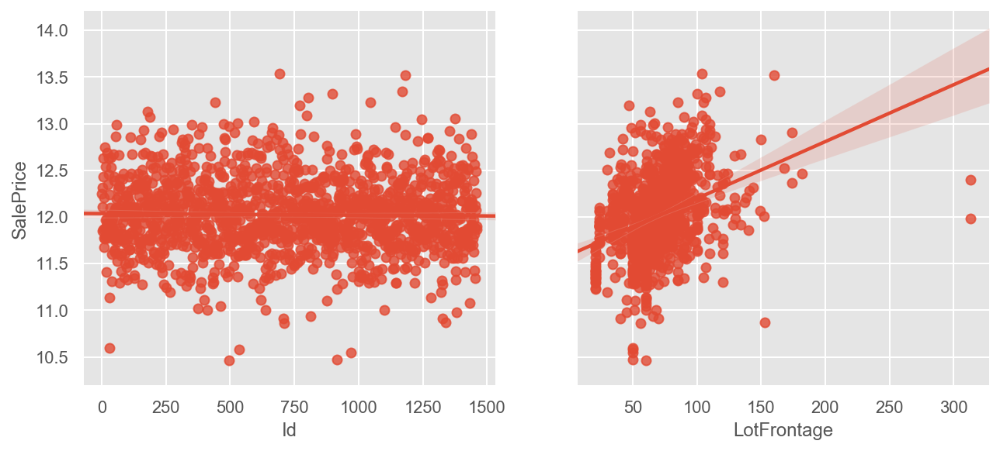

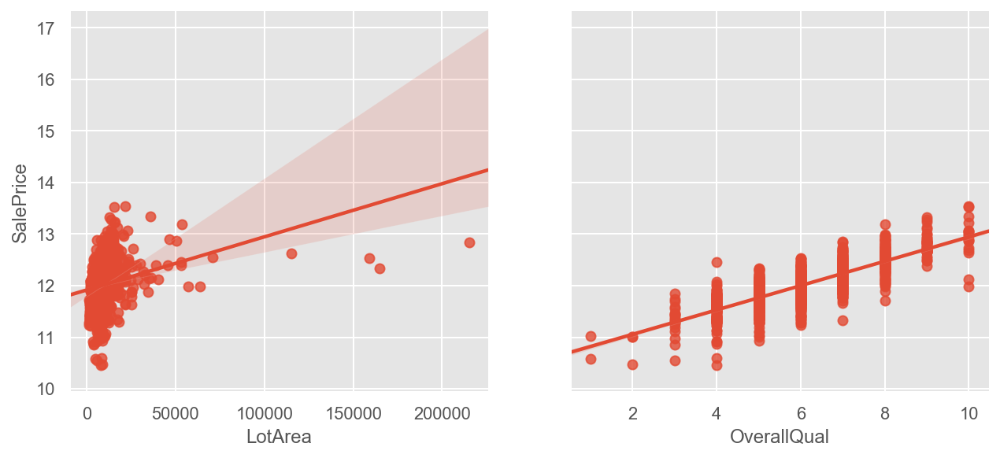

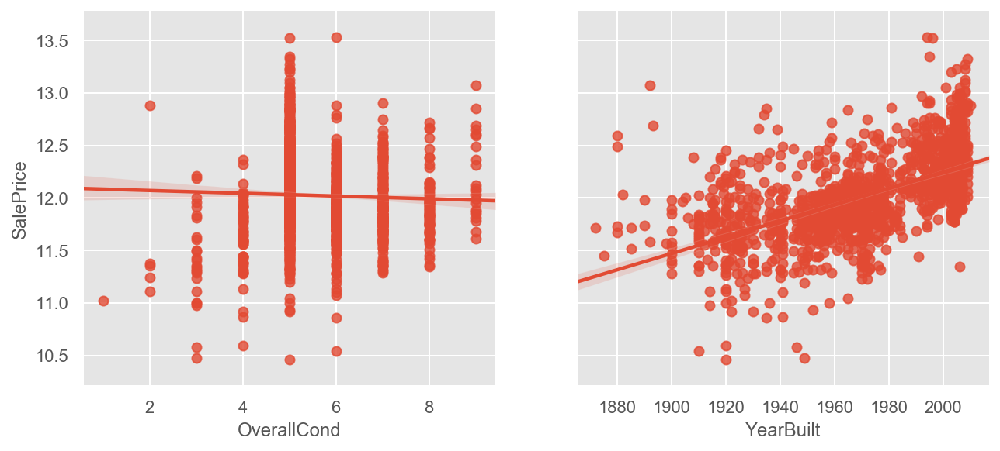

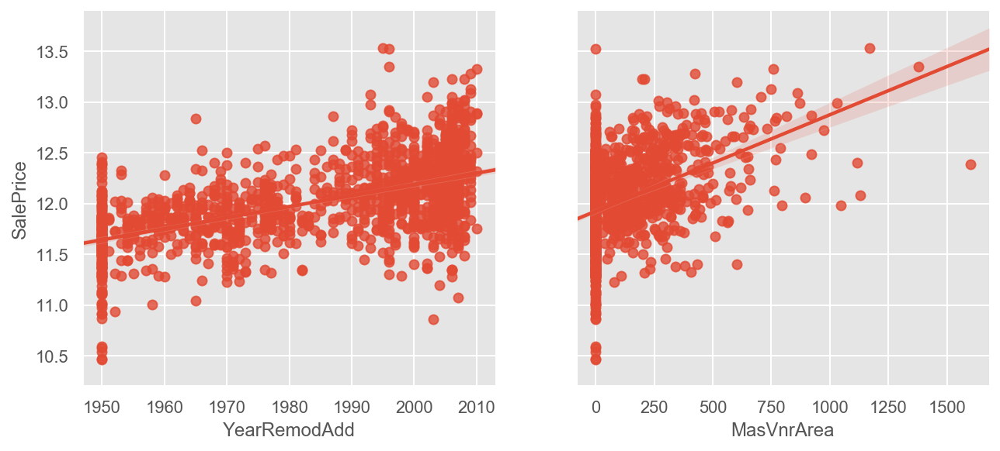

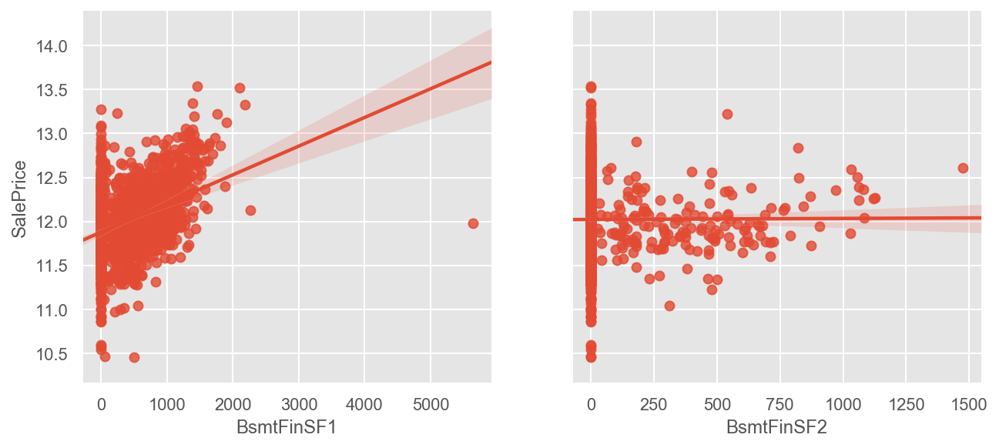

...

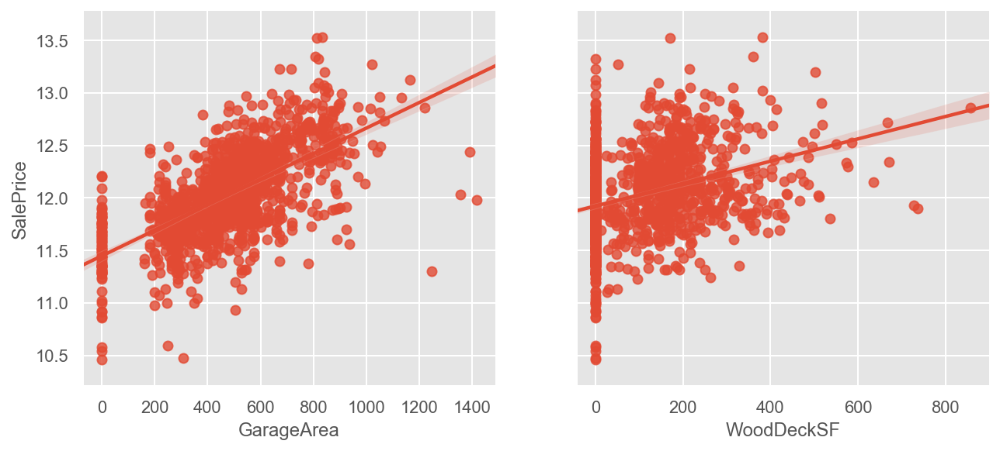

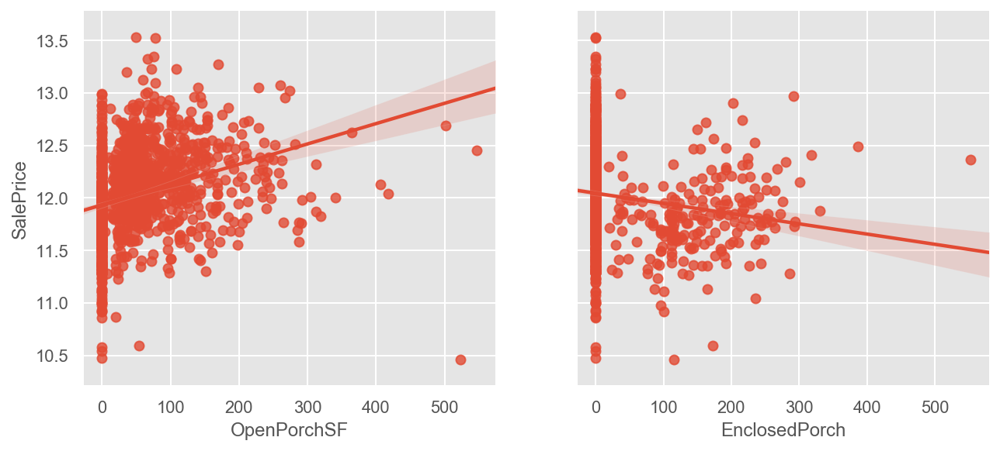

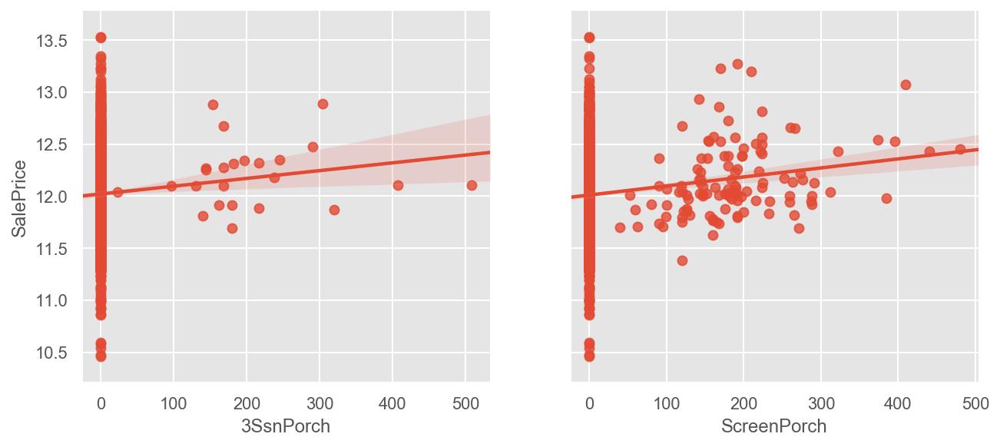

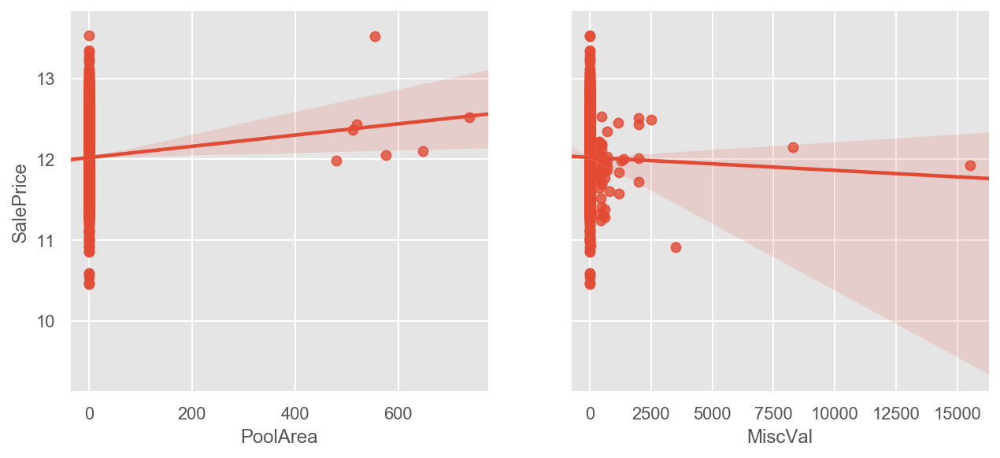

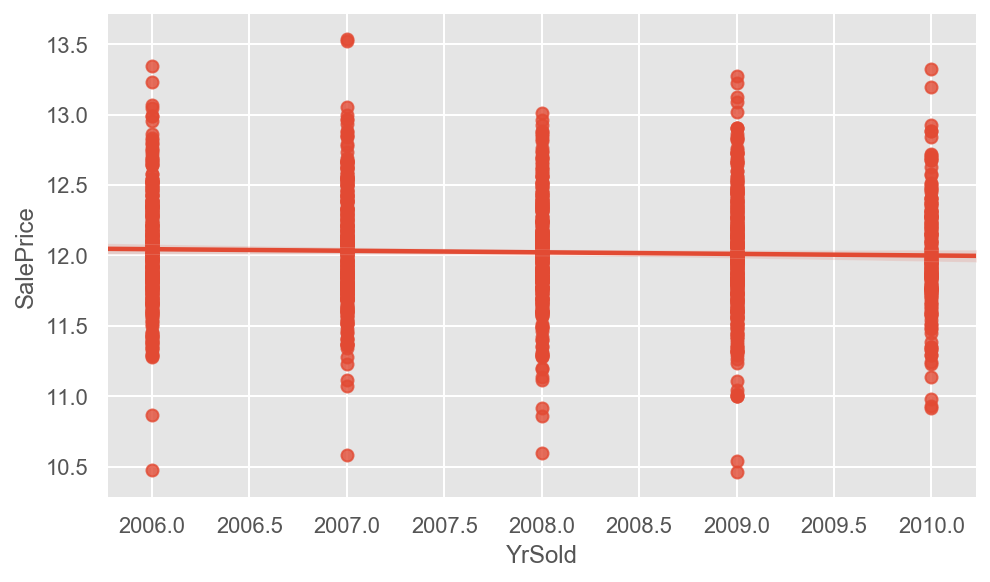

In [639]:
numeric_col_list = list(houseprice_df.select_dtypes(exclude=['object']).isnull())
numeric_col_list.remove('SalePrice')
pairplot_features(houseprice_df,numeric_col_list,'SalePrice')

## Observations from above plot
There seems to be
- Positive relationship between SalePrice and
    - LotFrontage, LotArea, MasVnrArea, BsmtFinSF1, TotalBsmtSF1, GrdLivArea, GarageArea, OpenPorchSF etc.
- Negative relationship between SalePrice and
    - OverallCond, LowQualFinSF, BsmtHalfBath, MiscVal, EnclosedProch, YrSold etc.
- There are 2 outliers in GrLivArea and LotFrontage, 1 outlier in TotalBsmtSF
- Features like OverallQual, OverallCond, BsmtFullBath, BsmtHalfBath, FullBath, HalfBath, TotRmsAbvGrd etc. doesnt seem to have continuous values. Due to these features having discrete values, we need to explore further that whether we need to convert these features into categorical columns or ordinal variables etc.
- YrBlt, YrSold, GarageYrBlt, YearRemodAdd are year relayted columns so we need to convert these columns into new features like age etc. with more valid meaning. These features cannot be treated as continuous variables as such

# 6. Data Cleaning<a id='Data Cleaning'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

# 6.1 Check for data missingness and data imputation<a id='Check Missingness'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

## 6.1.1 Lets check the columns with missing value percentage greater than 30%<a id='Check Missingness 30'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

In [640]:
#Get the list of columns with missing% > 30%
missing_data_cols = list(missing_value_df[missing_value_df['percent_missing']>30]['column_name'])
missing_data_cols

['Alley', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature']

### 1. Lets check values for column 'Alley'

In [641]:
houseprice_df['Alley'].value_counts()

Grvl    50
Pave    41
Name: Alley, dtype: int64

### As per data dictionary
- Alley: Type of alley access to property

       Grvl	Gravel
       Pave	Paved
       NA 	No alley access
       
- Based on this, lets replace null values with new category None which means 'No alley'

In [642]:
#replace null values with value 'None' in houseprice_df
print('Number of observations with null values in column Alley: {0}'.format(
    houseprice_df['Alley'].isnull().sum()))

houseprice_df['Alley'].replace({np.NaN:'None'},inplace=True)
print('Number of observations with null values in column Alley after imputation: {0}'.format(
    houseprice_df['Alley'].isnull().sum()))

Number of observations with null values in column Alley: 1369
Number of observations with null values in column Alley after imputation: 0


In [643]:
houseprice_df['Alley'].value_counts()

None    1369
Grvl      50
Pave      41
Name: Alley, dtype: int64

### 2. Lets check values for column 'FireplaceQu'

In [644]:
houseprice_df['FireplaceQu'].value_counts()

Gd    380
TA    313
Fa     33
Ex     24
Po     20
Name: FireplaceQu, dtype: int64

### As per data dictionary
- FireplaceQu: Fireplace quality

       Ex	Excellent - Exceptional Masonry Fireplace
       Gd	Good - Masonry Fireplace in main level
       TA	Average - Prefabricated Fireplace in main living area or Masonry Fireplace in basement
       Fa	Fair - Prefabricated Fireplace in basement
       Po	Poor - Ben Franklin Stove
       NA	No Fireplace
       
- Based on this, lets replace null values with new category None which means 'No Fireplace'

In [645]:
#replace null values with value 'None' in houseprice_df
print('Number of observations with null values in column FireplaceQu: {0}'.format(
    houseprice_df['FireplaceQu'].isnull().sum()))

houseprice_df['FireplaceQu'].replace({np.NaN:'None'},inplace=True)
print('Number of observations with null values in column FireplaceQu after imputation: {0}'.format(
    houseprice_df['FireplaceQu'].isnull().sum()))

Number of observations with null values in column FireplaceQu: 690
Number of observations with null values in column FireplaceQu after imputation: 0


In [646]:
houseprice_df['FireplaceQu'].value_counts()

None    690
Gd      380
TA      313
Fa       33
Ex       24
Po       20
Name: FireplaceQu, dtype: int64

### 3. Lets check values for column 'PoolQC'

In [647]:
houseprice_df['PoolQC'].value_counts()

Gd    3
Fa    2
Ex    2
Name: PoolQC, dtype: int64

### As per data dictionary
- PoolQC: Pool quality
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       NA	No Pool
       
- Based on this, lets replace null values with new category None which means 'No Pool'

In [648]:
#replace null values with value 'None' in houseprice_df
print('Number of observations with null values in column PoolQC: {0}'.format(
    houseprice_df['PoolQC'].isnull().sum()))

houseprice_df['PoolQC'].replace({np.NaN:'None'},inplace=True)
print('Number of observations with null values in column PoolQC after imputation: {0}'.format(
    houseprice_df['PoolQC'].isnull().sum()))

Number of observations with null values in column PoolQC: 1453
Number of observations with null values in column PoolQC after imputation: 0


In [649]:
houseprice_df['PoolQC'].value_counts()

None    1453
Gd         3
Fa         2
Ex         2
Name: PoolQC, dtype: int64

### 4. Lets check values for column 'Fence'

In [650]:
houseprice_df['Fence'].value_counts()

MnPrv    157
GdPrv     59
GdWo      54
MnWw      11
Name: Fence, dtype: int64

### As per data dictionary
- Fence: Fence quality
		
       GdPrv	Good Privacy
       MnPrv	Minimum Privacy
       GdWo	Good Wood
       MnWw	Minimum Wood/Wire
       NA	No Fence
       
- Based on this, lets replace null values with new category None which means 'No Fence'

In [651]:
#replace null values with value 'None' in houseprice_df
print('Number of observations with null values in column Fence: {0}'.format(
    houseprice_df['Fence'].isnull().sum()))

houseprice_df['Fence'].replace({np.NaN:'None'},inplace=True)
print('Number of observations with null values in column Fence after imputation: {0}'.format(
    houseprice_df['Fence'].isnull().sum()))

Number of observations with null values in column Fence: 1179
Number of observations with null values in column Fence after imputation: 0


In [652]:
houseprice_df['Fence'].value_counts()

None     1179
MnPrv     157
GdPrv      59
GdWo       54
MnWw       11
Name: Fence, dtype: int64

### 5. Lets check values for column 'MiscFeature'

In [653]:
houseprice_df['MiscFeature'].value_counts()

Shed    49
Gar2     2
Othr     2
TenC     1
Name: MiscFeature, dtype: int64

### As per data dictionary
- MiscFeature: Miscellaneous feature not covered in other categories
		
       Elev	Elevator
       Gar2	2nd Garage (if not described in garage section)
       Othr	Other
       Shed	Shed (over 100 SF)
       TenC	Tennis Court
       NA	None
       
- Based on this, lets replace null values with new category None which means 'No Miscellaneous Feature'

In [654]:
#replace null values with value 'None' in houseprice_df
print('Number of observations with null values in column MiscFeature: {0}'.format(
    houseprice_df['MiscFeature'].isnull().sum()))

houseprice_df['MiscFeature'].replace({np.NaN:'None'},inplace=True)
print('Number of observations with null values in column MiscFeature after imputation: {0}'.format(
    houseprice_df['MiscFeature'].isnull().sum()))

Number of observations with null values in column MiscFeature: 1406
Number of observations with null values in column MiscFeature after imputation: 0


In [655]:
houseprice_df['MiscFeature'].value_counts()

None    1406
Shed      49
Gar2       2
Othr       2
TenC       1
Name: MiscFeature, dtype: int64

## 6.1.2 Lets get the list of columns with missing value percentage > 2%<a id='Check Missingness 2'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

In [656]:
#Get the list of columns with missing% > 2%
percent_missing = houseprice_df.isnull().sum() * 100 / len(houseprice_df)
missing_value_df = pd.DataFrame({'column_name': houseprice_df.columns,
                                 'percent_missing': percent_missing})
missing_data_cols = list(missing_value_df[missing_value_df['percent_missing']>2]['column_name'])
print('No of columns with data value missing pect > 2% are: {0}'.format(len(missing_data_cols)))
print(missing_data_cols)
missing_value_df = missing_value_df[missing_value_df['percent_missing']>2]
missing_value_df

No of columns with data value missing pect > 2% are: 11
['LotFrontage', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageQual', 'GarageCond']


,column_name,percent_missing
LotFrontage,LotFrontage,17.739726
BsmtQual,BsmtQual,2.534247
BsmtCond,BsmtCond,2.534247
BsmtExposure,BsmtExposure,2.602740
BsmtFinType1,BsmtFinType1,2.534247
BsmtFinType2,BsmtFinType2,2.602740
GarageType,GarageType,5.547945
GarageYrBlt,GarageYrBlt,5.547945
GarageFinish,GarageFinish,5.547945
GarageQual,GarageQual,5.547945


### 1. Lets check values for column 'LotFrontage'
- 17% values are missing for this column
- As per data dictionary
    - LotFrontage: Linear feet of street connected to property

In [657]:
houseprice_df['LotFrontage'].dtype

dtype('float64')

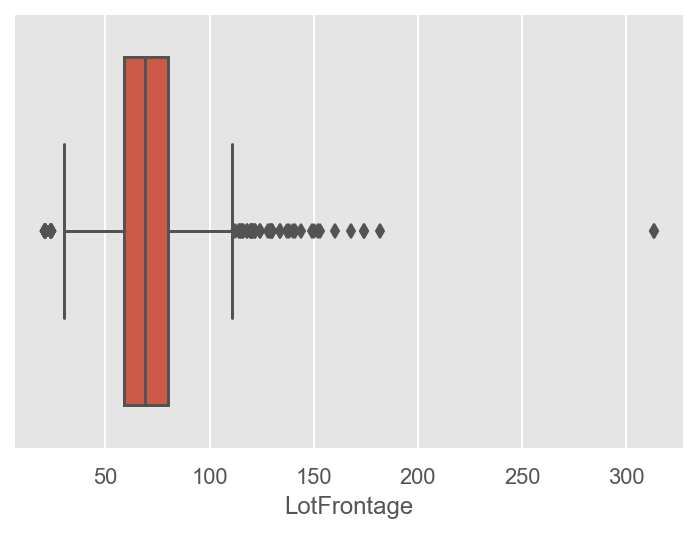

In [658]:
sns.boxplot(houseprice_df['LotFrontage']);

### Observations from above plot
- There is clearly an outlier. Lets explore further

In [659]:
houseprice_df['LotFrontage'].describe([0,0.05,0.25,0.5,0.75,0.9,0.95,0.99])

count    1201.000000
mean       70.049958
std        24.284752
min        21.000000
0%         21.000000
5%         34.000000
25%        59.000000
50%        69.000000
75%        80.000000
90%        96.000000
95%       107.000000
99%       141.000000
max       313.000000
Name: LotFrontage, dtype: float64

LotFrontage 99th percentile value: 141.0


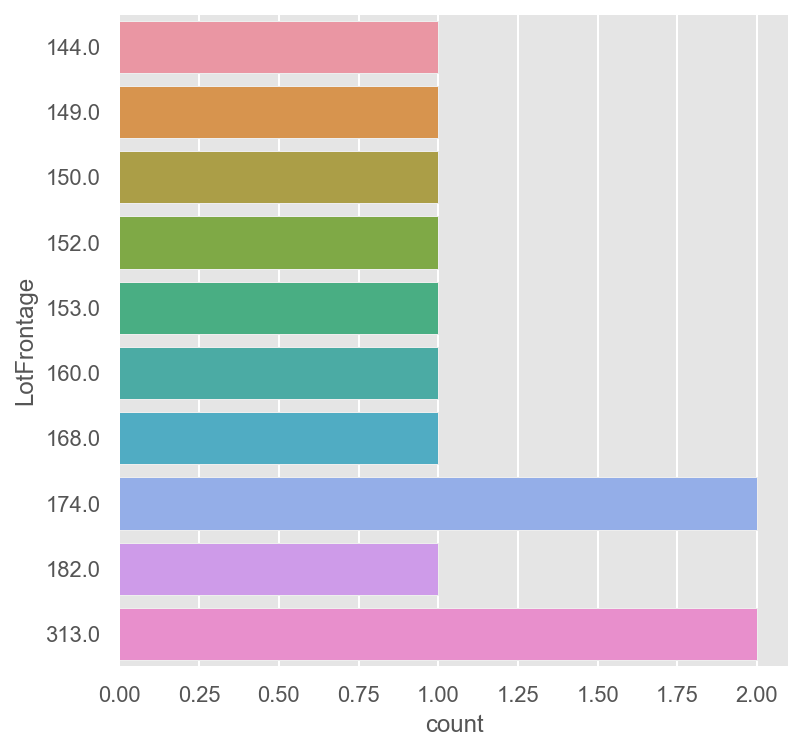

In [660]:
print('LotFrontage 99th percentile value: {0}'.format(houseprice_df['LotFrontage'].quantile(0.99)))
plt.figure(figsize=(6,6));
sns.countplot(y=houseprice_df[houseprice_df['LotFrontage']>141]['LotFrontage'].sort_values());

### Observations from above plot
- There are many outliers in 99th percentile
- Since data values are gradually increasing so we will keep the upper limit of data till 182. We will drop the remaining rows with LotFrontage>182

In [661]:
houseprice_df[houseprice_df['LotFrontage']>182]['LotFrontage'].count()

2

### Lets drop these 2 rows where LotFrontage>182

In [662]:
print('shape of dataframe before dropping rows: {0}'.format(houseprice_df.shape))
print('Total number of rows to be dropped: {0}'.format(
    houseprice_df[houseprice_df['LotFrontage']>182]['LotFrontage'].count()))
houseprice_df.drop(index=houseprice_df[houseprice_df['LotFrontage']>182].index,inplace=True)
print('shape of dataframe after dropping rows: {0}'.format(houseprice_df.shape))

shape of dataframe before dropping rows: (1460, 81)
Total number of rows to be dropped: 2
shape of dataframe after dropping rows: (1458, 81)


### Now lets check for the null values in this column

In [663]:
houseprice_df['LotFrontage'].isnull().sum()

259

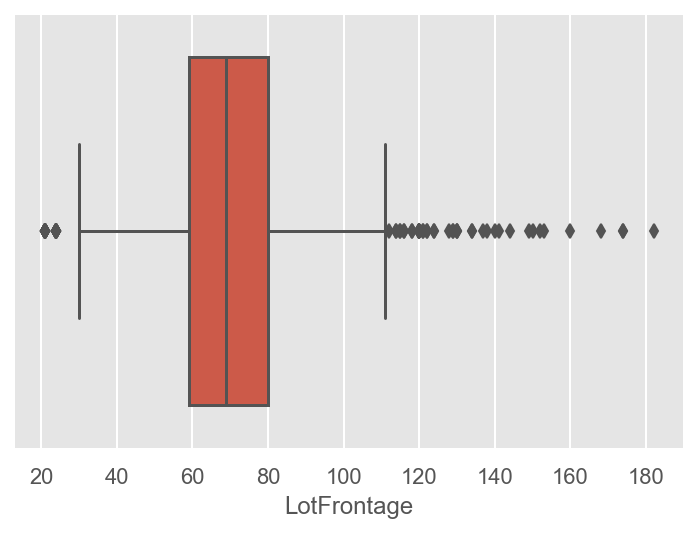

In [664]:
sns.boxplot(houseprice_df['LotFrontage'])

### Now to replace these null values lets use one more column named 'Neighborhood'
- Firstly from above plot we can see that there are outliers, so we will replace the null values with medican instead of mean
- We will group the LotFrontage with Neighborhood and then will find the median of LotFrontage
- We will then replace that null values with that median
- This is because every neighborhood has a specific fontage area. To blindly replace null values with one median value wont be correct. Instead we should replace the null values with median of Frontage based on different neighborhood

In [665]:
houseprice_df.groupby('Neighborhood')['LotFrontage'].describe()

,count,mean,std,min,25%,50%,75%,max
Neighborhood,,,,,,,,
Blmngtn,14.0,47.142857,4.990100,43.0,43.00,43.0,53.00,53.0
Blueste,2.0,24.000000,0.000000,24.0,24.00,24.0,24.00,24.0
BrDale,16.0,21.562500,1.209339,21.0,21.00,21.0,21.00,24.0
BrkSide,51.0,57.509804,15.528519,50.0,50.00,52.0,60.00,144.0
ClearCr,13.0,83.461538,18.875096,62.0,75.00,80.0,83.00,138.0
CollgCr,126.0,71.682540,16.359291,36.0,64.00,70.0,78.00,122.0
Crawfor,41.0,71.804878,19.436074,40.0,55.00,74.0,82.00,130.0
Edwards,91.0,65.527473,19.759296,24.0,58.50,65.0,74.00,134.0
Gilbert,49.0,79.877551,32.748176,42.0,60.00,65.0,93.00,182.0


### Apply lambda function to replace null value of LotFrontage with mean value of LotFrontage based on neighborhood

In [666]:
#replace null values with value median value based on neighborhood in houseprice_df
print('Number of observations with null values in column LotFrontage: {0}'.format(
    houseprice_df['LotFrontage'].isnull().sum()))
houseprice_df['LotFrontage'] = houseprice_df.groupby('Neighborhood')['LotFrontage'].apply(
    lambda x: x.fillna(x.median()))
print('Number of observations with null values in column LotFrontage: {0}'.format(
    houseprice_df['LotFrontage'].isnull().sum()))

Number of observations with null values in column LotFrontage: 259
Number of observations with null values in column LotFrontage: 0


### 2. Lets check values for column 'BsmtQual'
- 2.53% values are missing for this column

In [667]:
houseprice_df['BsmtQual'].value_counts()

TA    649
Gd    617
Ex    120
Fa     35
Name: BsmtQual, dtype: int64

### As per data dictionary
- BsmtQual: Evaluates the height of the basement

       Ex	Excellent (100+ inches)	
       Gd	Good (90-99 inches)
       TA	Typical (80-89 inches)
       Fa	Fair (70-79 inches)
       Po	Poor (<70 inches
       NA	No Basement
       
- Based on this, lets replace null values with new category None which means 'No Basement'

In [668]:
#replace null values with value 'None' in houseprice_df
print('Number of observations with null values in column BsmtQual: {0}'.format(
    houseprice_df['BsmtQual'].isnull().sum()))

houseprice_df['BsmtQual'].replace({np.NaN:'None'},inplace=True)
print('Number of observations with null values in column BsmtQual after imputation: {0}'.format(
    houseprice_df['BsmtQual'].isnull().sum()))

Number of observations with null values in column BsmtQual: 37
Number of observations with null values in column BsmtQual after imputation: 0


In [669]:
houseprice_df['BsmtQual'].value_counts()

TA      649
Gd      617
Ex      120
None     37
Fa       35
Name: BsmtQual, dtype: int64

### 3. Lets check values for column 'BsmtCond'
- 2.53% values are missing for this column

In [670]:
houseprice_df['BsmtCond'].value_counts()

TA    1309
Gd      65
Fa      45
Po       2
Name: BsmtCond, dtype: int64

### As per data dictionary
- BsmtCond: Evaluates the general condition of the basement

       Ex	Excellent
       Gd	Good
       TA	Typical - slight dampness allowed
       Fa	Fair - dampness or some cracking or settling
       Po	Poor - Severe cracking, settling, or wetness
       NA	No Basement
       
- Based on this, lets replace null values with new category None which means 'No Basement'

In [671]:
#replace null values with value 'None' in houseprice_df
print('Number of observations with null values in column BsmtCond: {0}'.format(
    houseprice_df['BsmtCond'].isnull().sum()))

houseprice_df['BsmtCond'].replace({np.NaN:'None'},inplace=True)
print('Number of observations with null values in column BsmtCond after imputation: {0}'.format(
    houseprice_df['BsmtCond'].isnull().sum()))

Number of observations with null values in column BsmtCond: 37
Number of observations with null values in column BsmtCond after imputation: 0


In [672]:
houseprice_df['BsmtCond'].value_counts()

TA      1309
Gd        65
Fa        45
None      37
Po         2
Name: BsmtCond, dtype: int64

### 4. Lets check values for column 'BsmtExposure'
- 2.6% values are missing for this column

In [673]:
houseprice_df['BsmtExposure'].value_counts()

No    953
Av    221
Gd    132
Mn    114
Name: BsmtExposure, dtype: int64

### As per data dictionary
- BsmtExposure: Refers to walkout or garden level walls

       Gd	Good Exposure
       Av	Average Exposure (split levels or foyers typically score average or above)	
       Mn	Mimimum Exposure
       No	No Exposure
       NA	No Basement
       
- Based on this, lets replace null values with new category None which means 'No Basement'

In [674]:
#replace null values with value 'None' in houseprice_df
print('Number of observations with null values in column BsmtExposure: {0}'.format(
    houseprice_df['BsmtExposure'].isnull().sum()))

houseprice_df['BsmtExposure'].replace({np.NaN:'None'},inplace=True)
print('Number of observations with null values in column BsmtExposure after imputation: {0}'.format(
    houseprice_df['BsmtExposure'].isnull().sum()))

Number of observations with null values in column BsmtExposure: 38
Number of observations with null values in column BsmtExposure after imputation: 0


In [675]:
houseprice_df['BsmtExposure'].value_counts()

No      953
Av      221
Gd      132
Mn      114
None     38
Name: BsmtExposure, dtype: int64

### 5. Lets check values for column 'BsmtFinType1'
- 2.53% values are missing for this column

In [676]:
houseprice_df['BsmtFinType1'].value_counts()

Unf    430
GLQ    416
ALQ    220
BLQ    148
Rec    133
LwQ     74
Name: BsmtFinType1, dtype: int64

### As per data dictionary
- BsmtFinType1: Rating of basement finished area

       GLQ	Good Living Quarters
       ALQ	Average Living Quarters
       BLQ	Below Average Living Quarters	
       Rec	Average Rec Room
       LwQ	Low Quality
       Unf	Unfinshed
       NA	No Basement
       
- Based on this, lets replace null values with new category None which means 'No Basement'

In [677]:
#replace null values with value 'None' in houseprice_df
print('Number of observations with null values in column BsmtFinType1: {0}'.format(
    houseprice_df['BsmtFinType1'].isnull().sum()))

houseprice_df['BsmtFinType1'].replace({np.NaN:'None'},inplace=True)
print('Number of observations with null values in column BsmtFinType1 after imputation: {0}'.format(
    houseprice_df['BsmtFinType1'].isnull().sum()))

Number of observations with null values in column BsmtFinType1: 37
Number of observations with null values in column BsmtFinType1 after imputation: 0


In [678]:
houseprice_df['BsmtFinType1'].value_counts()

Unf     430
GLQ     416
ALQ     220
BLQ     148
Rec     133
LwQ      74
None     37
Name: BsmtFinType1, dtype: int64

### 6. Lets check values for column 'BsmtFinType2'
- 2.6% values are missing for this column

In [679]:
houseprice_df['BsmtFinType2'].value_counts()

Unf    1254
Rec      54
LwQ      46
BLQ      33
ALQ      19
GLQ      14
Name: BsmtFinType2, dtype: int64

### As per data dictionary
- BsmtFinType2: Rating of basement finished area (if multiple types)

       GLQ	Good Living Quarters
       ALQ	Average Living Quarters
       BLQ	Below Average Living Quarters	
       Rec	Average Rec Room
       LwQ	Low Quality
       Unf	Unfinshed
       NA	No Basement
       
- Based on this, lets replace null values with new category None which means 'No Basement'

In [680]:
#replace null values with value 'None' in houseprice_df
print('Number of observations with null values in column BsmtFinType2: {0}'.format(
    houseprice_df['BsmtFinType2'].isnull().sum()))

houseprice_df['BsmtFinType2'].replace({np.NaN:'None'},inplace=True)
print('Number of observations with null values in column BsmtFinType2 after imputation: {0}'.format(
    houseprice_df['BsmtFinType2'].isnull().sum()))

Number of observations with null values in column BsmtFinType2: 38
Number of observations with null values in column BsmtFinType2 after imputation: 0


In [681]:
houseprice_df['BsmtFinType2'].value_counts()

Unf     1254
Rec       54
LwQ       46
None      38
BLQ       33
ALQ       19
GLQ       14
Name: BsmtFinType2, dtype: int64

### 7. Lets check values for column 'GarageType'
- 5.6% values are missing for this column

In [682]:
houseprice_df['GarageType'].value_counts()

Attchd     868
Detchd     387
BuiltIn     88
Basment     19
CarPort      9
2Types       6
Name: GarageType, dtype: int64

In [683]:
## Lets check values of garage related columns
houseprice_df.loc[houseprice_df['GarageType'].isnull(),['GarageCars','GarageQual','GarageType',
                                                     'GarageYrBlt','GarageArea']]

,GarageCars,GarageQual,GarageType,GarageYrBlt,GarageArea
39,0,NaN,NaN,NaN,0
48,0,NaN,NaN,NaN,0
78,0,NaN,NaN,NaN,0
88,0,NaN,NaN,NaN,0
89,0,NaN,NaN,NaN,0
99,0,NaN,NaN,NaN,0
108,0,NaN,NaN,NaN,0
125,0,NaN,NaN,NaN,0
127,0,NaN,NaN,NaN,0
140,0,NaN,NaN,NaN,0


### As per data dictionary
- GarageType: Garage location
		
       2Types	More than one type of garage
       Attchd	Attached to home
       Basment	Basement Garage
       BuiltIn	Built-In (Garage part of house - typically has room above garage)
       CarPort	Car Port
       Detchd	Detached from home
       NA	No Garage
       
- Also from above observations we can see that where GarageType is null, all other supporting columns of Garage have either value as 0 or null. This implies there is no garage for such observations. Based on this, lets replace null values with new category None which means 'No Garage'

In [684]:
#replace null values with value 'None' in houseprice_df
print('Number of observations with null values in column GarageType: {0}'.format(
    houseprice_df['GarageType'].isnull().sum()))

houseprice_df['GarageType'].replace({np.NaN:'None'},inplace=True)
print('Number of observations with null values in column GarageType after imputation: {0}'.format(
    houseprice_df['GarageType'].isnull().sum()))

Number of observations with null values in column GarageType: 81
Number of observations with null values in column GarageType after imputation: 0


In [685]:
houseprice_df['GarageType'].value_counts()

Attchd     868
Detchd     387
BuiltIn     88
None        81
Basment     19
CarPort      9
2Types       6
Name: GarageType, dtype: int64

### 8. Lets check values for column 'GarageYrBlt'
- 5.6% values are missing for this column

In [686]:
houseprice_df['GarageYrBlt'].dtype

dtype('float64')

In [687]:
## Lets check values of garage related columns
houseprice_df.loc[houseprice_df['GarageYrBlt'].isnull(),['GarageCars','GarageQual','GarageType',
                                                     'GarageYrBlt','GarageArea']]

,GarageCars,GarageQual,GarageType,GarageYrBlt,GarageArea
39,0,NaN,None,NaN,0
48,0,NaN,None,NaN,0
78,0,NaN,None,NaN,0
88,0,NaN,None,NaN,0
89,0,NaN,None,NaN,0
99,0,NaN,None,NaN,0
108,0,NaN,None,NaN,0
125,0,NaN,None,NaN,0
127,0,NaN,None,NaN,0
140,0,NaN,None,NaN,0


### As per data dictionary
- GarageYrBlt: Year garage was built
- Also from above observations we can see that where GarageYrBlt is null, all other supporting columns of Garage have either value as 0 or null or None. This implies there is no garage for such observations     
- Based on this, null values means there is no garage so the Year Garage was built has no values
- Lets replace these null values with some very high year '2099'
- Lets also convert the datatype of the column to datetime

In [688]:
#replace null values with value high date in houseprice_df
print('Number of observations with null values in column GarageYrBlt: {0}'.format(
    houseprice_df['GarageYrBlt'].isnull().sum()))

houseprice_df['GarageYrBlt'].replace({np.NaN:'2099'},inplace=True)
print('Number of observations with null values in column GarageYrBlt after imputation: {0}'.format(
    houseprice_df['GarageYrBlt'].isnull().sum()))

Number of observations with null values in column GarageYrBlt: 81
Number of observations with null values in column GarageYrBlt after imputation: 0


### Also change the data type of column GarageYrBlt to datetime in houseprice_df

In [689]:
houseprice_df['GarageYrBlt'].dtype

dtype('O')

In [690]:
houseprice_df['GarageYrBlt'] = houseprice_df['GarageYrBlt'].astype(int).astype(str).apply(np.datetime64)
houseprice_df['GarageYrBlt'].dtype

dtype('<M8[ns]')

In [691]:
houseprice_df['GarageYrBlt'].isnull().sum()

0

### 9. Lets check values for column 'GarageFinish'
- 5.6% values are missing for this column

In [692]:
houseprice_df['GarageFinish'].value_counts()

Unf    605
RFn    421
Fin    351
Name: GarageFinish, dtype: int64

In [693]:
## Lets check values of garage related columns
houseprice_df.loc[houseprice_df['GarageFinish'].isnull(),['GarageCars','GarageQual','GarageType',
                                                     'GarageYrBlt','GarageArea']]

,GarageCars,GarageQual,GarageType,GarageYrBlt,GarageArea
39,0,NaN,None,2099-01-01,0
48,0,NaN,None,2099-01-01,0
78,0,NaN,None,2099-01-01,0
88,0,NaN,None,2099-01-01,0
89,0,NaN,None,2099-01-01,0
99,0,NaN,None,2099-01-01,0
108,0,NaN,None,2099-01-01,0
125,0,NaN,None,2099-01-01,0
127,0,NaN,None,2099-01-01,0
140,0,NaN,None,2099-01-01,0


### As per data dictionary
- GarageFinish: Interior finish of the garage

       Fin	Finished
       RFn	Rough Finished	
       Unf	Unfinished
       NA	No Garage
- Also from above observations we can see that where GarageFinish is null, all other supporting columns of Garage have either value as 0 or null or None. This implies there is no garage for such observations           
- Based on this, lets replace null values with new category None which means 'No Garage'

In [694]:
#replace null values with value 'None' in houseprice_df
print('Number of observations with null values in column GarageFinish: {0}'.format(
    houseprice_df['GarageFinish'].isnull().sum()))

houseprice_df['GarageFinish'].replace({np.NaN:'None'},inplace=True)
print('Number of observations with null values in column GarageFinish after imputation: {0}'.format(
    houseprice_df['GarageFinish'].isnull().sum()))

Number of observations with null values in column GarageFinish: 81
Number of observations with null values in column GarageFinish after imputation: 0


In [695]:
houseprice_df['GarageFinish'].value_counts()

Unf     605
RFn     421
Fin     351
None     81
Name: GarageFinish, dtype: int64

### 10. Lets check values for column 'GarageQual'
- 5.6% values are missing for this column

In [696]:
houseprice_df['GarageQual'].value_counts()

TA    1309
Fa      48
Gd      14
Po       3
Ex       3
Name: GarageQual, dtype: int64

In [697]:
## Lets check values of garage related columns
houseprice_df.loc[houseprice_df['GarageQual'].isnull(),['GarageCars','GarageQual','GarageType',
                                                     'GarageYrBlt','GarageArea']]

,GarageCars,GarageQual,GarageType,GarageYrBlt,GarageArea
39,0,NaN,None,2099-01-01,0
48,0,NaN,None,2099-01-01,0
78,0,NaN,None,2099-01-01,0
88,0,NaN,None,2099-01-01,0
89,0,NaN,None,2099-01-01,0
99,0,NaN,None,2099-01-01,0
108,0,NaN,None,2099-01-01,0
125,0,NaN,None,2099-01-01,0
127,0,NaN,None,2099-01-01,0
140,0,NaN,None,2099-01-01,0


### As per data dictionary
- GarageQual: Garage quality

       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       NA	No Garage
- Also from above observations we can see that where GarageQual is null, all other supporting columns of Garage have either value as 0 or null or None. This implies there is no garage for such observations               
- Based on this, lets replace null values with new category None which means 'No Garage'

In [698]:
#replace null values with value 'None' in houseprice_df
print('Number of observations with null values in column GarageQual: {0}'.format(
    houseprice_df['GarageQual'].isnull().sum()))

houseprice_df['GarageQual'].replace({np.NaN:'None'},inplace=True)
print('Number of observations with null values in column GarageQual after imputation: {0}'.format(
    houseprice_df['GarageQual'].isnull().sum()))

Number of observations with null values in column GarageQual: 81
Number of observations with null values in column GarageQual after imputation: 0


In [699]:
houseprice_df['GarageQual'].value_counts()

TA      1309
None      81
Fa        48
Gd        14
Po         3
Ex         3
Name: GarageQual, dtype: int64

### 11. Lets check values for column 'GarageCond'
- 5.6% values are missing for this column

In [700]:
houseprice_df['GarageCond'].value_counts()

TA    1324
Fa      35
Gd       9
Po       7
Ex       2
Name: GarageCond, dtype: int64

In [701]:
## Lets check values of garage related columns
houseprice_df.loc[houseprice_df['GarageCond'].isnull(),['GarageCars','GarageQual','GarageType',
                                                     'GarageYrBlt','GarageArea']]

,GarageCars,GarageQual,GarageType,GarageYrBlt,GarageArea
39,0,None,None,2099-01-01,0
48,0,None,None,2099-01-01,0
78,0,None,None,2099-01-01,0
88,0,None,None,2099-01-01,0
89,0,None,None,2099-01-01,0
99,0,None,None,2099-01-01,0
108,0,None,None,2099-01-01,0
125,0,None,None,2099-01-01,0
127,0,None,None,2099-01-01,0
140,0,None,None,2099-01-01,0


### As per data dictionary
- GarageCond: Garage condition

       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       NA	No Garage
- Also from above observations we can see that where GarageQual is null, all other supporting columns of Garage have either value as 0 or null or None. This implies there is no garage for such observations       
- Based on this, lets replace null values with new category None which means 'No Garage'

In [702]:
#replace null values with value 'None' in houseprice_df
print('Number of observations with null values in column GarageCond: {0}'.format(
    houseprice_df['GarageCond'].isnull().sum()))

houseprice_df['GarageCond'].replace({np.NaN:'None'},inplace=True)
print('Number of observations with null values in column GarageCond after imputation: {0}'.format(
    houseprice_df['GarageCond'].isnull().sum()))

Number of observations with null values in column GarageCond: 81
Number of observations with null values in column GarageCond after imputation: 0


In [703]:
houseprice_df['GarageCond'].value_counts()

TA      1324
None      81
Fa        35
Gd         9
Po         7
Ex         2
Name: GarageCond, dtype: int64

## 6.1.3 Lets get the list of columns with missing value percentage > 0%<a id='Check Missingness 0'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

In [704]:
#Get the list of columns with missing% > 0%
percent_missing = houseprice_df.isnull().sum() * 100 / len(houseprice_df)
missing_value_df = pd.DataFrame({'column_name': houseprice_df.columns,
                                 'percent_missing': percent_missing})
missing_data_cols = list(missing_value_df[missing_value_df['percent_missing']>0]['column_name'])
print('No of columns with data value missing pect > 0% are: {0}'.format(len(missing_data_cols)))
print(missing_data_cols)
missing_value_df = missing_value_df[missing_value_df['percent_missing']>0]
missing_value_df

No of columns with data value missing pect > 0% are: 3
['MasVnrType', 'MasVnrArea', 'Electrical']


,column_name,percent_missing
MasVnrType,MasVnrType,0.548697
MasVnrArea,MasVnrArea,0.548697
Electrical,Electrical,0.068587


### 1. Lets check for columns MasVnrType and MasVnrArea

### As per data dictionary
- MasVnrType: Masonry veneer type

       BrkCmn	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       None	None
       Stone	Stone
Also
- MasVnrArea: Masonry veneer area in square feet
- Lets check for all such rows where these columns have null values

In [705]:
houseprice_df['MasVnrType'].isnull().sum()

8

In [706]:
houseprice_df.loc[houseprice_df['MasVnrArea'].isnull(),['MasVnrType','MasVnrArea']]

,MasVnrType,MasVnrArea
234,NaN,NaN
529,NaN,NaN
650,NaN,NaN
936,NaN,NaN
973,NaN,NaN
977,NaN,NaN
1243,NaN,NaN
1278,NaN,NaN


### Observations from above cell
- It seems that all 8 observations have MasVnrType and MasVnrArea a null meaning there is no Masnory veneer type
- So either 
    - we can replace the null values with type 'None' in MasVnrType and with value 0 in MasVnrArea
    - or we can drop these rows
    - Lets not assume and lets drop these rows on a safer side

In [707]:
print('shape of dataframe before dropping rows: {0}'.format(houseprice_df.shape))
print('Total number of rows to be dropped: {0}'.format(houseprice_df['MasVnrType'].isnull().sum()))
houseprice_df = houseprice_df[~houseprice_df['MasVnrType'].isnull()]
print('shape of dataframe after dropping rows: {0}'.format(houseprice_df.shape))

shape of dataframe before dropping rows: (1458, 81)
Total number of rows to be dropped: 8
shape of dataframe after dropping rows: (1450, 81)


In [708]:
houseprice_df['MasVnrType'].isnull().sum()

0

### 2. Lets check for column Electrical

### As per data dictionary
- Electrical: Electrical system

       SBrkr	Standard Circuit Breakers & Romex
       FuseA	Fuse Box over 60 AMP and all Romex wiring (Average)	
       FuseF	60 AMP Fuse Box and mostly Romex wiring (Fair)
       FuseP	60 AMP Fuse Box and mostly knob & tube wiring (poor)
       Mix	Mixed
- Lets check for all such rows where these columns have null values

In [709]:
houseprice_df['Electrical'].isnull().sum()

1

In [710]:
houseprice_df[houseprice_df['Electrical'].isnull()]

,SalePrice,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1379,12.028745,1380,80,RL,73.0,9735,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,SLvl,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,384,384,GasA,Gd,Y,NaN,754,640,0,1394,0,0,2,1,3,1,Gd,7,Typ,0,None,BuiltIn,2007-01-01,Fin,2,400,TA,TA,Y,100,0,0,0,0,0,None,None,None,0,5,2008,WD,Normal


### Observations from above cell
- Since there is only one row where the column 'Electrical' has null value 
    - so we can drop this row

In [711]:
print('shape of dataframe before dropping rows: {0}'.format(houseprice_df.shape))
print('Total number of rows to be dropped: {0}'.format(houseprice_df['Electrical'].isnull().sum()))
houseprice_df = houseprice_df[~houseprice_df['Electrical'].isnull()]
print('shape of dataframe after dropping rows: {0}'.format(houseprice_df.shape))

shape of dataframe before dropping rows: (1450, 81)
Total number of rows to be dropped: 1
shape of dataframe after dropping rows: (1449, 81)


In [712]:
houseprice_df['Electrical'].isnull().sum()

0

## Lets check for dataframe information now

In [713]:
houseprice_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1449 entries, 0 to 1459
Data columns (total 81 columns):
SalePrice        1449 non-null float64
Id               1449 non-null int64
MSSubClass       1449 non-null object
MSZoning         1449 non-null object
LotFrontage      1449 non-null float64
LotArea          1449 non-null int64
Street           1449 non-null object
Alley            1449 non-null object
LotShape         1449 non-null object
LandContour      1449 non-null object
Utilities        1449 non-null object
LotConfig        1449 non-null object
LandSlope        1449 non-null object
Neighborhood     1449 non-null object
Condition1       1449 non-null object
Condition2       1449 non-null object
BldgType         1449 non-null object
HouseStyle       1449 non-null object
OverallQual      1449 non-null int64
OverallCond      1449 non-null int64
YearBuilt        1449 non-null int64
YearRemodAdd     1449 non-null int64
RoofStyle        1449 non-null object
RoofMatl         1449 n

### Observations from above cell
- All null values have been treated

In [714]:
houseprice_df.head()

,SalePrice,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,12.247699,1,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,None,Attchd,2003-01-01,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,None,None,None,0,2,2008,WD,Normal
1,12.109016,2,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976-01-01,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,None,None,None,0,5,2007,WD,Normal
2,12.317171,3,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001-01-01,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,None,None,None,0,9,2008,WD,Normal
3,11.849405,4,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998-01-01,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,None,None,None,0,2,2006,WD,Abnorml
4,12.429220,5,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000-01-01,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,None,None,None,0,12,2008,WD,Normal


## 6.1.4 Categorical columns check<a id='Categorical Columns Check'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

## Lets now check for the columns with unique values

In [715]:
## Lets get the list of categorical columns
object_cols = [col for col in houseprice_df.select_dtypes(include=np.object).columns]
print('Categorical Columns: \n{0}\n'.format(object_cols))

Categorical Columns: 
['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'MoSold', 'SaleType', 'SaleCondition']



In [716]:
houseprice_df[object_cols].nunique().sort_values()

CentralAir        2
Street            2
Utilities         2
PavedDrive        3
LandSlope         3
Alley             3
LandContour       4
MasVnrType        4
KitchenQual       4
PoolQC            4
ExterQual         4
LotShape          4
GarageFinish      4
BsmtCond          5
Electrical        5
ExterCond         5
BsmtExposure      5
BsmtQual          5
BldgType          5
Fence             5
MiscFeature       5
LotConfig         5
MSZoning          5
HeatingQC         5
GarageQual        6
GarageCond        6
FireplaceQu       6
SaleCondition     6
RoofStyle         6
Heating           6
Foundation        6
BsmtFinType2      7
GarageType        7
RoofMatl          7
Functional        7
BsmtFinType1      7
HouseStyle        8
Condition2        8
SaleType          9
Condition1        9
MoSold           12
Exterior1st      15
MSSubClass       15
Exterior2nd      16
Neighborhood     25
dtype: int64

### Lets check for column Street

In [717]:
houseprice_df['Street'].value_counts()

Pave    1443
Grvl       6
Name: Street, dtype: int64

### As per data dictionary
- Street: Type of road access to property

       Grvl	Gravel	
       Pave	Paved
- Since there are 2 different values of Streets as per data dictionary but as per available data almost all values for this category are 'Pave' except 6. 
- This means there is no variation available in data for this column and model will not learn anything from this column
- So we can drop this column

In [718]:
print('number of columns before dropping column "Street" are: {0}'.format(houseprice_df.shape[1]))
houseprice_df.drop(columns=['Street'], inplace=True)
print('number of columns after dropping column "Street" are: {0}'.format(houseprice_df.shape[1]))

number of columns before dropping column "Street" are: 81
number of columns after dropping column "Street" are: 80


### Lets check for column Utilities

In [719]:
houseprice_df['Utilities'].value_counts()

AllPub    1448
NoSeWa       1
Name: Utilities, dtype: int64

### As per data dictionary
- Utilities: Type of utilities available
		
       AllPub	All public Utilities (E,G,W,& S)	
       NoSewr	Electricity, Gas, and Water (Septic Tank)
       NoSeWa	Electricity and Gas Only
       ELO	Electricity only
- Since there are 4 different values of Utilities as per data dictionary but as per available data almost all values for this category are 'AllPub' except 1. 
- This means there is no variation available in data for this column and model will not lear anything from this column
- So we can drop this column

In [720]:
print('number of columns before dropping column "Utilities" are: {0}'.format(houseprice_df.shape[1]))
houseprice_df.drop(columns=['Utilities'], inplace=True)
print('number of columns after dropping column "Utilities" are: {0}'.format(houseprice_df.shape[1]))

number of columns before dropping column "Utilities" are: 80
number of columns after dropping column "Utilities" are: 79


### Lets check for column CentralAir

In [721]:
houseprice_df['CentralAir'].value_counts()

Y    1354
N      95
Name: CentralAir, dtype: int64

### As per data dictionary
- CentralAir: Central air conditioning

       N	No
       Y	Yes
- Since there are 2 different values of CentralAir as per data dictionary and as per available data there are considerable rows with diffenernt values so we will keep this column 
- Also lets map the values 'Y' with 1 and 'N' with 0

In [722]:
houseprice_df['CentralAir'] = houseprice_df['CentralAir'].map({'Y':1,'N':0})

### Lets check for column PoolQC

In [723]:
houseprice_df['PoolQC'].value_counts()

None    1443
Gd         2
Fa         2
Ex         2
Name: PoolQC, dtype: int64

### As per data dictionary
- PoolQC: Pool quality
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       NA	No Pool
- Since there are 5 different values of CentralAir as per data dictionary and as per available data there are only 6 rows with diffenernt values while rest of the observations have value as 'None'. So the model will not learn from this column and therefore we can drop this column

In [724]:
print('number of columns before dropping column "PoolQC" are: {0}'.format(houseprice_df.shape[1]))
houseprice_df.drop(columns=['PoolQC'], inplace=True)
print('number of columns after dropping column "PoolQC" are: {0}'.format(houseprice_df.shape[1]))

number of columns before dropping column "PoolQC" are: 79
number of columns after dropping column "PoolQC" are: 78


### Since we have dropped PoolQC, we should also check for PoolArea

In [725]:
houseprice_df['PoolArea'].value_counts()

0      1443
738       1
648       1
576       1
555       1
519       1
512       1
Name: PoolArea, dtype: int64

### Observations from above cell
- Since there are 6 rows with diffenernt values while rest of the observations have value as 0. This means we have information available only for 6 observations for the pool. The model will not learn much from this column with this littel information and therefore we can drop this column

In [726]:
print('number of columns before dropping column "PoolArea" are: {0}'.format(houseprice_df.shape[1]))
houseprice_df.drop(columns=['PoolArea'],inplace=True)
print('number of columns after dropping column "PoolArea" are: {0}'.format(houseprice_df.shape[1]))

number of columns before dropping column "PoolArea" are: 78
number of columns after dropping column "PoolArea" are: 77


### Lets check for column Condition2

In [727]:
houseprice_df['Condition2'].value_counts()

Norm      1434
Feedr        6
PosN         2
RRNn         2
Artery       2
PosA         1
RRAe         1
RRAn         1
Name: Condition2, dtype: int64

#### Observations from above cell
- Most of the observations have category value as 'Norm' meaning Normal. 
- With very low variation in data, model will not learn from this column so we can drop this column

In [728]:
print('number of columns before dropping column "Condition2" are: {0}'.format(houseprice_df.shape[1]))
houseprice_df.drop(columns=['Condition2'], inplace=True)
print('number of columns after dropping column "Condition2" are: {0}'.format(houseprice_df.shape[1]))

number of columns before dropping column "Condition2" are: 77
number of columns after dropping column "Condition2" are: 76


## Function to create frequency distribution of categorical columns

In [729]:
## define a function to plot frequency distribution
def cat_frequency_ditribution(df,cat_columns_list):
    #nrows = int(np.ceil(len(cat_columns_list)/2))
    col_count = len(cat_columns_list)
    #plt.figure(figsize=(8,8))
    for col in cat_columns_list:
        col_val_count = df[col].value_counts()
        if col_val_count.values.size>10:
            plt.figure(figsize=(25,12))
        sns.set(style='darkgrid')
        g=sns.barplot(col_val_count.index,col_val_count.values,alpha=0.9)
        ax=g
        #below for loop is to print the numbers on the bars
        for p in ax.patches:
            ax.annotate("%d" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()),
            ha='center', va='center', fontsize=11, color='gray', xytext=(0, 5),
                        textcoords='offset points')
            #_ = g.set_ylim(0,120) #To make space for the annotations
        plt.title('Frequency Distribution of category '+ col)
        plt.ylabel('Number of Occurrences', fontsize=12)
        plt.xlabel(col + ' categories', fontsize=12)
        plt.show();


### Lets  check for column Alley, LandSlope, PavedDrive, LotShape and other categorical columns

value counts of feature "Alley":
None    1359
Grvl      50
Pave      40
Name: Alley, dtype: int64


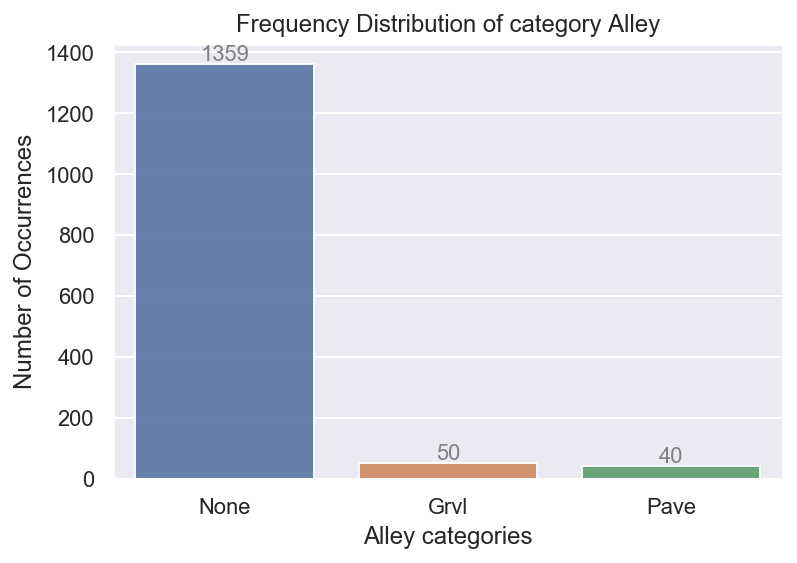

In [730]:
print('value counts of feature "Alley":\n{0}'.format(houseprice_df['Alley'].value_counts()))
cat_frequency_ditribution(houseprice_df,['Alley'])  

value counts of feature "LandSlope":
Gtl    1372
Mod      64
Sev      13
Name: LandSlope, dtype: int64


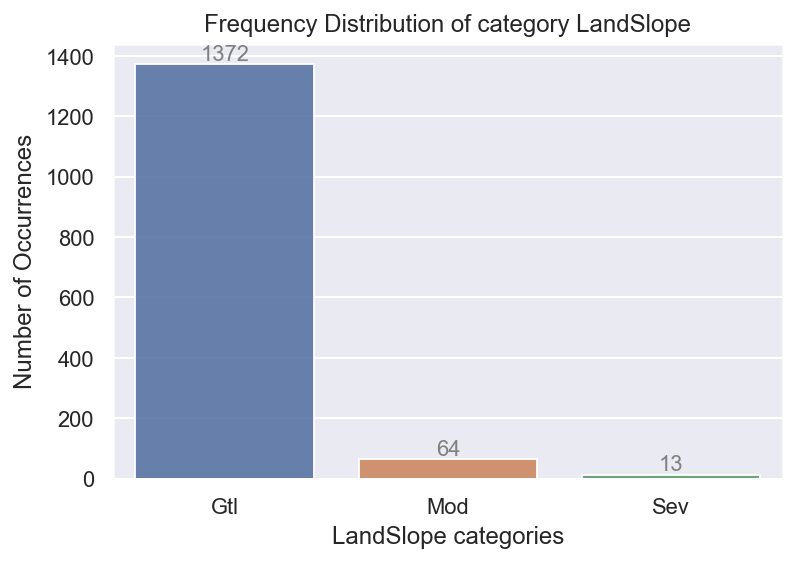

In [731]:
print('value counts of feature "LandSlope":\n{0}'.format(houseprice_df['LandSlope'].value_counts()))
cat_frequency_ditribution(houseprice_df,['LandSlope'])  

value counts of feature "PavedDrive":
Y    1329
N      90
P      30
Name: PavedDrive, dtype: int64


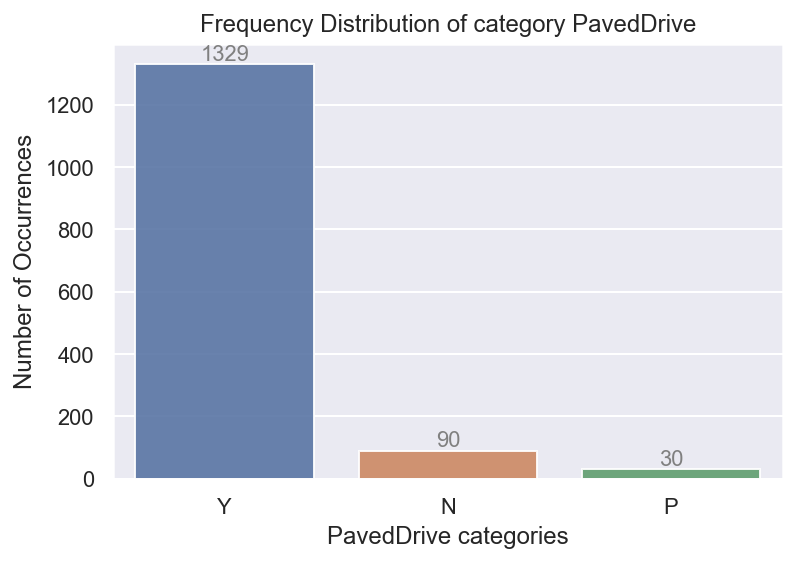

In [732]:
print('value counts of feature "PavedDrive":\n{0}'.format(houseprice_df['PavedDrive'].value_counts()))
cat_frequency_ditribution(houseprice_df,['PavedDrive'])  

value counts of feature "LotShape":
Reg    918
IR1    482
IR2     40
IR3      9
Name: LotShape, dtype: int64


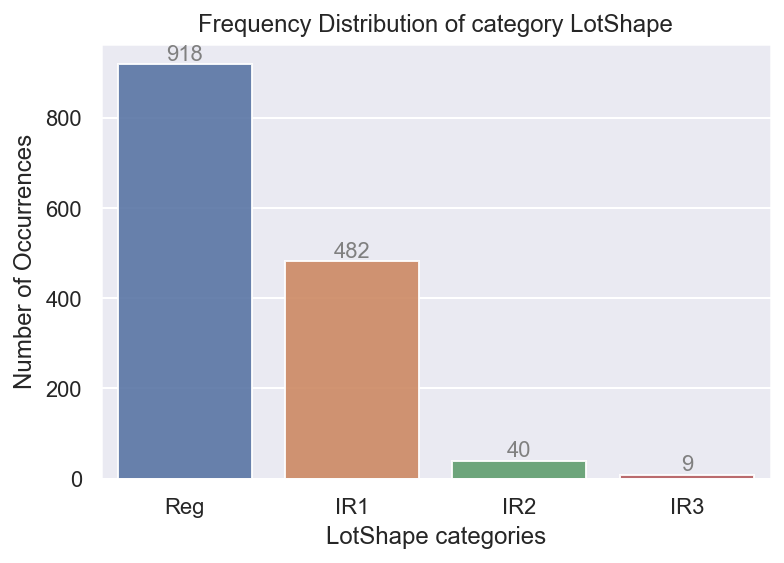

In [733]:
print('value counts of feature "LotShape":\n{0}'.format(houseprice_df['LotShape'].value_counts()))
cat_frequency_ditribution(houseprice_df,['LotShape'])

value counts of feature "LandContour":
Lvl    1302
Bnk      62
HLS      49
Low      36
Name: LandContour, dtype: int64


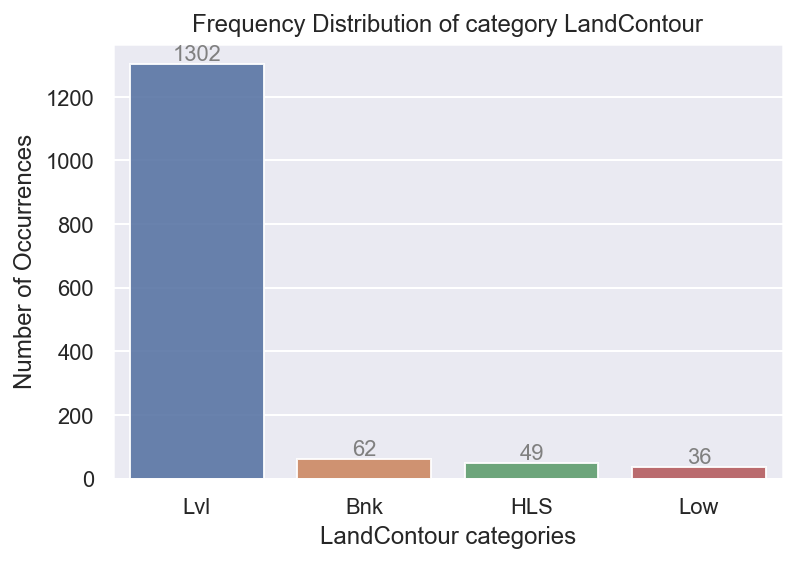

In [734]:
print('value counts of feature "LandContour":\n{0}'.format(houseprice_df['LandContour'].value_counts()))
cat_frequency_ditribution(houseprice_df,['LandContour'])

value counts of feature "MasVnrType":
None       862
BrkFace    445
Stone      127
BrkCmn      15
Name: MasVnrType, dtype: int64


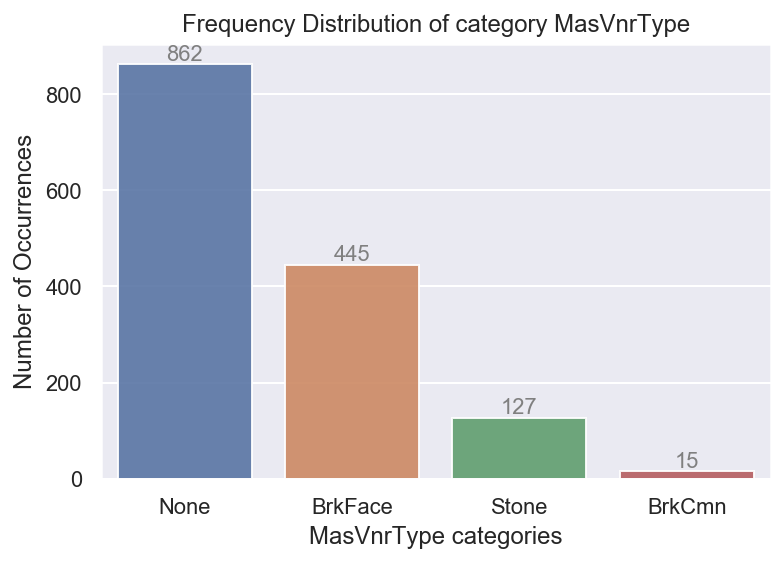

In [735]:
print('value counts of feature "MasVnrType":\n{0}'.format(houseprice_df['MasVnrType'].value_counts()))
cat_frequency_ditribution(houseprice_df,['MasVnrType'])

value counts of feature "ExterQual":
TA    904
Gd    481
Ex     50
Fa     14
Name: ExterQual, dtype: int64


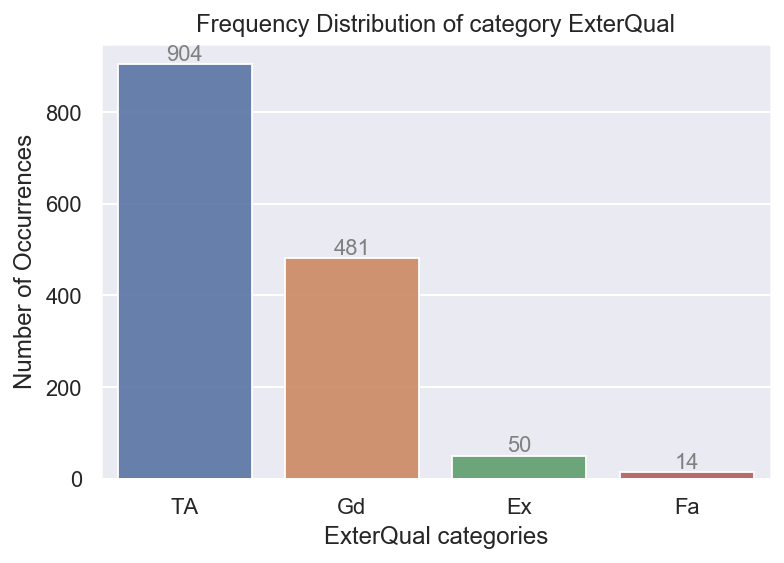

In [736]:
print('value counts of feature "ExterQual":\n{0}'.format(houseprice_df['ExterQual'].value_counts()))
cat_frequency_ditribution(houseprice_df,['ExterQual'])

value counts of feature "GarageFinish":
Unf     605
RFn     417
Fin     346
None     81
Name: GarageFinish, dtype: int64


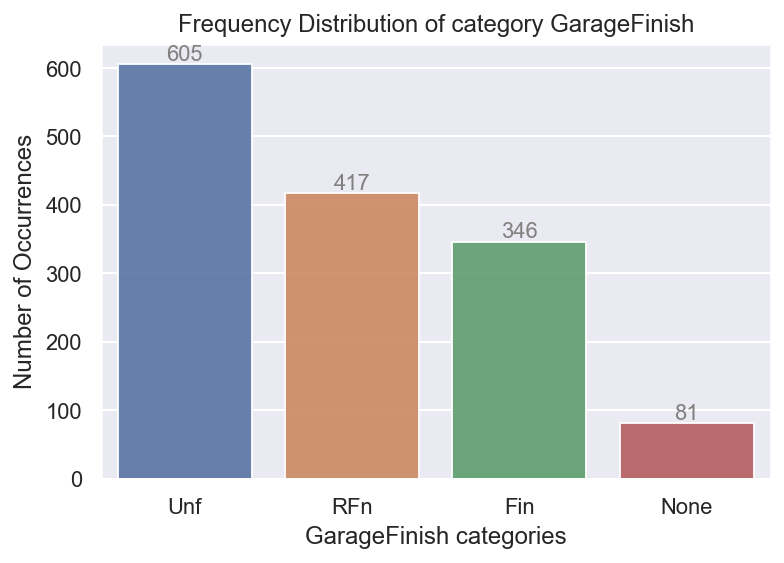

In [737]:
print('value counts of feature "GarageFinish":\n{0}'.format(houseprice_df['GarageFinish'].value_counts()))
cat_frequency_ditribution(houseprice_df,['GarageFinish'])

value counts of feature "KitchenQual":
TA    734
Gd    578
Ex     98
Fa     39
Name: KitchenQual, dtype: int64


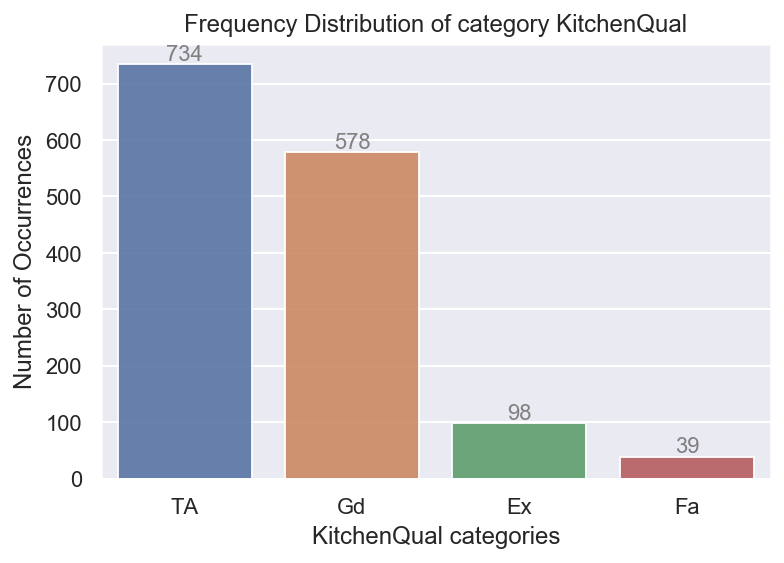

In [738]:
print('value counts of feature "KitchenQual":\n{0}'.format(houseprice_df['KitchenQual'].value_counts()))
cat_frequency_ditribution(houseprice_df,['KitchenQual'])

value counts of feature "BsmtExposure":
No      945
Av      221
Gd      131
Mn      114
None     38
Name: BsmtExposure, dtype: int64


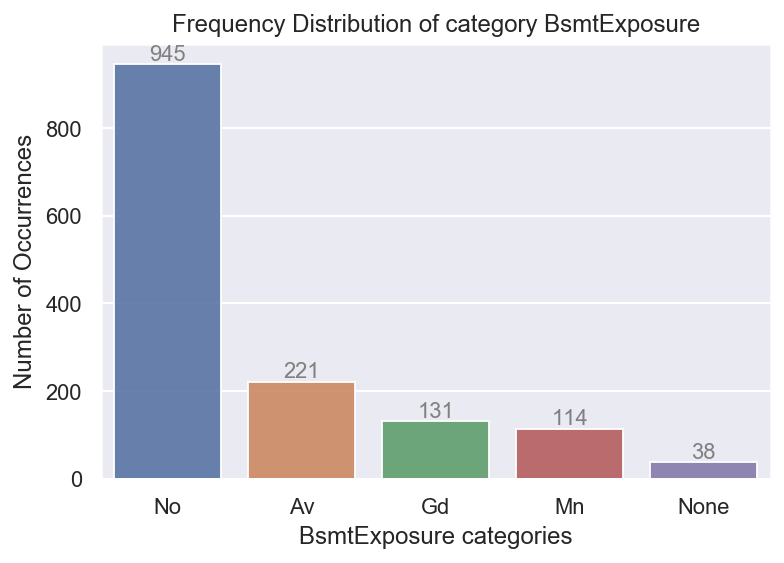

In [739]:
print('value counts of feature "BsmtExposure":\n{0}'.format(houseprice_df['BsmtExposure'].value_counts()))
cat_frequency_ditribution(houseprice_df,['BsmtExposure'])

value counts of feature "HeatingQC":
Ex    732
TA    427
Gd    240
Fa     49
Po      1
Name: HeatingQC, dtype: int64


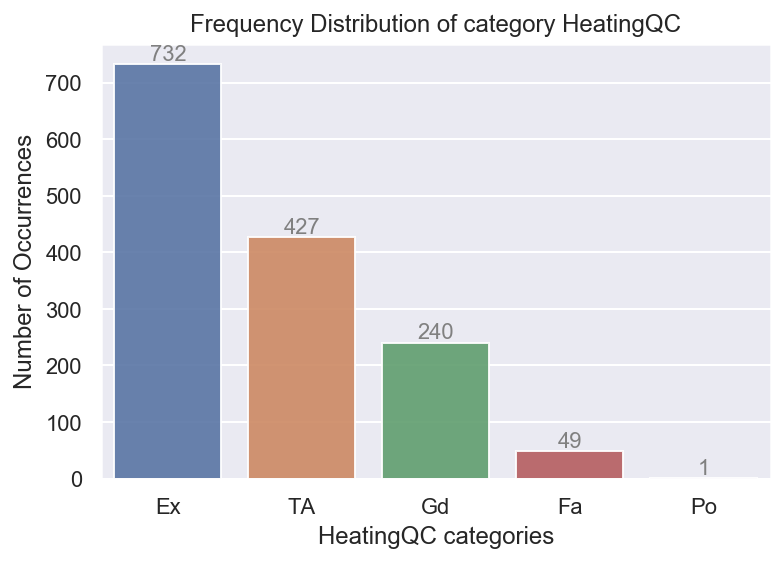

In [740]:
print('value counts of feature "HeatingQC":\n{0}'.format(houseprice_df['HeatingQC'].value_counts()))
cat_frequency_ditribution(houseprice_df,['HeatingQC'])

value counts of feature "MSZoning":
RL         1143
RM          218
FV           62
RH           16
C (all)      10
Name: MSZoning, dtype: int64


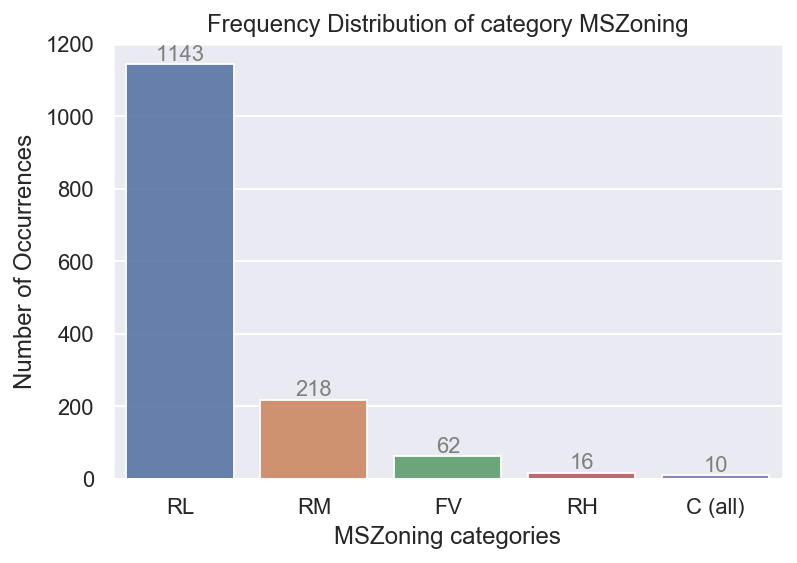

In [741]:
print('value counts of feature "MSZoning":\n{0}'.format(houseprice_df['MSZoning'].value_counts()))
cat_frequency_ditribution(houseprice_df,['MSZoning'])

value counts of feature "Fence":
None     1168
MnPrv     157
GdPrv      59
GdWo       54
MnWw       11
Name: Fence, dtype: int64


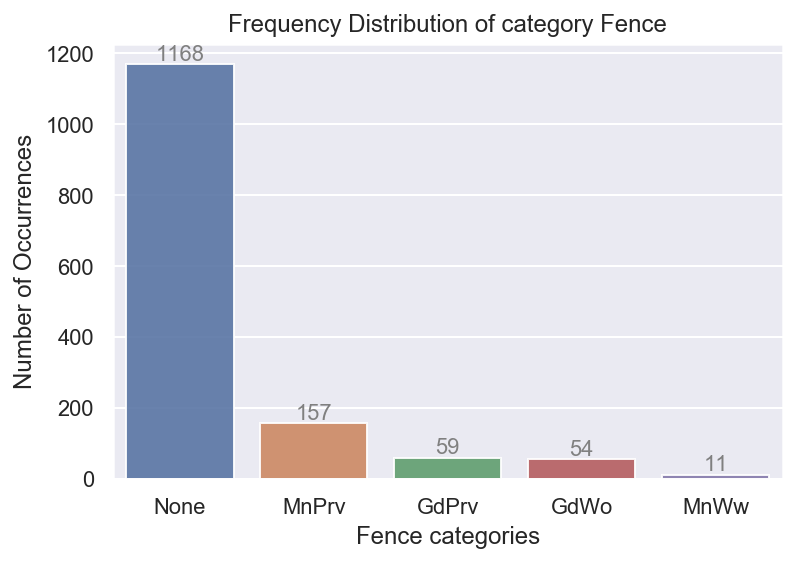

In [742]:
print('value counts of feature "Fence":\n{0}'.format(houseprice_df['Fence'].value_counts()))
cat_frequency_ditribution(houseprice_df,['Fence'])

value counts of feature "MiscFeature":
None    1395
Shed      49
Gar2       2
Othr       2
TenC       1
Name: MiscFeature, dtype: int64


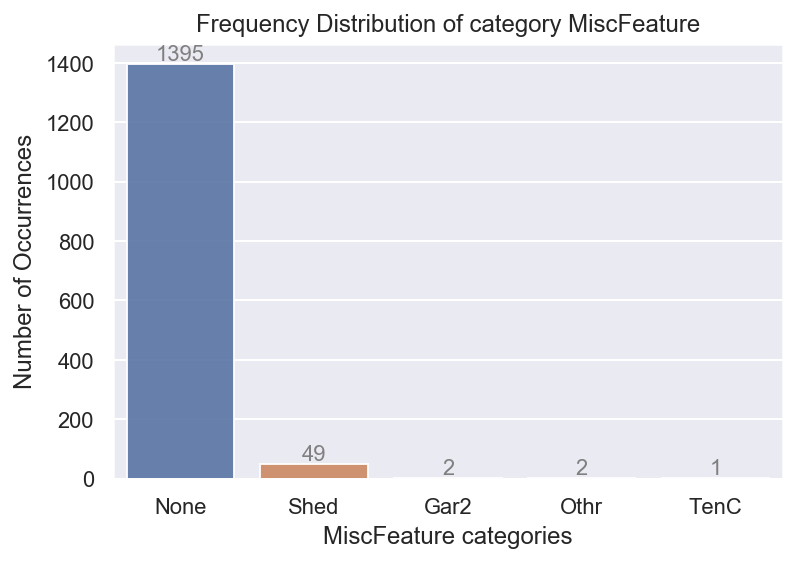

In [743]:
print('value counts of feature "MiscFeature":\n{0}'.format(houseprice_df['MiscFeature'].value_counts()))
cat_frequency_ditribution(houseprice_df,['MiscFeature'])

#### MiscFeature categories 'Gar2' and 'Tenc' have very less observations. Lets combine these category values with value Othr

In [744]:
houseprice_df['MiscFeature'] = houseprice_df['MiscFeature'].replace({'Gar2':'Othr','TenC':'Othr'})
houseprice_df['MiscFeature'].value_counts()

None    1395
Shed      49
Othr       5
Name: MiscFeature, dtype: int64

value counts of feature "Electrical":
SBrkr    1324
FuseA      94
FuseF      27
FuseP       3
Mix         1
Name: Electrical, dtype: int64


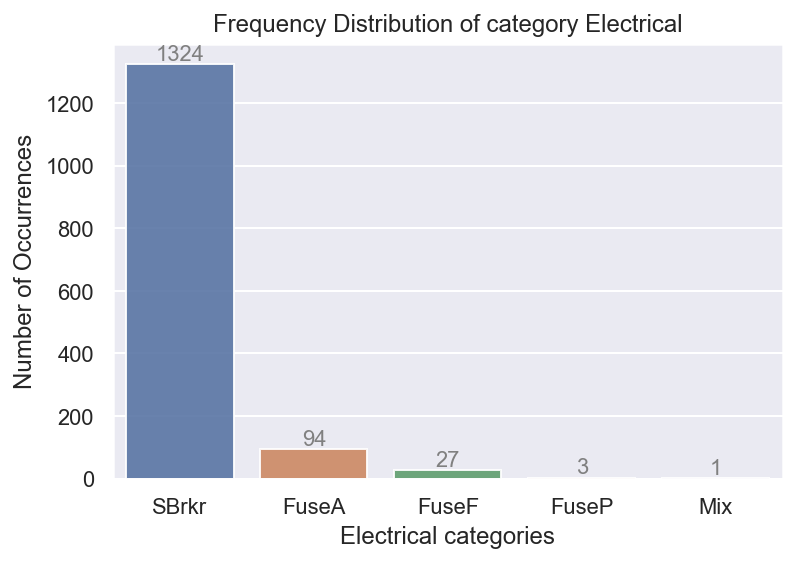

In [745]:
print('value counts of feature "Electrical":\n{0}'.format(houseprice_df['Electrical'].value_counts()))
cat_frequency_ditribution(houseprice_df,['Electrical'])

#### Since for 'Electrical' there is no available category 'Other' so lets keep the category values as it is
- While creating dummy variables we will drop the category 'Mix'

value counts of feature "BsmtCond":
TA      1301
Gd        64
Fa        45
None      37
Po         2
Name: BsmtCond, dtype: int64


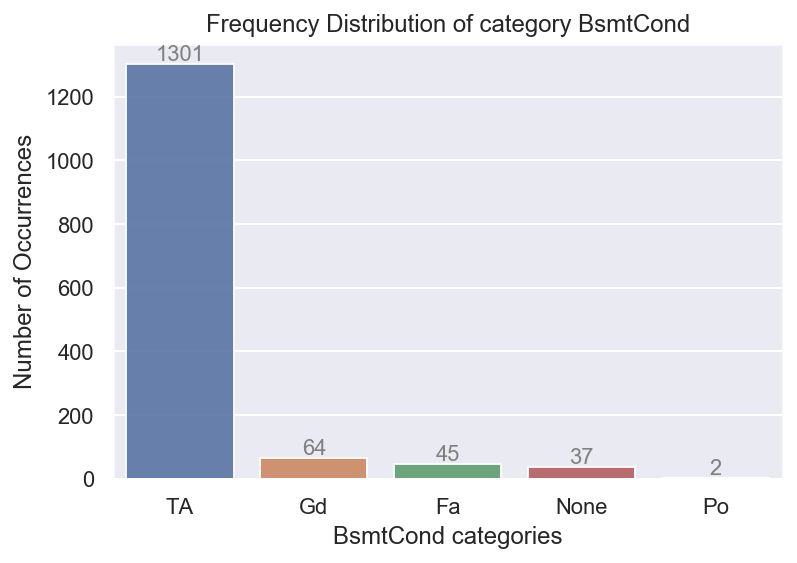

In [746]:
print('value counts of feature "BsmtCond":\n{0}'.format(houseprice_df['BsmtCond'].value_counts()))
cat_frequency_ditribution(houseprice_df,['BsmtCond'])

value counts of feature "BsmtQual":
TA      648
Gd      610
Ex      119
None     37
Fa       35
Name: BsmtQual, dtype: int64


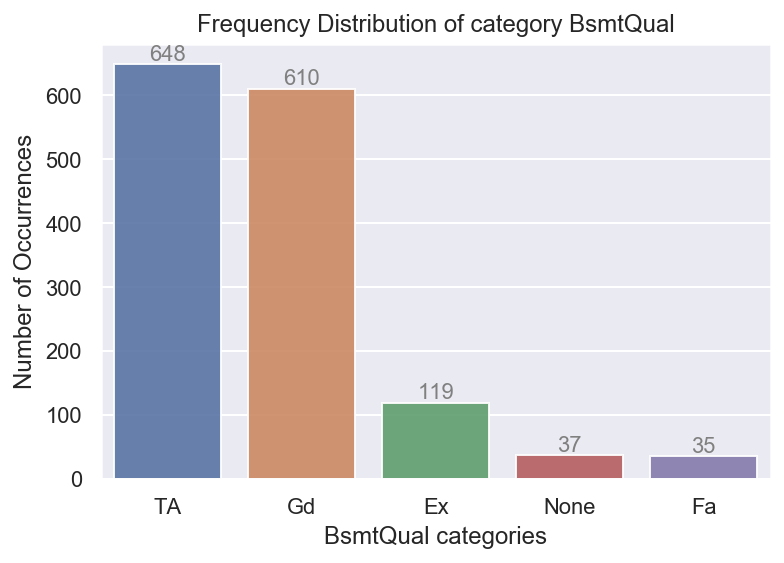

In [747]:
print('value counts of feature "BsmtQual":\n{0}'.format(houseprice_df['BsmtQual'].value_counts()))
cat_frequency_ditribution(houseprice_df,['BsmtQual'])

value counts of feature "ExterCond":
TA    1271
Gd     146
Fa      28
Ex       3
Po       1
Name: ExterCond, dtype: int64


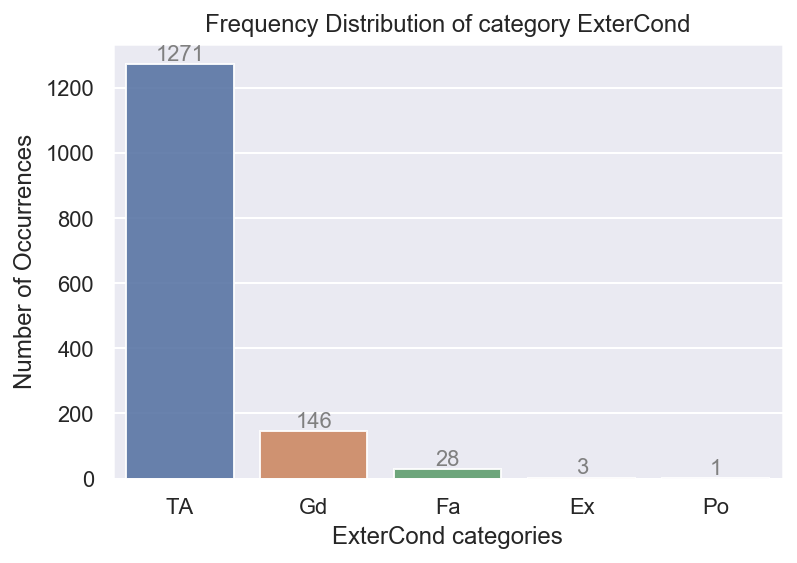

In [748]:
print('value counts of feature "ExterCond":\n{0}'.format(houseprice_df['ExterCond'].value_counts()))
cat_frequency_ditribution(houseprice_df,['ExterCond'])

value counts of feature "LotConfig":
Inside     1044
Corner      261
CulDSac      93
FR2          47
FR3           4
Name: LotConfig, dtype: int64


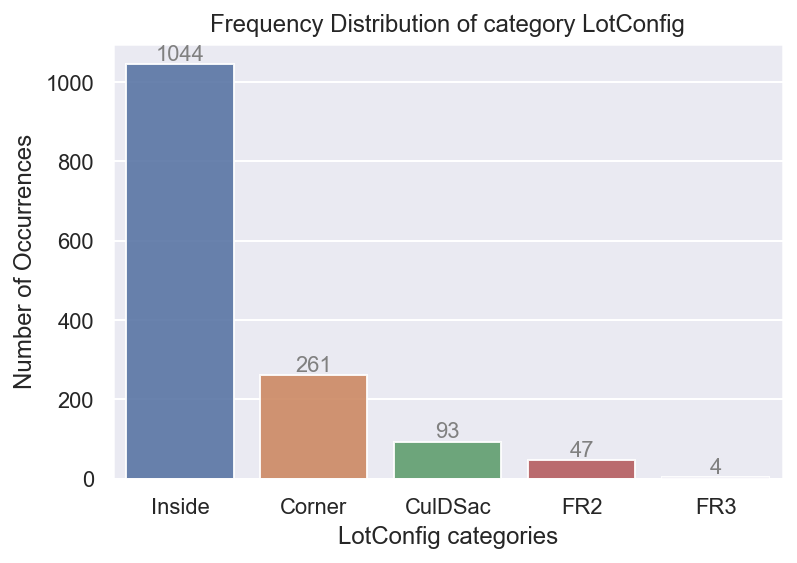

In [749]:
print('value counts of feature "LotConfig":\n{0}'.format(houseprice_df['LotConfig'].value_counts()))
cat_frequency_ditribution(houseprice_df,['LotConfig'])

value counts of feature "BldgType":
1Fam      1210
TwnhsE     113
Duplex      52
Twnhs       43
2fmCon      31
Name: BldgType, dtype: int64


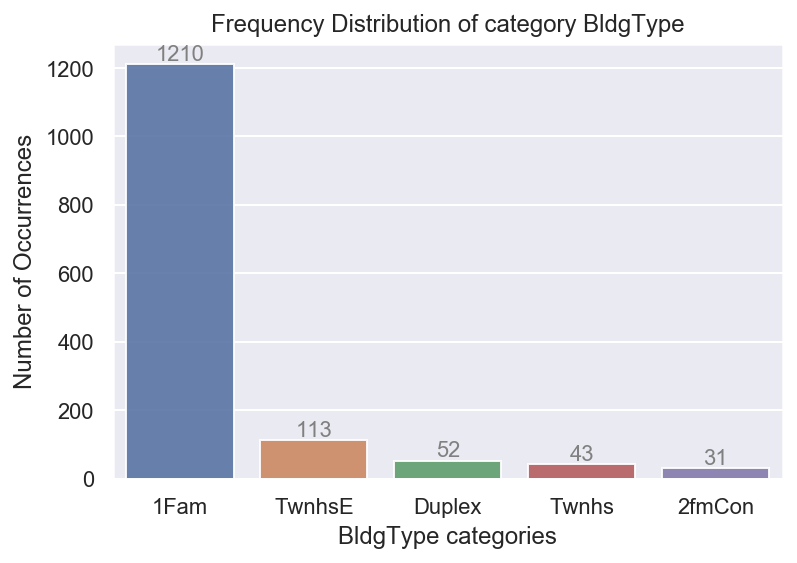

In [750]:
print('value counts of feature "BldgType":\n{0}'.format(houseprice_df['BldgType'].value_counts()))
cat_frequency_ditribution(houseprice_df,['BldgType'])

value counts of feature "FireplaceQu":
None    685
Gd      376
TA      311
Fa       33
Ex       24
Po       20
Name: FireplaceQu, dtype: int64


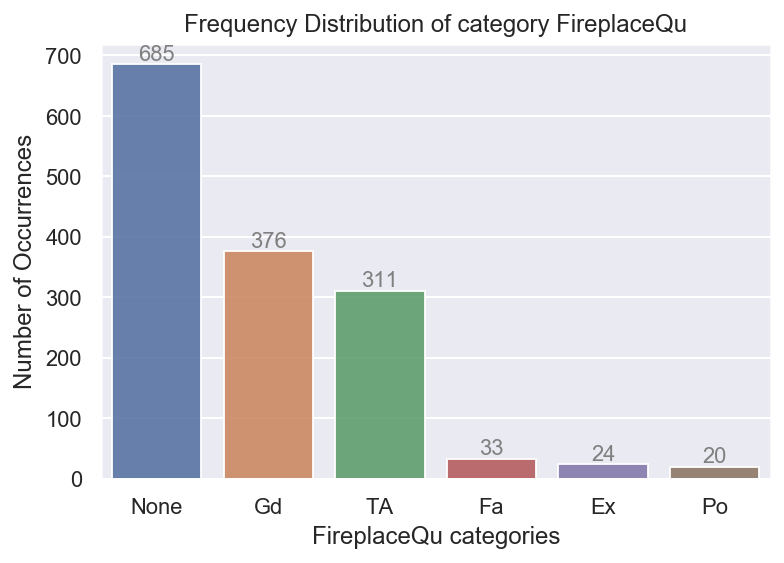

In [751]:
print('value counts of feature "FireplaceQu":\n{0}'.format(houseprice_df['FireplaceQu'].value_counts()))
cat_frequency_ditribution(houseprice_df,['FireplaceQu'])

value counts of feature "GarageCond":
TA      1315
None      81
Fa        35
Gd         9
Po         7
Ex         2
Name: GarageCond, dtype: int64


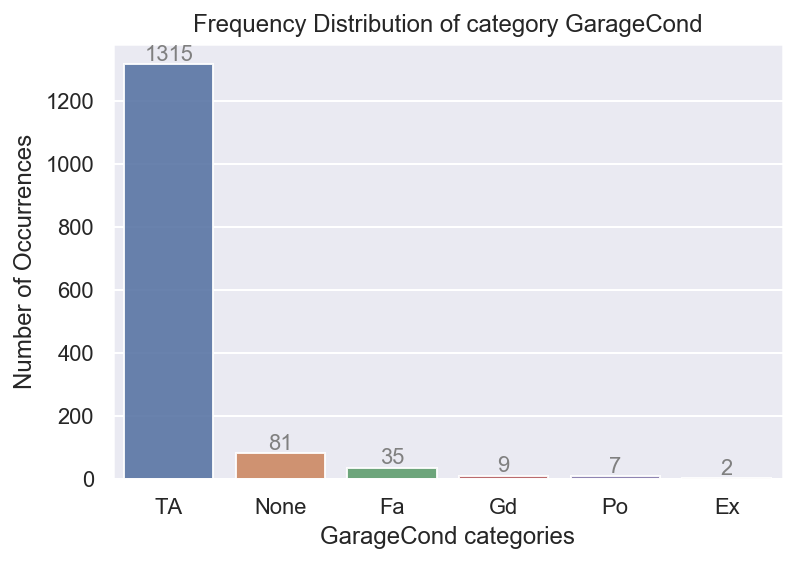

In [752]:
print('value counts of feature "GarageCond":\n{0}'.format(houseprice_df['GarageCond'].value_counts()))
cat_frequency_ditribution(houseprice_df,['GarageCond'])

value counts of feature "GarageQual":
TA      1300
None      81
Fa        48
Gd        14
Po         3
Ex         3
Name: GarageQual, dtype: int64


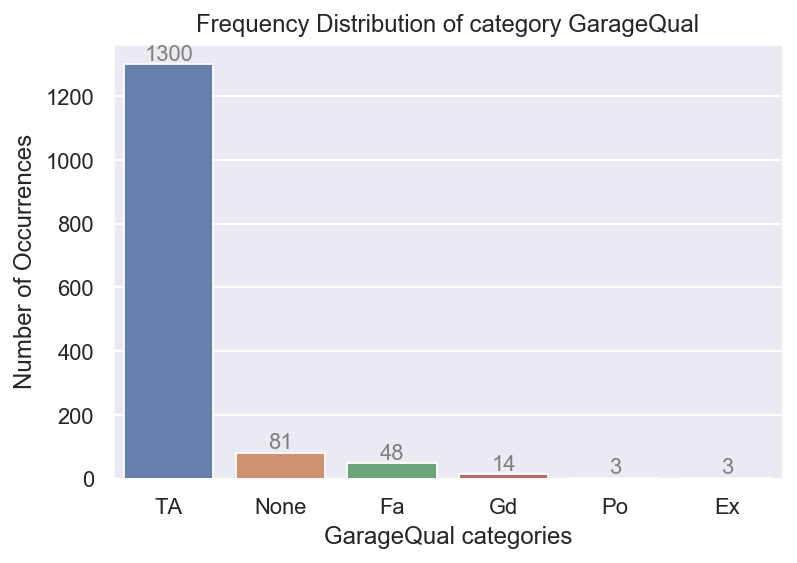

In [753]:
print('value counts of feature "GarageQual":\n{0}'.format(houseprice_df['GarageQual'].value_counts()))
cat_frequency_ditribution(houseprice_df,['GarageQual'])

value counts of feature "Foundation":
PConc     637
CBlock    633
BrkTil    146
Slab       24
Stone       6
Wood        3
Name: Foundation, dtype: int64


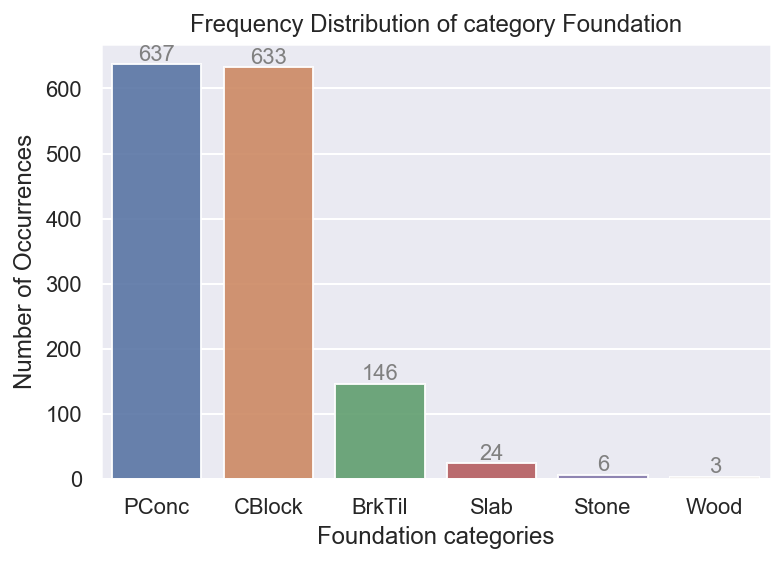

In [754]:
print('value counts of feature "Foundation":\n{0}'.format(houseprice_df['Foundation'].value_counts()))
cat_frequency_ditribution(houseprice_df,['Foundation'])

value counts of feature "RoofStyle":
Gable      1133
Hip         284
Flat         12
Gambrel      11
Mansard       7
Shed          2
Name: RoofStyle, dtype: int64


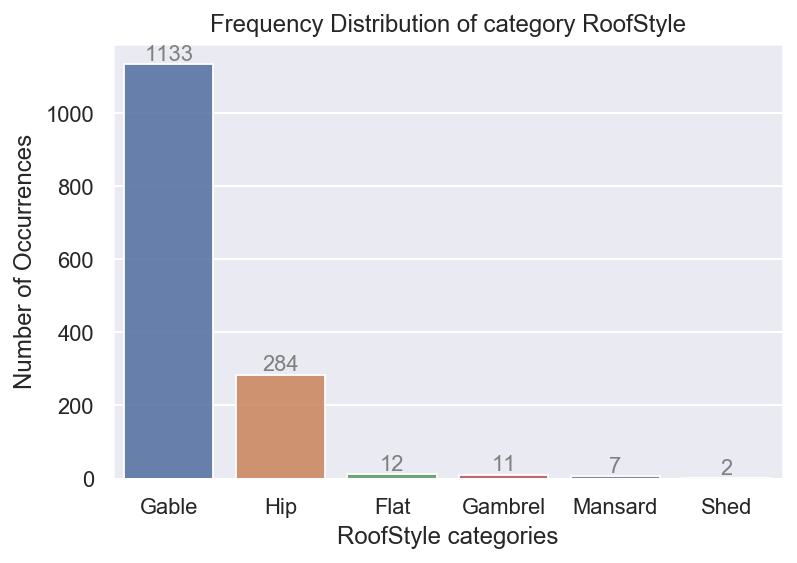

In [755]:
print('value counts of feature "RoofStyle":\n{0}'.format(houseprice_df['RoofStyle'].value_counts()))
cat_frequency_ditribution(houseprice_df,['RoofStyle'])

value counts of feature "SaleCondition":
Normal     1192
Partial     121
Abnorml     101
Family       20
Alloca       11
AdjLand       4
Name: SaleCondition, dtype: int64


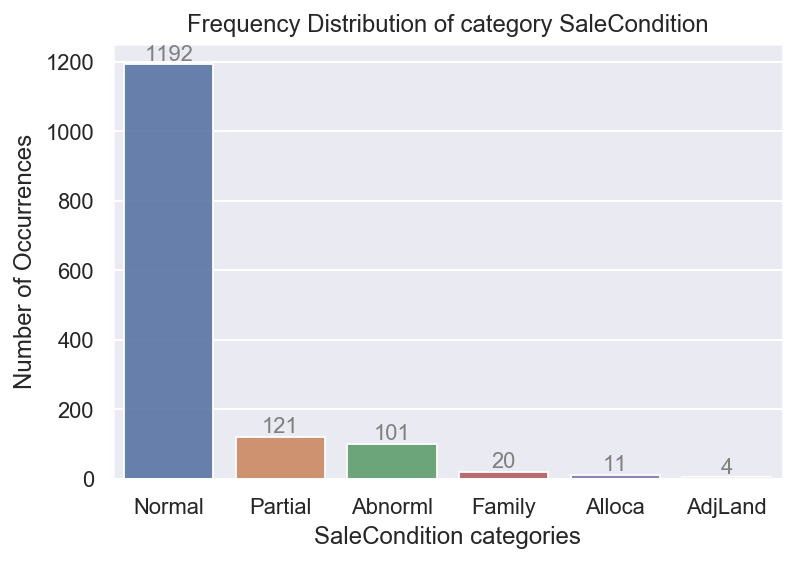

In [756]:
print('value counts of feature "SaleCondition":\n{0}'.format(houseprice_df['SaleCondition'].value_counts()))
cat_frequency_ditribution(houseprice_df,['SaleCondition'])

value counts of feature "Heating":
GasA     1417
GasW       18
Grav        7
Wall        4
OthW        2
Floor       1
Name: Heating, dtype: int64


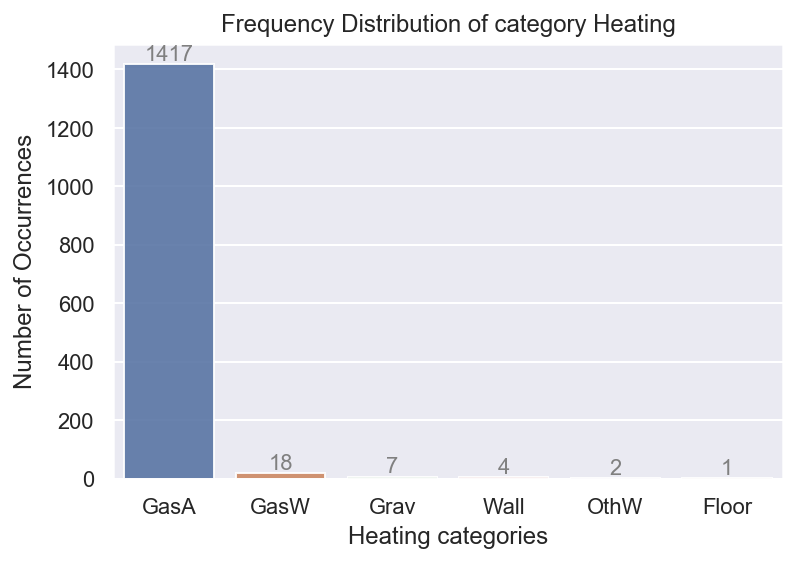

In [757]:
print('value counts of feature "Heating":\n{0}'.format(houseprice_df['Heating'].value_counts()))
cat_frequency_ditribution(houseprice_df,['Heating'])

value counts of feature "Functional":
Typ     1350
Min2      34
Min1      31
Mod       15
Maj1      13
Maj2       5
Sev        1
Name: Functional, dtype: int64


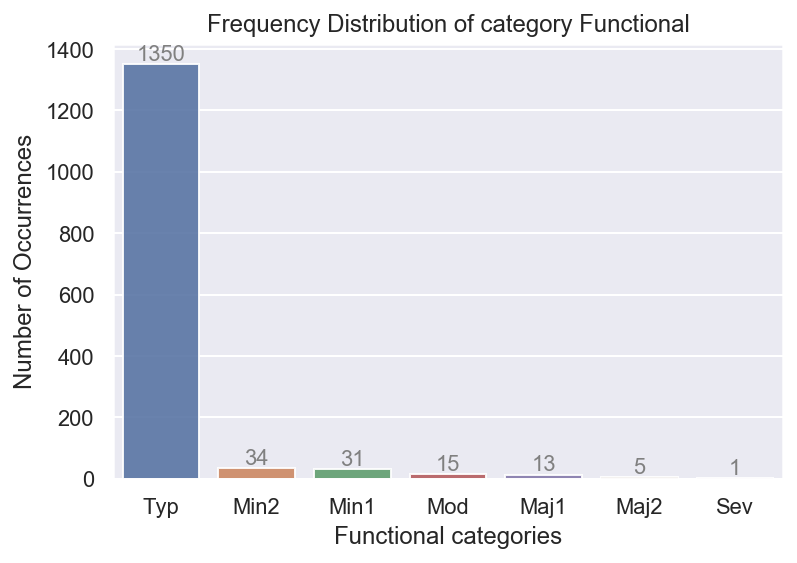

In [758]:
print('value counts of feature "Functional":\n{0}'.format(houseprice_df['Functional'].value_counts()))
cat_frequency_ditribution(houseprice_df,['Functional'])

value counts of feature "GarageType":
Attchd     861
Detchd     387
BuiltIn     86
None        81
Basment     19
CarPort      9
2Types       6
Name: GarageType, dtype: int64


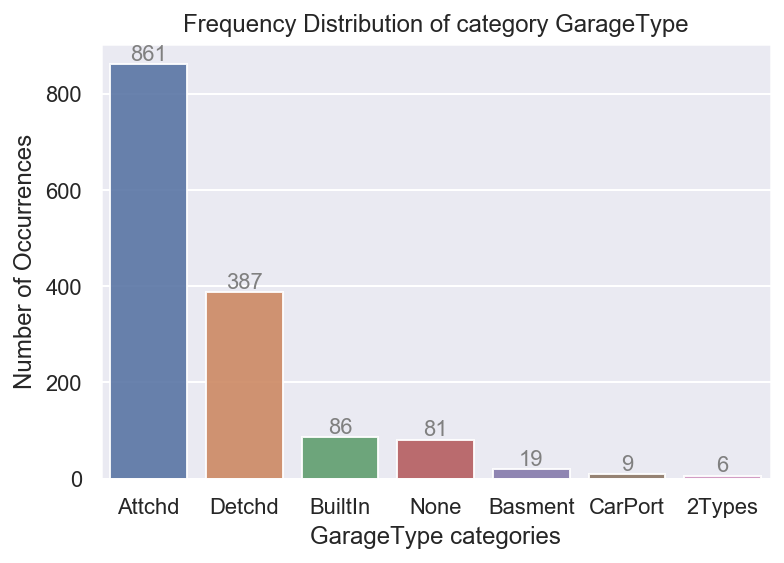

In [759]:
print('value counts of feature "GarageType":\n{0}'.format(houseprice_df['GarageType'].value_counts()))
cat_frequency_ditribution(houseprice_df,['GarageType'])

value counts of feature "BsmtFinType2":
Unf     1245
Rec       54
LwQ       46
None      38
BLQ       33
ALQ       19
GLQ       14
Name: BsmtFinType2, dtype: int64


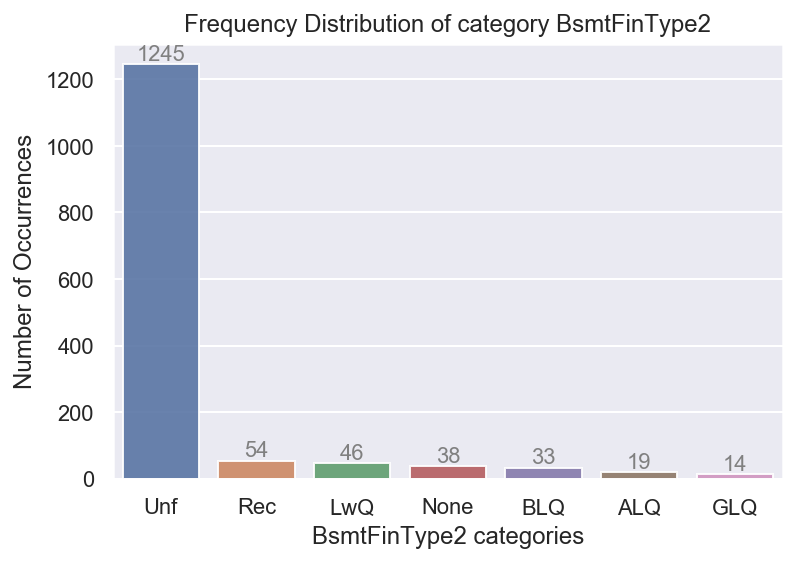

In [760]:
print('value counts of feature "BsmtFinType2":\n{0}'.format(houseprice_df['BsmtFinType2'].value_counts()))
cat_frequency_ditribution(houseprice_df,['BsmtFinType2'])

value counts of feature "BsmtFinType1":
Unf     427
GLQ     411
ALQ     220
BLQ     148
Rec     132
LwQ      74
None     37
Name: BsmtFinType1, dtype: int64


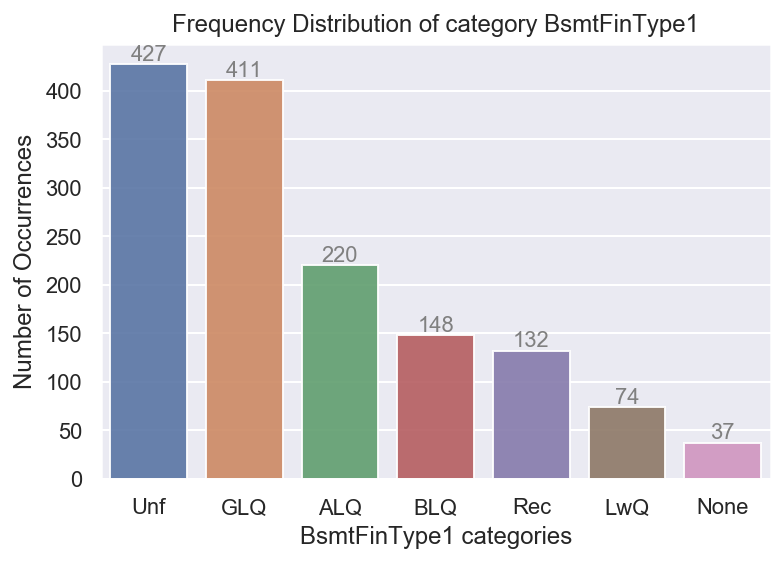

In [761]:
print('value counts of feature "BsmtFinType1":\n{0}'.format(houseprice_df['BsmtFinType1'].value_counts()))
cat_frequency_ditribution(houseprice_df,['BsmtFinType1'])

value counts of feature "RoofMatl":
CompShg    1425
Tar&Grv      10
WdShngl       6
WdShake       5
Membran       1
Metal         1
Roll          1
Name: RoofMatl, dtype: int64


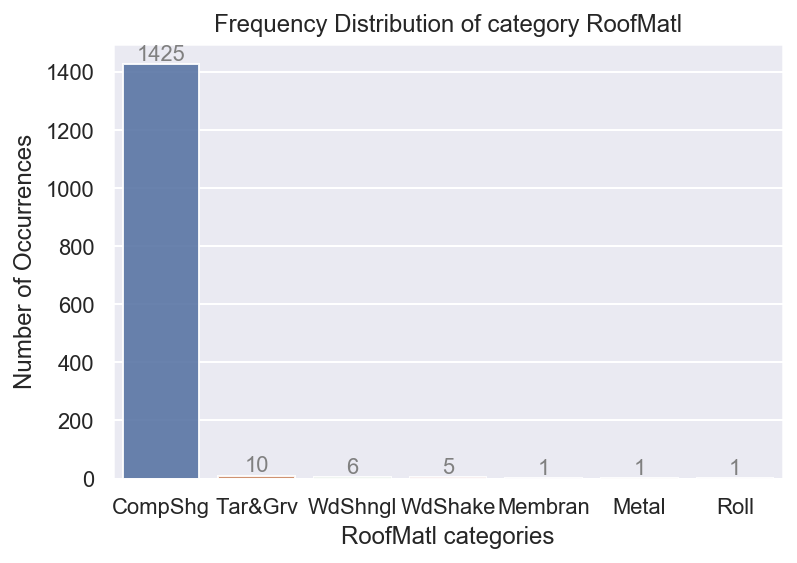

In [762]:
print('value counts of feature "RoofMatl":\n{0}'.format(houseprice_df['RoofMatl'].value_counts()))
cat_frequency_ditribution(houseprice_df,['RoofMatl'])

#### Lets replace category values 'Roll', 'Metal', 'Membran' with value 'Other'
- This is because there is one observation each for these category values. So its better to combine these category values into one

In [763]:
houseprice_df['RoofMatl'] = houseprice_df['RoofMatl'].replace({'Roll':'Other','Metal':'Other','Membran':'Other'})
houseprice_df['RoofMatl'].value_counts()

CompShg    1425
Tar&Grv      10
WdShngl       6
WdShake       5
Other         3
Name: RoofMatl, dtype: int64

value counts of feature "HouseStyle":
1Story    720
2Story    441
1.5Fin    154
SLvl       64
SFoyer     37
1.5Unf     14
2.5Unf     11
2.5Fin      8
Name: HouseStyle, dtype: int64


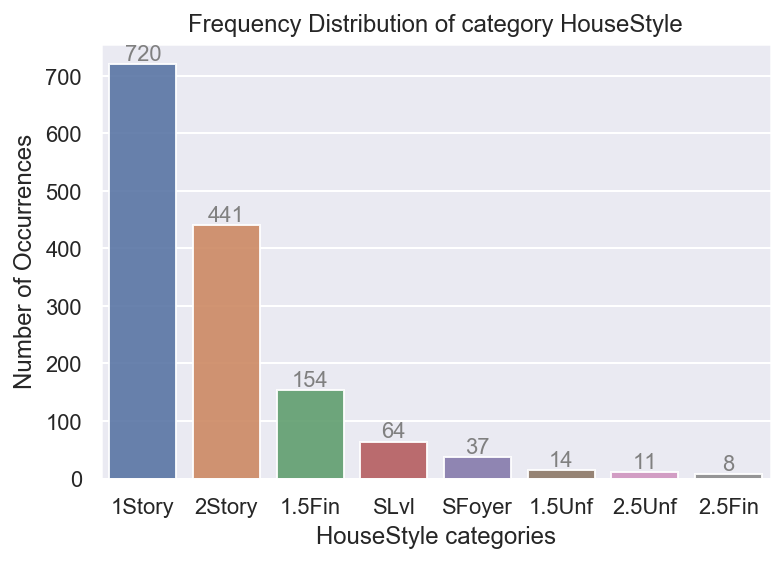

In [764]:
print('value counts of feature "HouseStyle":\n{0}'.format(houseprice_df['HouseStyle'].value_counts()))
cat_frequency_ditribution(houseprice_df,['HouseStyle'])

value counts of feature "Condition1":
Norm      1251
Feedr       80
Artery      48
RRAn        26
PosN        19
RRAe        11
PosA         7
RRNn         5
RRNe         2
Name: Condition1, dtype: int64


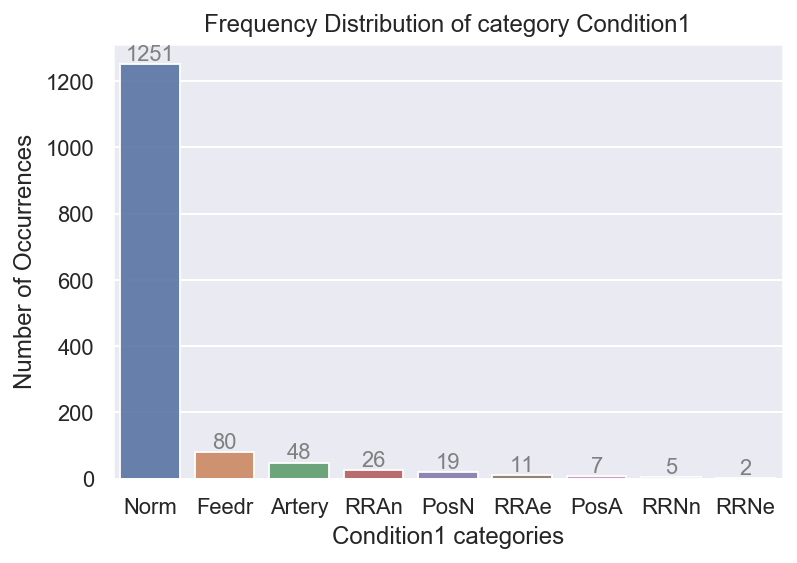

In [765]:
print('value counts of feature "Condition1":\n{0}'.format(houseprice_df['Condition1'].value_counts()))
cat_frequency_ditribution(houseprice_df,['Condition1'])

value counts of feature "SaleType":
WD       1260
New       118
COD        43
ConLD       9
ConLw       5
ConLI       5
CWD         4
Oth         3
Con         2
Name: SaleType, dtype: int64


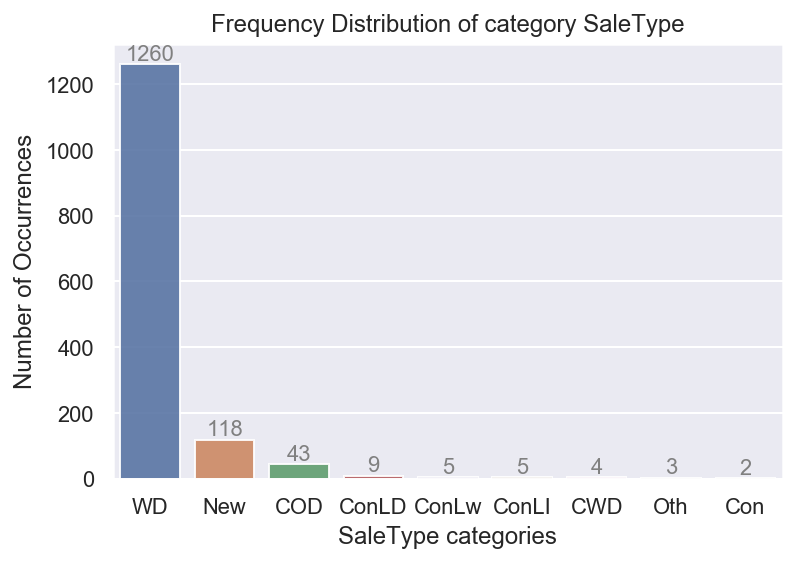

In [766]:
print('value counts of feature "SaleType":\n{0}'.format(houseprice_df['SaleType'].value_counts()))
cat_frequency_ditribution(houseprice_df,['SaleType'])

value counts of feature "Exterior1st":
VinylSd    509
HdBoard    222
MetalSd    220
Wd Sdng    204
Plywood    108
CemntBd     59
BrkFace     50
WdShing     26
Stucco      24
AsbShng     20
Stone        2
BrkComm      2
CBlock       1
ImStucc      1
AsphShn      1
Name: Exterior1st, dtype: int64


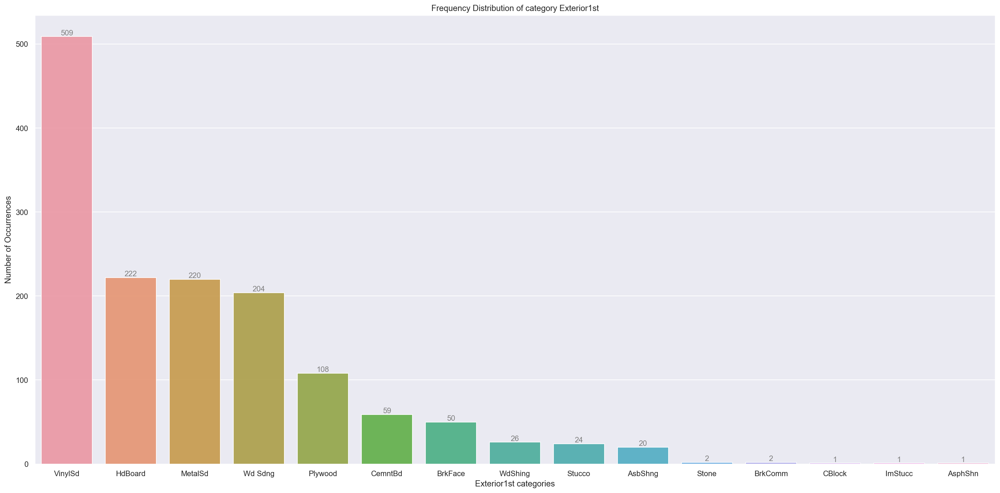

In [767]:
print('value counts of feature "Exterior1st":\n{0}'.format(houseprice_df['Exterior1st'].value_counts()))
cat_frequency_ditribution(houseprice_df,['Exterior1st'])

value counts of feature "Exterior2nd":
VinylSd    498
MetalSd    214
HdBoard    207
Wd Sdng    196
Plywood    142
CmentBd     58
Wd Shng     38
BrkFace     25
Stucco      25
AsbShng     20
ImStucc     10
Brk Cmn      7
Stone        4
AsphShn      3
CBlock       1
Other        1
Name: Exterior2nd, dtype: int64


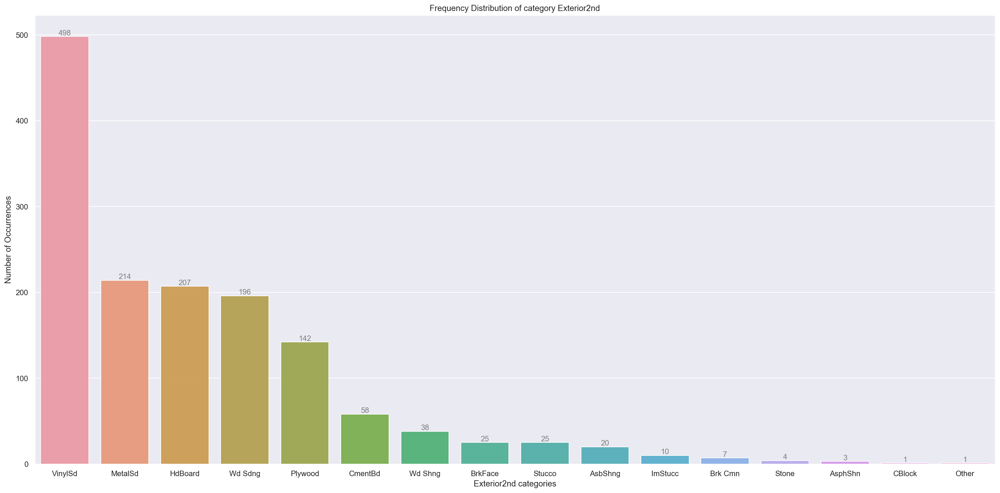

In [768]:
print('value counts of feature "Exterior2nd":\n{0}'.format(houseprice_df['Exterior2nd'].value_counts()))
cat_frequency_ditribution(houseprice_df,['Exterior2nd'])

value counts of feature "Neighborhood":
NAmes      224
CollgCr    149
OldTown    113
Edwards     99
Somerst     83
Gilbert     78
NridgHt     76
Sawyer      74
NWAmes      73
SawyerW     58
BrkSide     58
Crawfor     50
Mitchel     49
NoRidge     41
IDOTRR      37
Timber      37
ClearCr     28
SWISU       25
StoneBr     25
MeadowV     17
Blmngtn     17
BrDale      16
Veenker     11
NPkVill      9
Blueste      2
Name: Neighborhood, dtype: int64


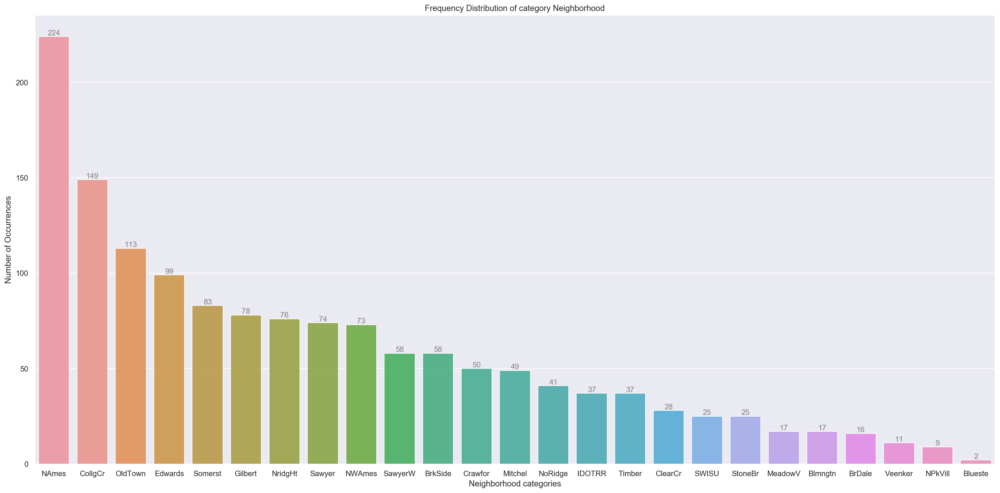

In [769]:
print('value counts of feature "Neighborhood":\n{0}'.format(houseprice_df['Neighborhood'].value_counts()))
cat_frequency_ditribution(houseprice_df,['Neighborhood'])

In [770]:
houseprice_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1449 entries, 0 to 1459
Data columns (total 76 columns):
SalePrice        1449 non-null float64
Id               1449 non-null int64
MSSubClass       1449 non-null object
MSZoning         1449 non-null object
LotFrontage      1449 non-null float64
LotArea          1449 non-null int64
Alley            1449 non-null object
LotShape         1449 non-null object
LandContour      1449 non-null object
LotConfig        1449 non-null object
LandSlope        1449 non-null object
Neighborhood     1449 non-null object
Condition1       1449 non-null object
BldgType         1449 non-null object
HouseStyle       1449 non-null object
OverallQual      1449 non-null int64
OverallCond      1449 non-null int64
YearBuilt        1449 non-null int64
YearRemodAdd     1449 non-null int64
RoofStyle        1449 non-null object
RoofMatl         1449 non-null object
Exterior1st      1449 non-null object
Exterior2nd      1449 non-null object
MasVnrType       1449 n

## 6.1.5 Percentage of data retained after data cleaning<a id='Data retained'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

In [771]:
(houseprice_df.shape[0]/original_rows)*100

99.24657534246575

# 7. Feature Engineering<a id='Feature Engineering'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

## Lets now convert year columns into datetime column

### Lets change the data type of column YearBuilt

In [772]:
#change the data type of column YearBuilt to datetime in houseprice_df
houseprice_df['YearBuilt'] = houseprice_df['YearBuilt'].astype(int).astype(str).apply(np.datetime64)
houseprice_df['YearBuilt'].dtype

dtype('<M8[ns]')

### Lets change the data type of column YearRemodAdd

In [773]:
#change the data type of column YearRemodAdd to datetime in houseprice_df
houseprice_df['YearRemodAdd'] = houseprice_df['YearRemodAdd'].astype(int).astype(str).apply(np.datetime64)
houseprice_df['YearRemodAdd'].dtype

dtype('<M8[ns]')

### Lets change the data type of column YrSold

In [774]:
#change the data type of column YrSold to datetime in houseprice_df
houseprice_df['YrSold'] = houseprice_df['YrSold'].astype(int).astype(str).apply(np.datetime64)
houseprice_df['YrSold'].dtype

dtype('<M8[ns]')

In [775]:
houseprice_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1449 entries, 0 to 1459
Data columns (total 76 columns):
SalePrice        1449 non-null float64
Id               1449 non-null int64
MSSubClass       1449 non-null object
MSZoning         1449 non-null object
LotFrontage      1449 non-null float64
LotArea          1449 non-null int64
Alley            1449 non-null object
LotShape         1449 non-null object
LandContour      1449 non-null object
LotConfig        1449 non-null object
LandSlope        1449 non-null object
Neighborhood     1449 non-null object
Condition1       1449 non-null object
BldgType         1449 non-null object
HouseStyle       1449 non-null object
OverallQual      1449 non-null int64
OverallCond      1449 non-null int64
YearBuilt        1449 non-null datetime64[ns]
YearRemodAdd     1449 non-null datetime64[ns]
RoofStyle        1449 non-null object
RoofMatl         1449 non-null object
Exterior1st      1449 non-null object
Exterior2nd      1449 non-null object
MasVn

## Lets now create columns to define age of house 
- This is because with year column we cannot build column. We need to check how old is the house, how many years old is the renovation etc. This helps in determining the actual price of house. Old house leads to more depreciation. Because of this age is a better parameter for judgement than year
- For this, we will find the max year value of YrSold(the latest sale txn). This max year value we will set as base value and we will then deduct the YrBuilt value from this max year value for all observations. That will give us the age of house. (Please note that we replaced null values with 2099 only for GarageYrBlt and here calculating max year we are not using this value so should not be an issue)

In [776]:
MaxYearSold = np.datetime64(np.max(houseprice_df['YrSold']))
MaxYearSold.dtype


dtype('<M8[us]')

In [777]:
houseprice_df['YrSold'].dtype

dtype('<M8[ns]')

In [778]:
#houseprice_df['AgeOfHouse'] = np.max(houseprice_df['YrSold']) - houseprice_df['YearBuilt']
houseprice_df['AgeOfHouse'] = (((MaxYearSold - houseprice_df['YearBuilt']).dt.days)/365).astype(int)
houseprice_df['AgeOfRemodAdd'] = (((MaxYearSold - houseprice_df['YearRemodAdd']).dt.days)/365).astype(int)
houseprice_df['AgeOfGarage'] = (((MaxYearSold - houseprice_df['GarageYrBlt']).dt.days)/365).astype(int)

### For AgeOfGarage
- Now there will be cases where AgeOfGrage will be negative. This is because we replace null value in GarageYrBuilt with 2099
- In such cases, replace negative value with value 0

In [779]:
houseprice_df[(houseprice_df['AgeOfGarage']<0)|(houseprice_df['AgeOfRemodAdd']<0)|(houseprice_df['AgeOfHouse']<0)
         ][['AgeOfHouse','AgeOfRemodAdd','AgeOfGarage','GarageArea']]

,AgeOfHouse,AgeOfRemodAdd,AgeOfGarage,GarageArea
39,55,55,-89,0
48,90,2,-89,0
78,42,42,-89,0
88,95,28,-89,0
89,16,15,-89,0
99,51,51,-89,0
108,91,5,-89,0
125,75,28,-89,0
127,80,60,-89,0
140,39,39,-89,0


In [780]:
print('Total number of rows to be replaced where Age of Garage is negative: {0}'.format(
    houseprice_df[houseprice_df['AgeOfGarage']<0]['AgeOfGarage'].count()))
houseprice_df['AgeOfGarage'] = np.where((houseprice_df['AgeOfGarage']<0),0,houseprice_df['AgeOfGarage'])
print('Total number of rows now after replacement where Age of Garage is negative: {0}'.format(
    houseprice_df[houseprice_df['AgeOfGarage']<0]['AgeOfGarage'].count()))

Total number of rows to be replaced where Age of Garage is negative: 81
Total number of rows now after replacement where Age of Garage is negative: 0


In [781]:
## Drop columns of Yrs since we wont need these columns anymore in our model building
print('number of columns before dropping year related columns are: {0}'.format(houseprice_df.shape[1]))
houseprice_df.drop(columns=['YearBuilt','YearRemodAdd','YrSold','GarageYrBlt'], inplace=True)
print('number of columns before dropping year related columns are: {0}'.format(houseprice_df.shape[1]))

number of columns before dropping year related columns are: 79
number of columns before dropping year related columns are: 75


## Lets check for Basement Area

In [782]:
houseprice_df[['BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF']].head()

,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF
0,706,0,150,856
1,978,0,284,1262
2,486,0,434,920
3,216,0,540,756
4,655,0,490,1145


In [783]:
## Find such row where TotalBsmtSF is not equal to the sum of (BsmtFinSF1 + BsmtFinSF2 + BsmtUnfSF)
houseprice_df.loc[(houseprice_df['BsmtFinSF1'] + houseprice_df['BsmtFinSF2'] + houseprice_df['BsmtUnfSF'])
                                                               !=houseprice_df['TotalBsmtSF'],
                  ['BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF']
                 ]

,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF


### Observations from above cell
- It seems that TotalBsmtSF = BsmtFinSF1 + BsmtFinSF2 + BsmtUnfSF
- So we can keep TotalBsmtSF column and can drop other 3 columns
- Lets also check the correlation between these columns

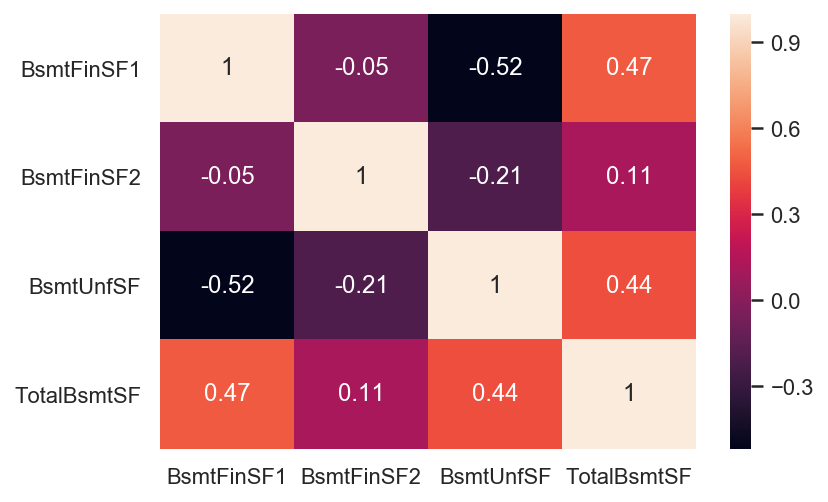

In [784]:
sns.heatmap(houseprice_df[['BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF']].corr(), annot=True)

In [785]:
bsmt_corr = houseprice_df[['BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','SalePrice']].corr()
bsmt_corr.style.apply(lambda x: ["background: lightblue" if abs(v) > 0.5 else "" for v in x], axis = 1)

,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,SalePrice
BsmtFinSF1,1,-0.0495059,-0.518889,0.472251,0.388734
BsmtFinSF2,-0.0495059,1,-0.210114,0.113583,0.00622363
BsmtUnfSF,-0.518889,-0.210114,1,0.437966,0.223784
TotalBsmtSF,0.472251,0.113583,0.437966,1,0.644399
SalePrice,0.388734,0.00622363,0.223784,0.644399,1


### From above heatmap
- Since there exists correlation amongst the Basement related columns and 
- since the correlation of TotalBsmtSF with target column 'SalePrice' is highest
- So we will drop columns 'BsmtFinSF1','BsmtFinSF2','BsmtUnfSF' and will keep only column 'TotalBsmtSF'

In [786]:
print('number of columns before dropping BasementSF Columns are: {0}'.format(houseprice_df.shape[1]))
houseprice_df.drop(columns=['BsmtFinSF1','BsmtFinSF2','BsmtUnfSF'],inplace=True)
print('number of columns after dropping BasementSF Columns are: {0}'.format(houseprice_df.shape[1]))

number of columns before dropping BasementSF Columns are: 75
number of columns after dropping BasementSF Columns are: 72


## Lets check for Ground Living Area

In [787]:
houseprice_df[['1stFlrSF','2ndFlrSF','LowQualFinSF','GrLivArea']].head()

,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea
0,856,854,0,1710
1,1262,0,0,1262
2,920,866,0,1786
3,961,756,0,1717
4,1145,1053,0,2198


#### Find such row where GrLivArea is not equal to the sum of (1stFlrSF + 2ndFlrSF + LowQualFinSF)

In [788]:
houseprice_df.loc[(houseprice_df['1stFlrSF'] + houseprice_df['2ndFlrSF'] + houseprice_df['LowQualFinSF'])
                                                               !=houseprice_df['GrLivArea'],
                  ['1stFlrSF','2ndFlrSF','LowQualFinSF','GrLivArea']
                 ]

,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea


#### Above cell shows that there are no such rows where GrLivArea is not equal to the sum of (1stFlrSF + 2ndFlrSF + LowQualFinSF)

### Observations from above cell
- It seems that GrLivArea = 1stFlrSF + 2ndFlrSF + LowQualFinSF
- So we can keep GrLivArea column and can drop other 3 columns
- Lets also check the correlation between these columns

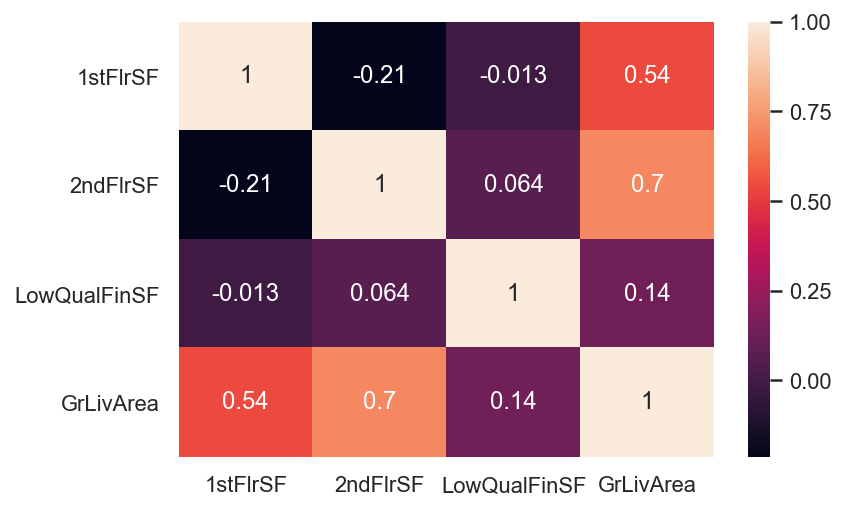

In [789]:
sns.heatmap(houseprice_df[['1stFlrSF','2ndFlrSF','LowQualFinSF','GrLivArea']].corr(), annot=True)

In [790]:
bsmt_corr = houseprice_df[['1stFlrSF','2ndFlrSF','LowQualFinSF','GrLivArea','SalePrice']].corr()
bsmt_corr.style.apply(lambda x: ["background: lightblue" if abs(v) > 0.5 else "" for v in x], axis = 1)

,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,SalePrice
1stFlrSF,1,-0.213146,-0.013471,0.543072,0.616981
2ndFlrSF,-0.213146,1,0.0637377,0.699409,0.322485
LowQualFinSF,-0.013471,0.0637377,1,0.139109,-0.0375173
GrLivArea,0.543072,0.699409,0.139109,1,0.717242
SalePrice,0.616981,0.322485,-0.0375173,0.717242,1


### From above heatmap
- Since there exists correlation amongst the Living Area related columns and 
- since the correlation of GrLivArea with target column 'SalePrice' is highest
- So we will drop columns '1stFlrSF','2ndFlrSF','LowQualFinSF' and will keep only column 'GrLivArea'

In [791]:
print('number of columns before dropping LivingArea Columns are: {0}'.format(houseprice_df.shape[1]))
houseprice_df.drop(columns=['1stFlrSF','2ndFlrSF','LowQualFinSF'],inplace=True)
print('number of columns after dropping LivingArea Columns are: {0}'.format(houseprice_df.shape[1]))

number of columns before dropping LivingArea Columns are: 72
number of columns after dropping LivingArea Columns are: 69


## Lets check for Porch Area

In [792]:
houseprice_df[['OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','WoodDeckSF']].head()

,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,WoodDeckSF
0,61,0,0,0,0
1,0,0,0,0,298
2,42,0,0,0,0
3,35,272,0,0,0
4,84,0,0,0,192


### Observations from above cell
- We do not have available any Total Porch area in the data set
- Lets combine all porch areas and create new column TotalPorchArea
- We will then drop the original columns
- Lets also check the correlation between these columns

In [793]:
houseprice_df['TotalPorchArea'] = (houseprice_df['OpenPorchSF'] + houseprice_df['EnclosedPorch']+
                                  houseprice_df['3SsnPorch'] + houseprice_df['ScreenPorch'] + 
                                   houseprice_df['WoodDeckSF'])
houseprice_df[['OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','WoodDeckSF','TotalPorchArea']].head()

,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,WoodDeckSF,TotalPorchArea
0,61,0,0,0,0,61
1,0,0,0,0,298,298
2,42,0,0,0,0,42
3,35,272,0,0,0,307
4,84,0,0,0,192,276


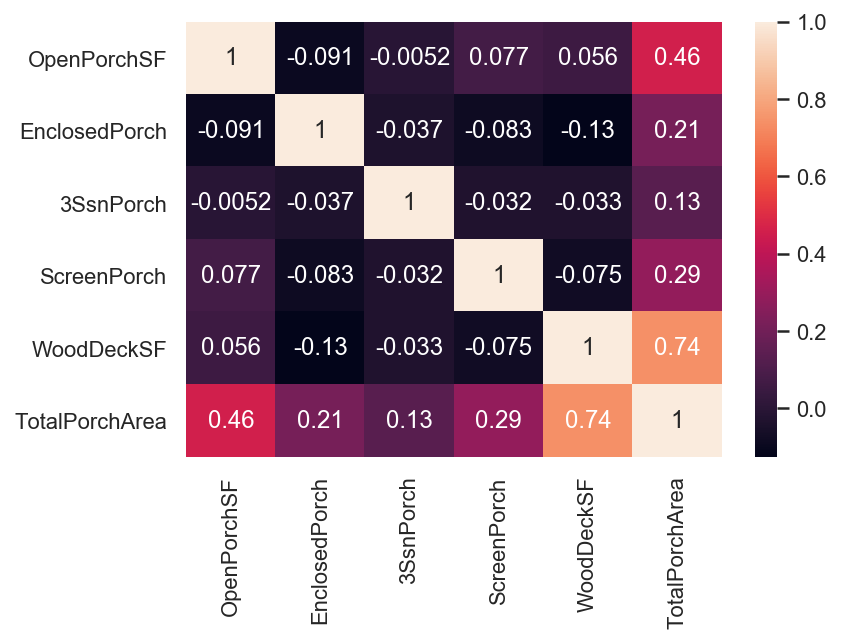

In [794]:
sns.heatmap(houseprice_df[['OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','WoodDeckSF',
                           'TotalPorchArea']].corr(),annot=True)

In [795]:
bsmt_corr = houseprice_df[['OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','WoodDeckSF',
                           'TotalPorchArea','SalePrice']].corr()
bsmt_corr.style.apply(lambda x: ["background: lightblue" if abs(v) > 0.5 else "" for v in x], axis = 1)

,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,WoodDeckSF,TotalPorchArea,SalePrice
OpenPorchSF,1,-0.0907726,-0.00524106,0.0766962,0.0564418,0.456267,0.319936
EnclosedPorch,-0.0907726,1,-0.0374875,-0.0832934,-0.125506,0.214985,-0.149384
3SsnPorch,-0.00524106,-0.0374875,1,-0.0316849,-0.0330054,0.133319,0.0556368
ScreenPorch,0.0766962,-0.0832934,-0.0316849,1,-0.074738,0.291184,0.122925
WoodDeckSF,0.0564418,-0.125506,-0.0330054,-0.074738,1,0.742994,0.335773
TotalPorchArea,0.456267,0.214985,0.133319,0.291184,0.742994,1,0.399465
SalePrice,0.319936,-0.149384,0.0556368,0.122925,0.335773,0.399465,1


### From above heatmap
- There exists very little correlation amongst the Porch related columns 
- We will drop columns 'OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','WoodDeckSF and will keep only column 'TotalPorchArea'

In [796]:
print('number of columns before dropping Porch related Columns are: {0}'.format(houseprice_df.shape[1]))
houseprice_df.drop(columns=['OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','WoodDeckSF'],inplace=True)
print('number of columns after dropping Porch related Columns are: {0}'.format(houseprice_df.shape[1]))

number of columns before dropping Porch related Columns are: 70
number of columns after dropping Porch related Columns are: 65


## Lets check for Bathrooms

In [797]:
houseprice_df[['BsmtFullBath','BsmtHalfBath','FullBath','HalfBath']].head()

,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath
0,1,0,2,1
1,0,1,2,0
2,1,0,2,1
3,1,0,1,0
4,1,0,2,1


### Observations from above cell
- We do not have available any Total Bath rooms in the data set
- Lets combine all bath rooms and create new column TotalBath
- Since we have half bath as well, so we will multiply Half bath with 0.5 and will add it to Full Bath
- We will then drop the original columns
- Lets also check the correlation between these columns

In [798]:
houseprice_df['TotalBath'] = (houseprice_df['BsmtFullBath'] + 0.5*houseprice_df['BsmtHalfBath']+
                                  houseprice_df['FullBath'] + 0.5*houseprice_df['HalfBath'])
houseprice_df[['BsmtFullBath','BsmtHalfBath','FullBath','HalfBath','TotalBath']].head()

,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,TotalBath
0,1,0,2,1,3.5
1,0,1,2,0,2.5
2,1,0,2,1,3.5
3,1,0,1,0,2.0
4,1,0,2,1,3.5


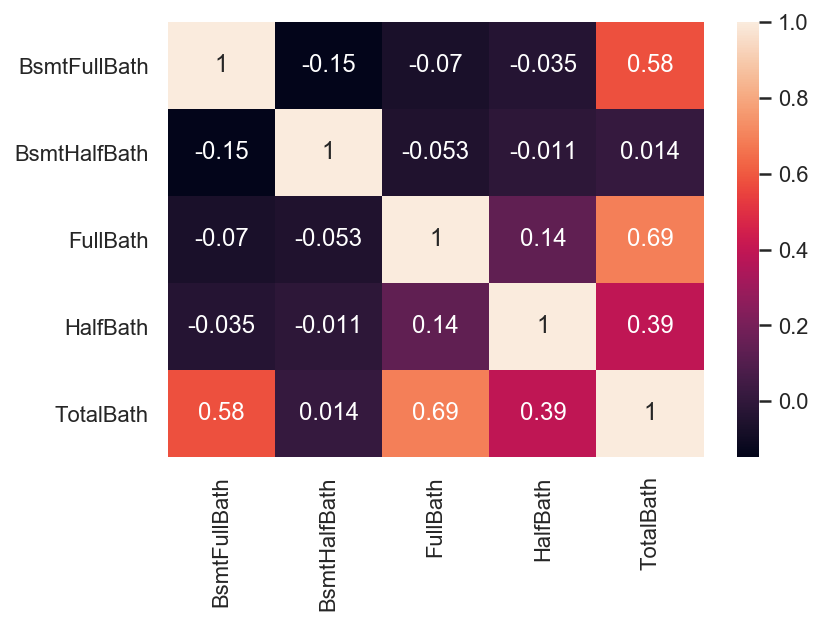

In [799]:
sns.heatmap(houseprice_df[['BsmtFullBath','BsmtHalfBath','FullBath','HalfBath','TotalBath']].corr(),annot=True)

In [800]:
bsmt_corr = houseprice_df[['BsmtFullBath','BsmtHalfBath','FullBath','HalfBath','TotalBath','SalePrice']].corr()
bsmt_corr.style.apply(lambda x: ["background: lightblue" if abs(v) > 0.5 else "" for v in x], axis = 1)

,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,TotalBath,SalePrice
BsmtFullBath,1,-0.147525,-0.0698509,-0.034912,0.578728,0.234486
BsmtHalfBath,-0.147525,1,-0.0533496,-0.0114704,0.0143736,-0.00401996
FullBath,-0.0698509,-0.0533496,1,0.137071,0.693764,0.595715
HalfBath,-0.034912,-0.0114704,0.137071,1,0.39308,0.313147
TotalBath,0.578728,0.0143736,0.693764,0.39308,1,0.674652
SalePrice,0.234486,-0.00401996,0.595715,0.313147,0.674652,1


### From above heatmap
- There exists very little correlation amongst the Porch related columns 
- We will drop columns 'BsmtFullBath','BsmtHalfBath','FullBath','HalfBath' and will keep only column 'TotalBath'

In [801]:
print('number of columns before dropping Bath related Columns are: {0}'.format(houseprice_df.shape[1]))
houseprice_df.drop(columns=['BsmtFullBath','BsmtHalfBath','FullBath','HalfBath'],inplace=True)
print('number of columns after dropping Bath related Columns are: {0}'.format(houseprice_df.shape[1]))

number of columns before dropping Bath related Columns are: 66
number of columns after dropping Bath related Columns are: 62


## Lets check the dataset information again

In [802]:
houseprice_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1449 entries, 0 to 1459
Data columns (total 62 columns):
SalePrice         1449 non-null float64
Id                1449 non-null int64
MSSubClass        1449 non-null object
MSZoning          1449 non-null object
LotFrontage       1449 non-null float64
LotArea           1449 non-null int64
Alley             1449 non-null object
LotShape          1449 non-null object
LandContour       1449 non-null object
LotConfig         1449 non-null object
LandSlope         1449 non-null object
Neighborhood      1449 non-null object
Condition1        1449 non-null object
BldgType          1449 non-null object
HouseStyle        1449 non-null object
OverallQual       1449 non-null int64
OverallCond       1449 non-null int64
RoofStyle         1449 non-null object
RoofMatl          1449 non-null object
Exterior1st       1449 non-null object
Exterior2nd       1449 non-null object
MasVnrType        1449 non-null object
MasVnrArea        1449 non-null float

In [803]:
houseprice_df.head()

,SalePrice,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,GrLivArea,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,Fence,MiscFeature,MiscVal,MoSold,SaleType,SaleCondition,AgeOfHouse,AgeOfRemodAdd,AgeOfGarage,TotalPorchArea,TotalBath
0,12.247699,1,60,RL,65.0,8450,None,Reg,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,856,GasA,Ex,1,SBrkr,1710,3,1,Gd,8,Typ,0,None,Attchd,RFn,2,548,TA,TA,Y,None,None,0,2,WD,Normal,7,7,7,61,3.5
1,12.109016,2,20,RL,80.0,9600,None,Reg,Lvl,FR2,Gtl,Veenker,Feedr,1Fam,1Story,6,8,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,1262,GasA,Ex,1,SBrkr,1262,3,1,TA,6,Typ,1,TA,Attchd,RFn,2,460,TA,TA,Y,None,None,0,5,WD,Normal,34,34,34,298,2.5
2,12.317171,3,60,RL,68.0,11250,None,IR1,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,920,GasA,Ex,1,SBrkr,1786,3,1,Gd,6,Typ,1,TA,Attchd,RFn,2,608,TA,TA,Y,None,None,0,9,WD,Normal,9,8,9,42,3.5
3,11.849405,4,70,RL,60.0,9550,None,IR1,Lvl,Corner,Gtl,Crawfor,Norm,1Fam,2Story,7,5,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,756,GasA,Gd,1,SBrkr,1717,3,1,Gd,7,Typ,1,Gd,Detchd,Unf,3,642,TA,TA,Y,None,None,0,2,WD,Abnorml,95,40,12,307,2.0
4,12.429220,5,60,RL,84.0,14260,None,IR1,Lvl,FR2,Gtl,NoRidge,Norm,1Fam,2Story,8,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,1145,GasA,Ex,1,SBrkr,2198,4,1,Gd,9,Typ,1,TA,Attchd,RFn,3,836,TA,TA,Y,None,None,0,12,WD,Normal,10,10,10,276,3.5


## Lets make list of category columns and numerical columns

### Since Id column is an identification number for an observation so we can safely drop this column

In [804]:
print('number of columns before dropping Id Column are: {0}'.format(houseprice_df.shape[1]))
houseprice_df.drop(columns=['Id'],inplace=True)
print('number of columns after dropping Id Column are: {0}'.format(houseprice_df.shape[1]))

number of columns before dropping Id Column are: 62
number of columns after dropping Id Column are: 61


In [805]:
category_columns=list(houseprice_df.select_dtypes(include=['object']).isnull())
print('category columns list:\n{0}'.format(category_columns))
print('\n')
numerical_columns=list(houseprice_df.select_dtypes(exclude=['object']).isnull())
print('numerical columns list:\n{0}'.format(numerical_columns))

category columns list:
['MSSubClass', 'MSZoning', 'Alley', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'Fence', 'MiscFeature', 'MoSold', 'SaleType', 'SaleCondition']


numerical columns list:
['SalePrice', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'TotalBsmtSF', 'CentralAir', 'GrLivArea', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'MiscVal', 'AgeOfHouse', 'AgeOfRemodAdd', 'AgeOfGarage', 'TotalPorchArea', 'TotalBath']


# 8. Exploratory Data Analysis after data cleaning<a id='EDA after data cleaning'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

## 8.1 Univariate Analysis<a id='Univariate analysis'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

## Lets create pairplot of numerical features

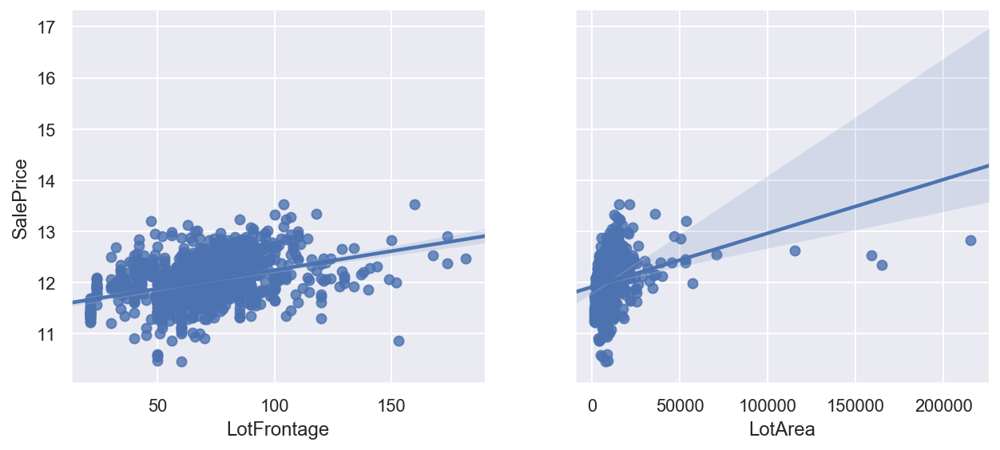

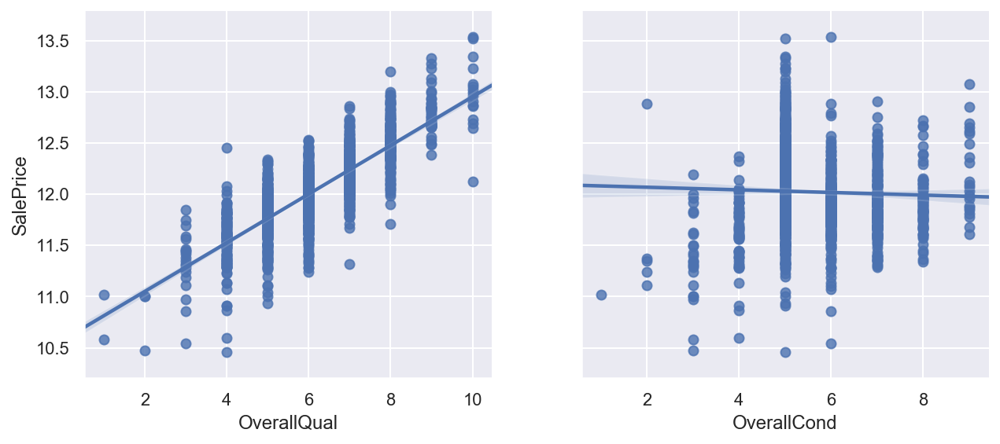

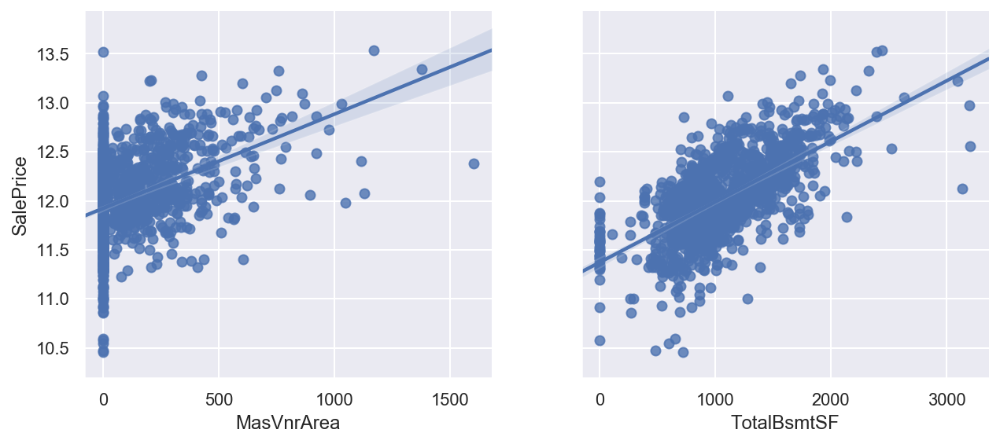

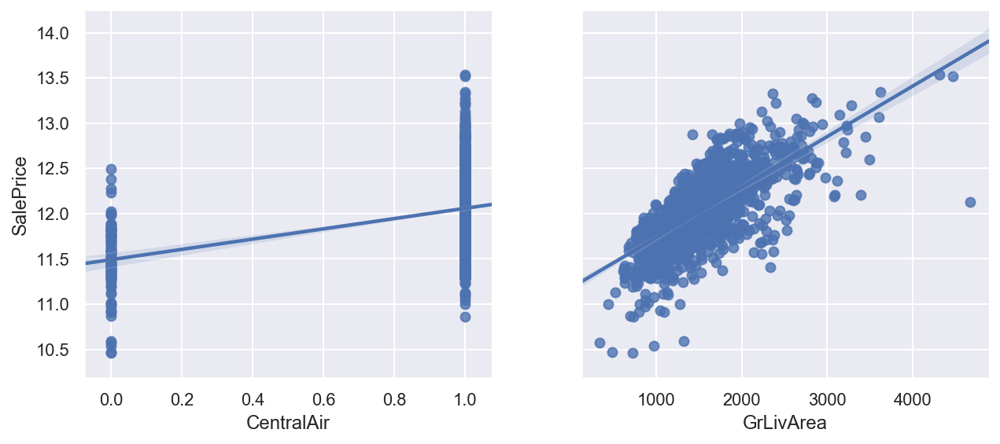

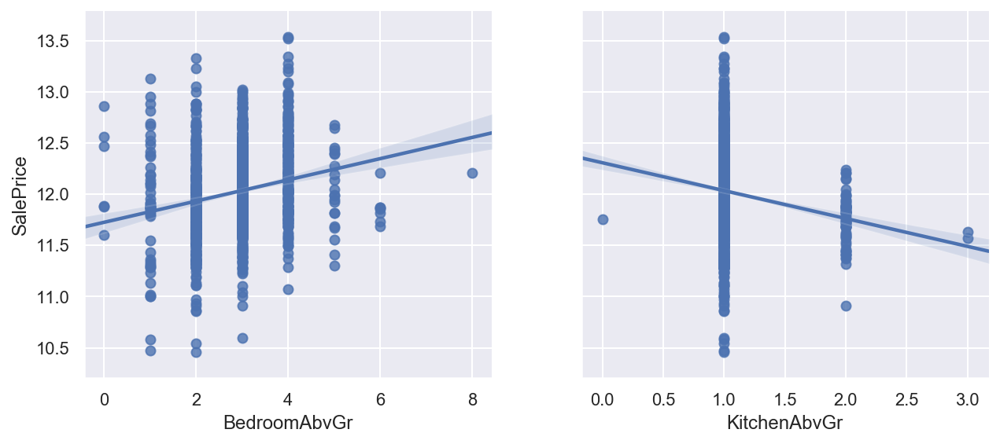

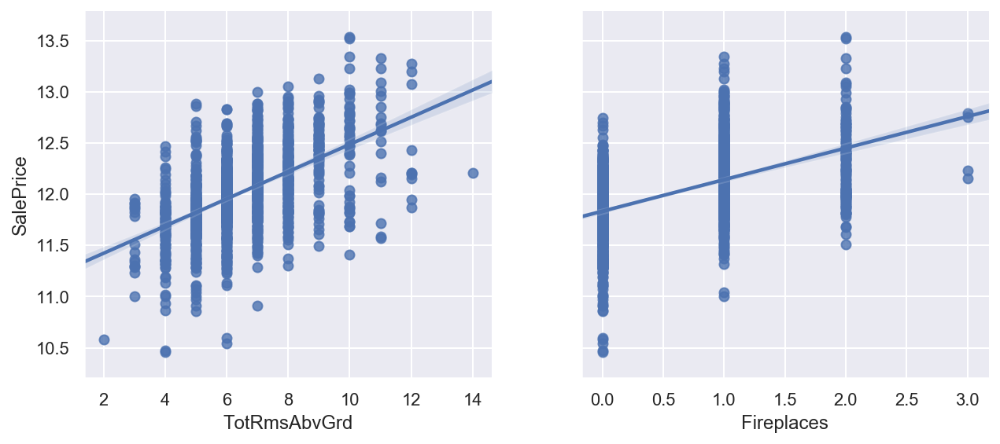

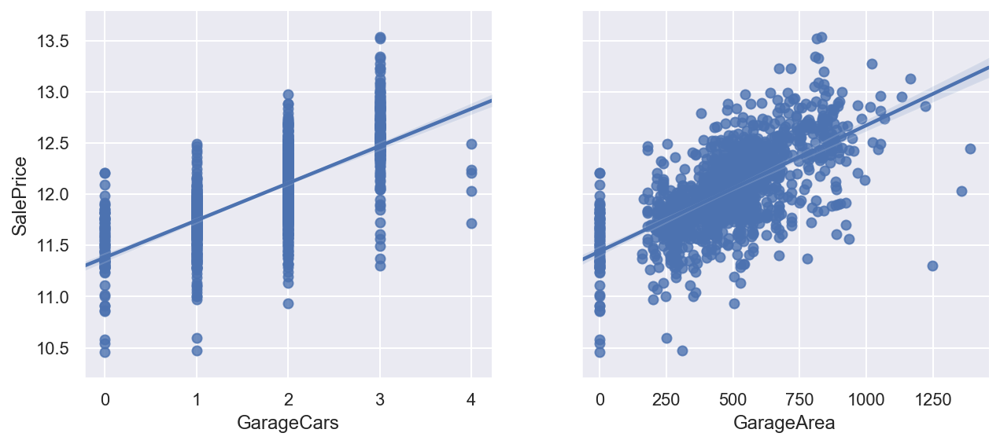

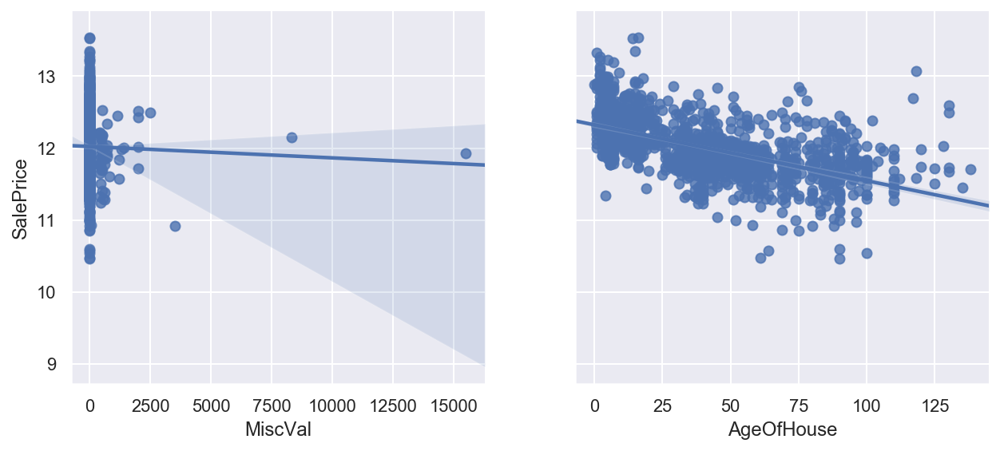

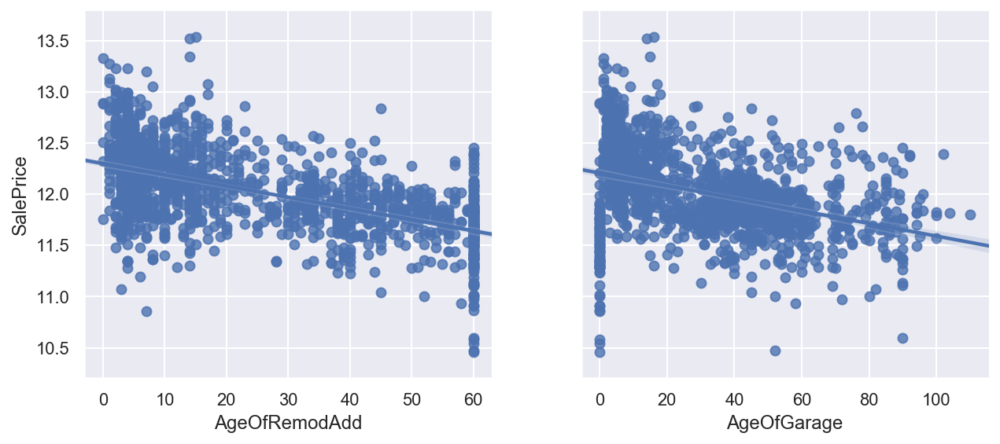

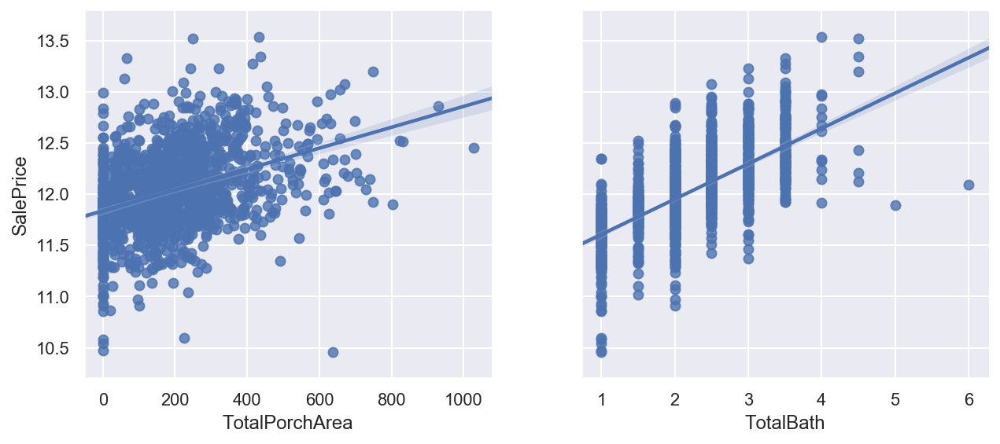

In [806]:
numeric_col_list = numerical_columns.copy()
numeric_col_list.remove('SalePrice')
pairplot_features(houseprice_df,numeric_col_list,'SalePrice')

## Observations from above plot
- Some columns seem to be nominal while some seem to be ordinal and we need to handle accordingly
    - MSSubClass - nominal - we need to create dummies
    - OverallQual - ordinal - we need to use LabelEncoder to encode category values
    - OverallCond - ordinal - we need to use LabelEncoder to encode category values
    - BedroomAbvGr - ordinal - we need to use LabelEncoder to encode category values
    - KitchenAbvGr - ordinal - we need to use LabelEncoder to encode category values
    - TotRmsAbvGrd - ordinal - we need to use LabelEncoder to encode category values
    - Fireplaces - ordinal - we need to use LabelEncoder to encode category values
    - GarageCars - ordinal - we need to use LabelEncoder to encode category values
    - MoSold - nominal - we need to create dummies (since its the month of year)
    - TotalBath - ordinal - we need to use LabelEncoder to encode category values
- There seems to be a positive correlation between SalePrice and
    - LotFrontage
    - MasVnrArea
    - TotalBsmtSF
    - GrLivArea
    - GarageArea
    - TotalPorchArea
- There seems to be negative correlation between SalePrice and 
    - AgeOfHouse
    - AgeOfRemodAdd
    - AgeOfGarage

## Lets check for skewness in data for numerical columns

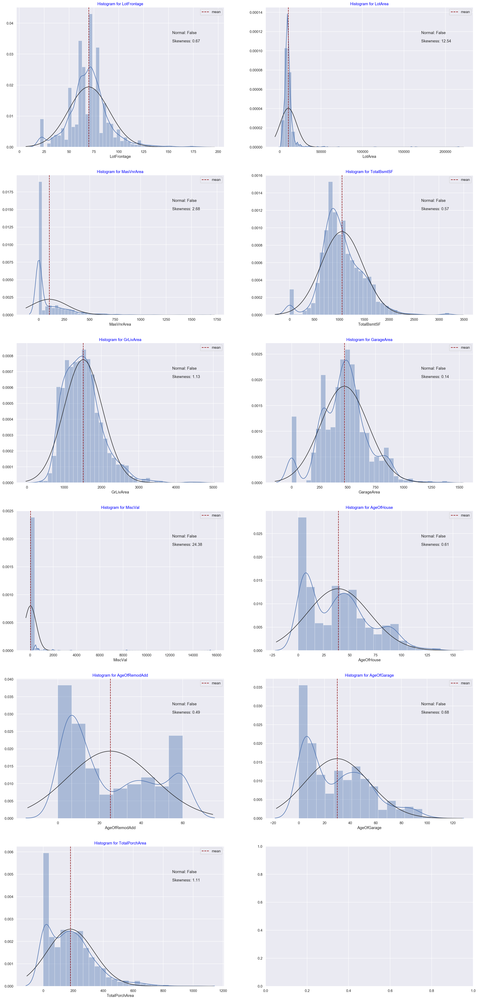

In [807]:
col_list = ['LotFrontage', 'LotArea', 'MasVnrArea', 'TotalBsmtSF', 'GrLivArea', 'GarageArea', 
            'MiscVal', 'AgeOfHouse', 'AgeOfRemodAdd', 'AgeOfGarage', 'TotalPorchArea']
subplot_histograms(houseprice_df, col_list, cols = 2)

## Observations from above plot
- Following columns sample distribution seem to be highly skewed (skewness >0.75)
    - LotArea, MasVnrArea, GrLivArea, PoolArea, MiscVal, TotalPorchArea
- We will scale these features further during model building

In [808]:
# #logtransformation_list = ['LotArea', 'MasVnrArea', 'GrLivArea', 'MiscVal', 'TotalPorchArea']
# logtransformation_list = ['LotFrontage', 'LotArea', 'MasVnrArea', 'TotalBsmtSF', 'GrLivArea', 'GarageArea', 
#             'MiscVal', 'AgeOfHouse', 'AgeOfRemodAdd', 'AgeOfGarage', 'TotalPorchArea']
# for column_name in logtransformation_list:
#     houseprice_df[column_name] = np.log1p(houseprice_df[column_name])
# houseprice_df[logtransformation_list].head()

## 8.2 Bivariate Analysis<a id='Bivariate analysis'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

## Lets Plot the average Sales Price groupby Neighborhood

Text(0.5, 0, 'Average Sales Price')

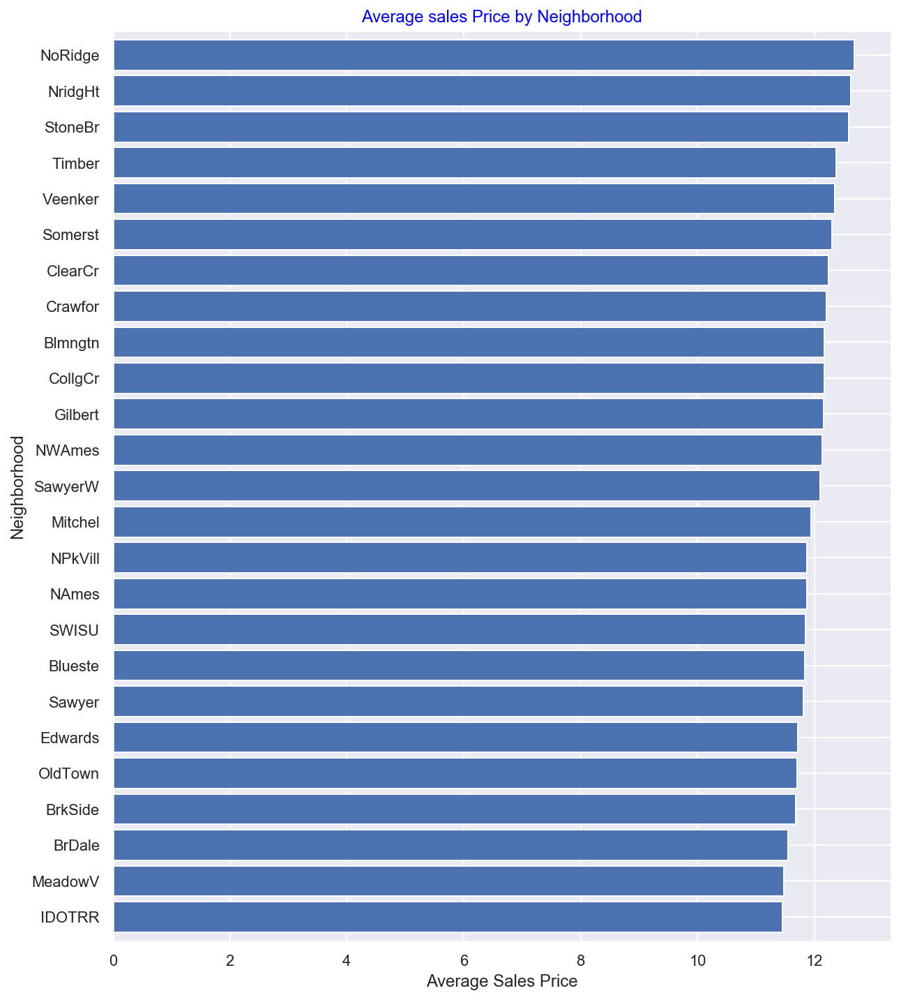

In [809]:
x=houseprice_df.groupby('Neighborhood')['SalePrice'].mean().sort_values()
ax=x.plot(kind='barh',figsize=(10,12),width=0.85)
ax.set_title('Average sales Price by Neighborhood',color='blue')
ax.set_ylabel('Neighborhood')
ax.set_xlabel('Average Sales Price')

## Observations from above plot
- Northridge has the highest average SalePrice followed by Northridge Heights, Stone Brook
- Iowa DOT and Rail Road has the lowest average Sale Price

## Lets Plot average Sales Price based on Housing Style

Text(0.5, 0, 'Average Sales Price')

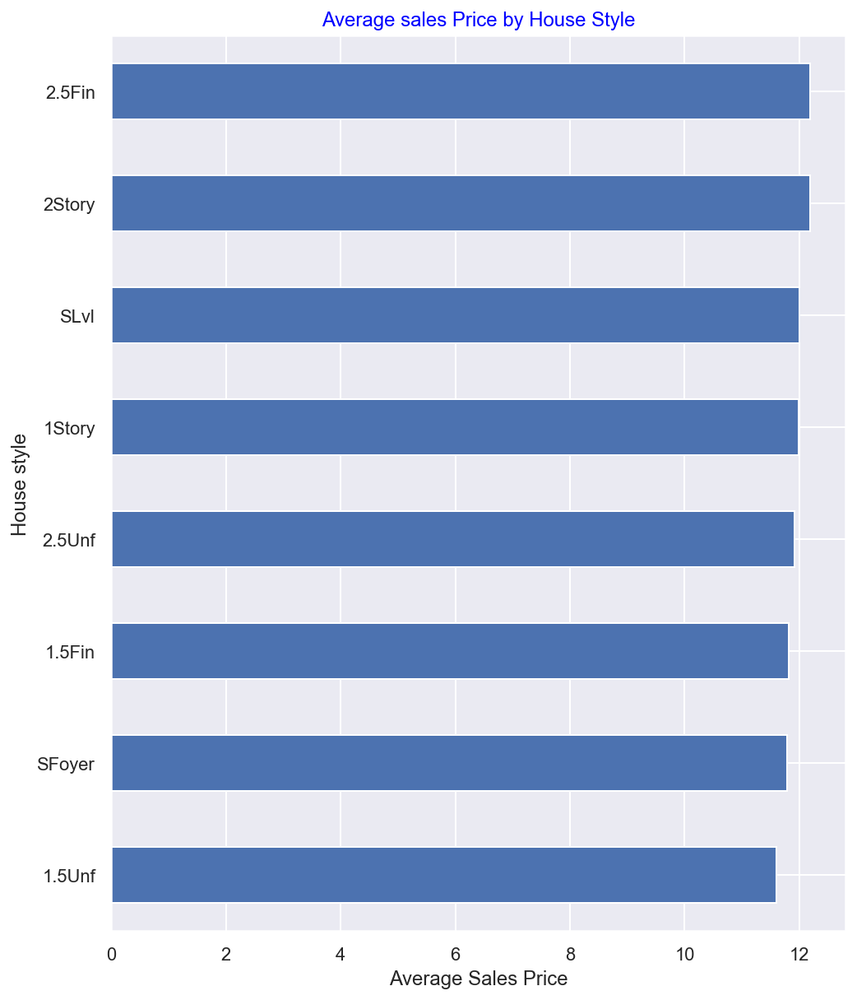

In [810]:
x=houseprice_df.groupby('HouseStyle')['SalePrice'].mean().sort_values()
ax=x.plot(kind='barh',figsize=(8,10),width=0.5)
ax.set_title('Average sales Price by House Style',color='blue')
ax.set_ylabel('House style')
ax.set_xlabel('Average Sales Price')

### Observations from above plot
- 2.5Fin Housing Styles have higest average Sales Price followed by 2Storey, SLvl

## Lets Plot Average Sales Price wrt Home Functionality

Text(0.5, 0, 'Average Sales Price')

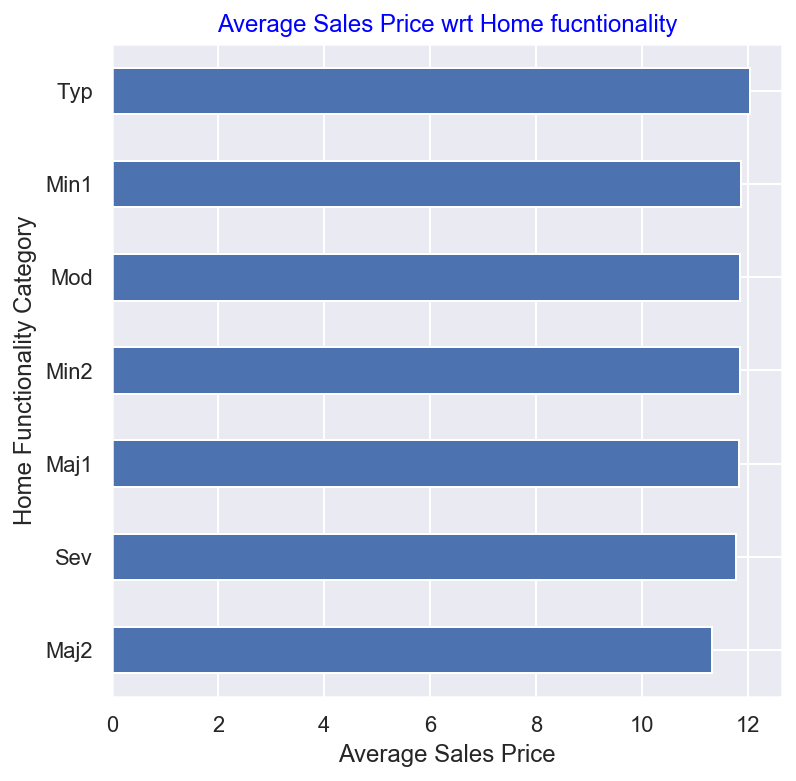

In [811]:
x = houseprice_df.groupby('Functional')['SalePrice'].mean().sort_values()
ax=x.plot(kind='barh',figsize=(6,6),width=0.5)
ax.set_title('Average Sales Price wrt Home fucntionality',color='blue')
ax.set_ylabel('Home Functionality Category')
ax.set_xlabel('Average Sales Price')

### Observations from above plot
- Houses with Typical Functionality have highest Average Sales Pricefollowed by Minor Deductions 1, Moderate Deductions

## 8.3 Lets plot heatmap to check the correlation amongst the features and traget variable<a id='Heatmap'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

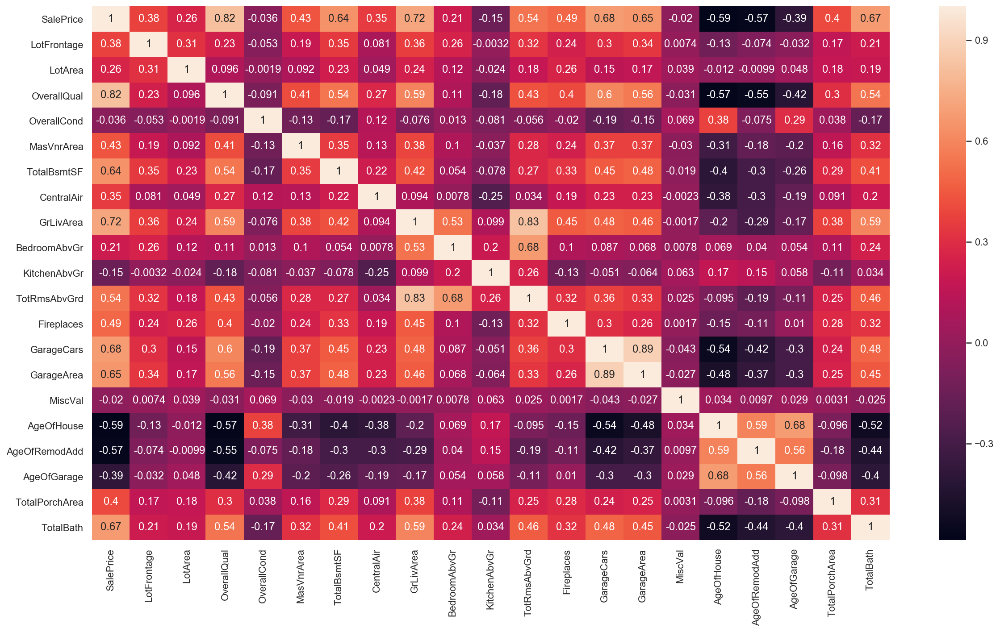

In [812]:
plt.figure(figsize=(20,11))
sns.heatmap(houseprice_df.corr(),annot=True);

In [813]:
house_corr = houseprice_df.corr()
house_corr.style.apply(lambda x: ["background: lightblue" if abs(v) > 0.5 else "" for v in x], axis = 1)


,SalePrice,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,TotalBsmtSF,CentralAir,GrLivArea,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,MiscVal,AgeOfHouse,AgeOfRemodAdd,AgeOfGarage,TotalPorchArea,TotalBath
SalePrice,1,0.378452,0.2599,0.81902,-0.0355518,0.433867,0.644399,0.351591,0.717242,0.211349,-0.149473,0.538221,0.493663,0.679872,0.654818,-0.0196698,-0.587058,-0.56529,-0.385731,0.399465,0.674652
LotFrontage,0.378452,1,0.312652,0.232536,-0.0531095,0.189563,0.346959,0.080846,0.355837,0.255413,-0.00315047,0.324495,0.239026,0.30146,0.335115,0.00735411,-0.125313,-0.0743935,-0.0318695,0.166873,0.209267
LotArea,0.2599,0.312652,1,0.0964314,-0.00191321,0.0922059,0.230611,0.048869,0.238731,0.116893,-0.0239456,0.176528,0.25937,0.154934,0.167255,0.0390769,-0.0117714,-0.00987865,0.0480462,0.181327,0.193799
OverallQual,0.81902,0.232536,0.0964314,1,-0.0908276,0.407787,0.542039,0.272342,0.59331,0.105442,-0.184837,0.426804,0.395656,0.601092,0.557193,-0.0310624,-0.571896,-0.549875,-0.419239,0.303642,0.538241
OverallCond,-0.0355518,-0.0531095,-0.00191321,-0.0908276,1,-0.127198,-0.171075,0.120257,-0.0764677,0.013187,-0.0812841,-0.0563021,-0.019779,-0.185075,-0.150871,0.0687081,0.376253,-0.0751124,0.294998,0.0380293,-0.170032
MasVnrArea,0.433867,0.189563,0.0922059,0.407787,-0.127198,1,0.351207,0.12757,0.380788,0.10362,-0.0374207,0.275269,0.241674,0.36559,0.365754,-0.0298104,-0.314778,-0.178663,-0.203007,0.158269,0.315103
TotalBsmtSF,0.644399,0.346959,0.230611,0.542039,-0.171075,0.351207,1,0.216735,0.421,0.0542137,-0.0783735,0.274886,0.326777,0.453596,0.476967,-0.0185925,-0.403659,-0.299264,-0.256529,0.285796,0.411461
CentralAir,0.351591,0.080846,0.048869,0.272342,0.120257,0.12757,0.216735,1,0.0936984,0.007805,-0.248907,0.0337147,0.187282,0.233216,0.231286,-0.00230297,-0.381795,-0.298291,-0.189388,0.090789,0.201016
GrLivArea,0.717242,0.355837,0.238731,0.59331,-0.0764677,0.380788,0.421,0.0936984,1,0.531506,0.0989837,0.828151,0.450885,0.475741,0.458432,-0.00170242,-0.197703,-0.28823,-0.167596,0.37913,0.592207
BedroomAbvGr,0.211349,0.255413,0.116893,0.105442,0.013187,0.10362,0.0542137,0.007805,0.531506,1,0.196553,0.677409,0.102466,0.0874703,0.0677706,0.00783814,0.0686518,0.0397868,0.0535715,0.105441,0.235181


## Observations from above plot
- There seems to be strong positive correlation between SalePrice and OverallQual, GrLivArea, GarageCars, TotalBath, GarageArea, TotalBsmtSF. This means better the quality of house, or more square feet area of house, more is the Sale Price of the house
- There seems to be negative correlation between Target variable and AgeOfHouse, AgeOfRemodAdd. This means, as the house gets older, the SalePrice decreases

# 9. Data preparation<a id='Data preparation'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

## 9.1 Convert the ordinal variables using LabelEncoder<a id='Label Encoder'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

### Common function to plot relationship between Traget variable and category values

In [814]:
def plot_feature(feature):
    plt.figure(figsize=(10,5))
    plt.title('Sale Price wrt all category values in feature: {0}'.format(feature))
    plt.xlabel(feature)
    plt.ylabel('SalePrice')
    color_list = ['DarkBlue','Green','Red','Brown','Yellow','Blue','Purple','LightGreen','Pink','Orange','Cyan']
    val_list = list(houseprice_df[feature].value_counts().index)
    for i, val in enumerate(val_list):
        houseprice_df[houseprice_df[feature]==val]['SalePrice'].plot(color=color_list[i],label = val)
        plt.legend(loc='best')

In [815]:
nominal_features = ['OverallQual','OverallCond','ExterQual','ExterCond','BsmtQual',
                    'BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','HeatingQC','KitchenQual',
                   'FireplaceQu','GarageQual','GarageCond']

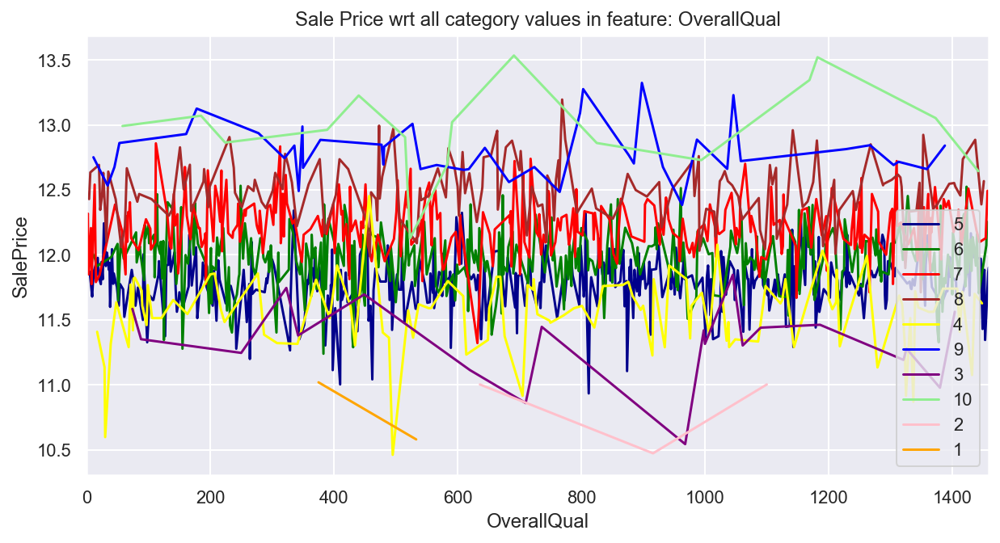

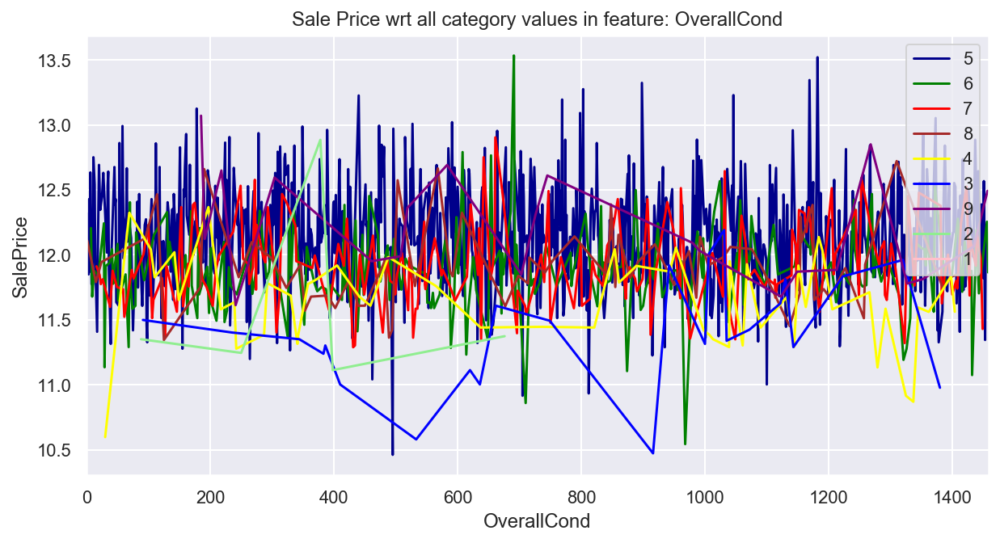

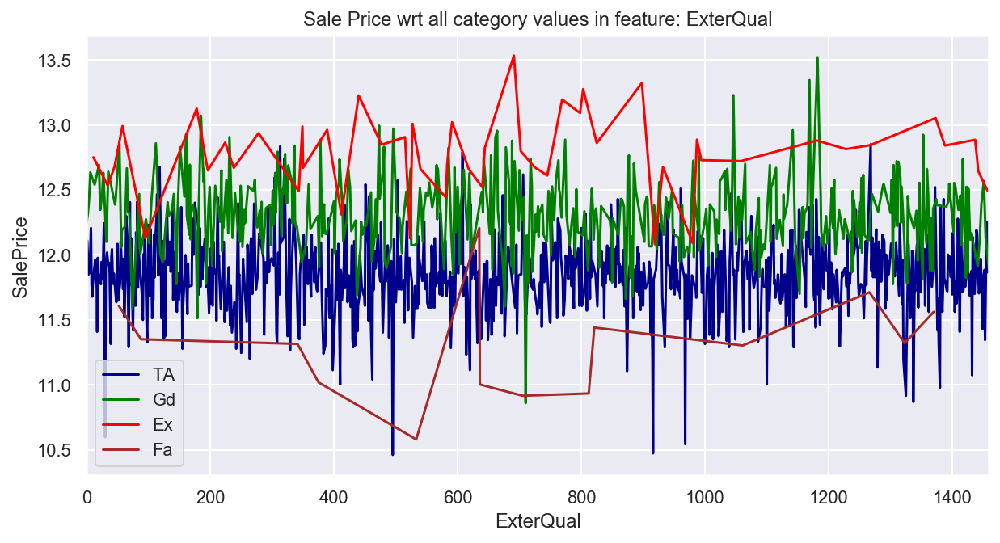

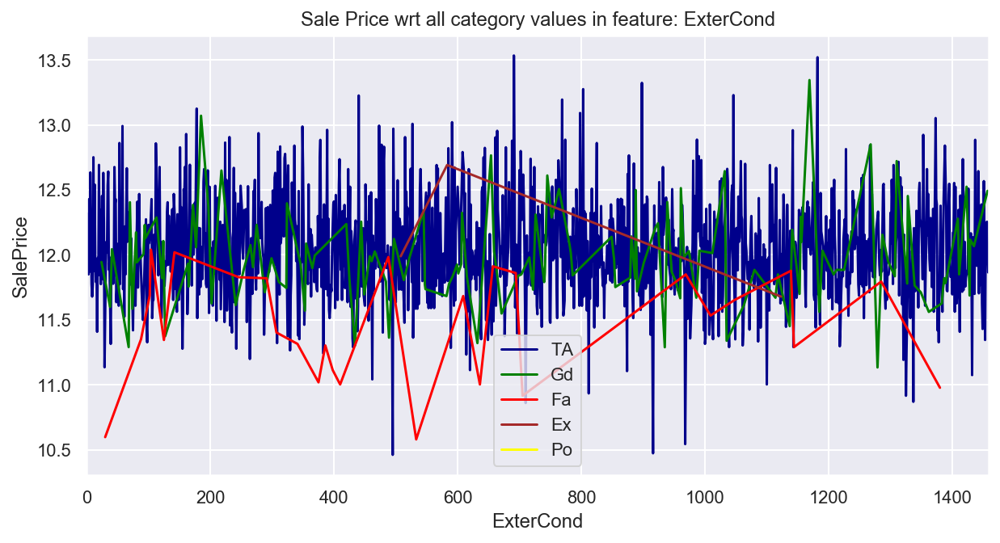

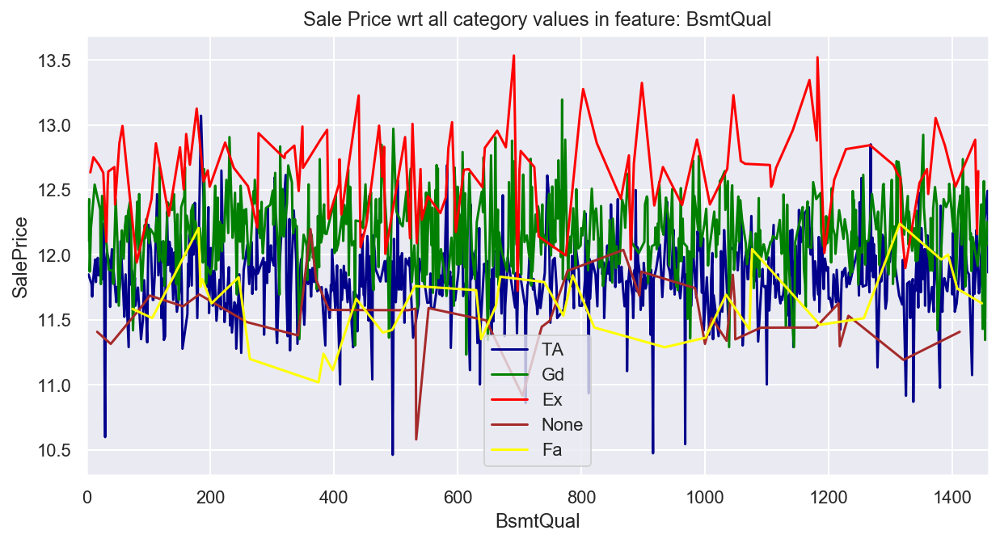

...

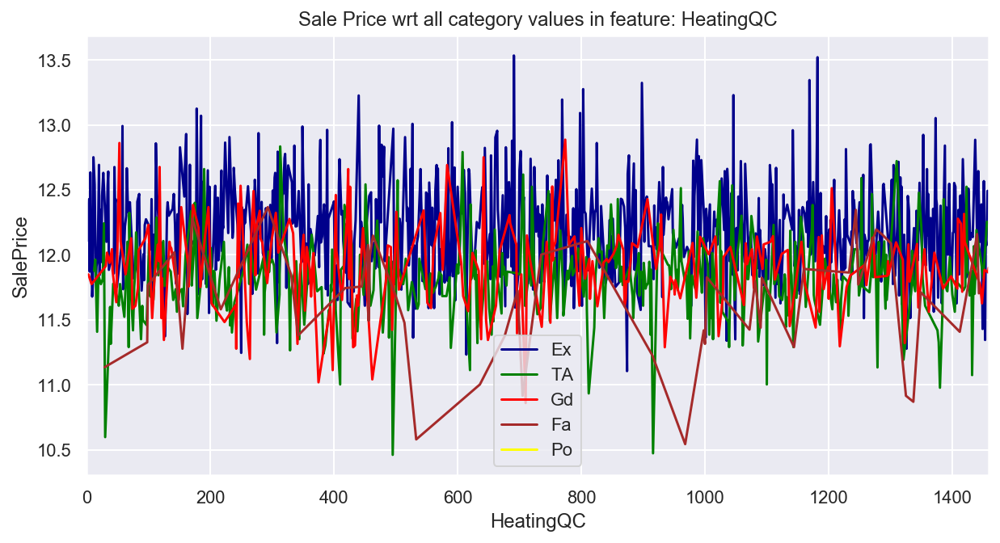

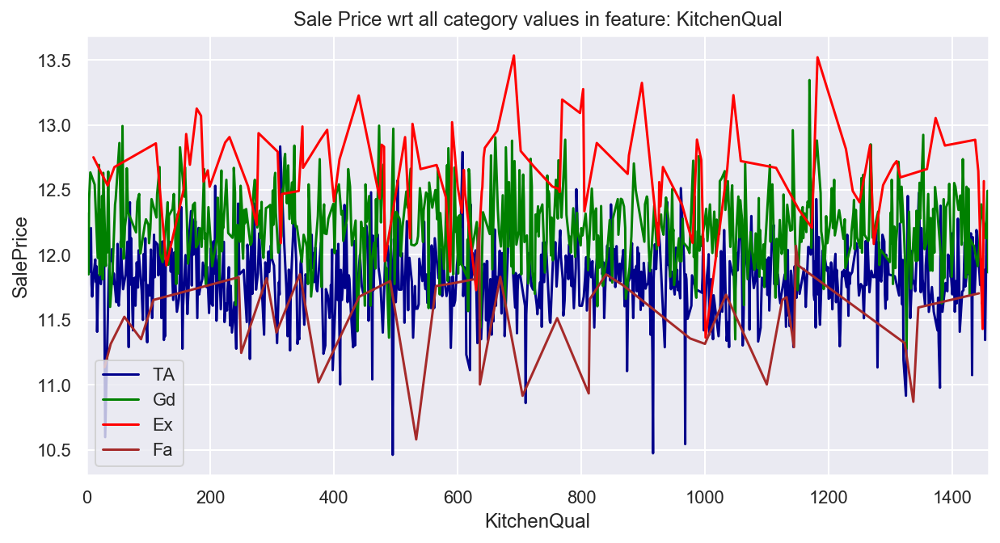

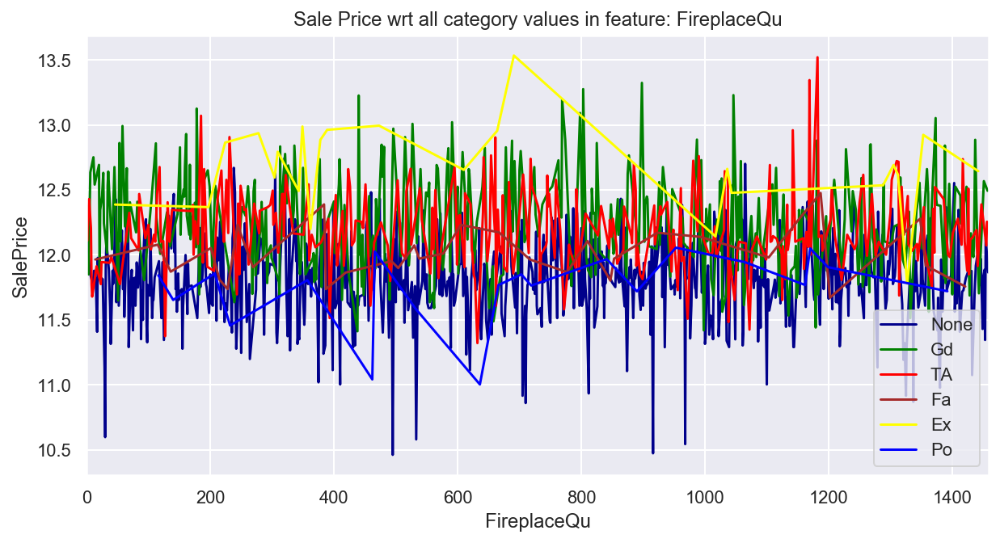

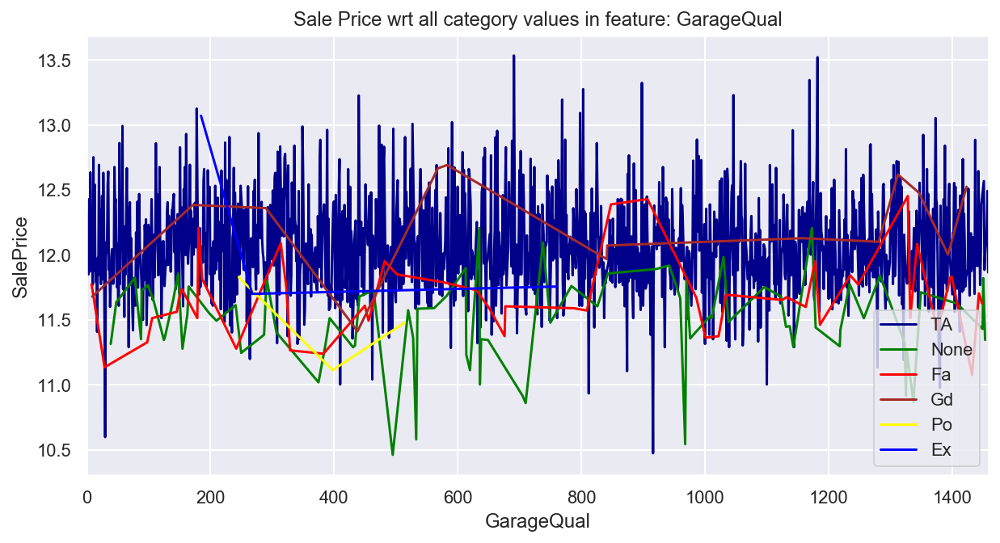

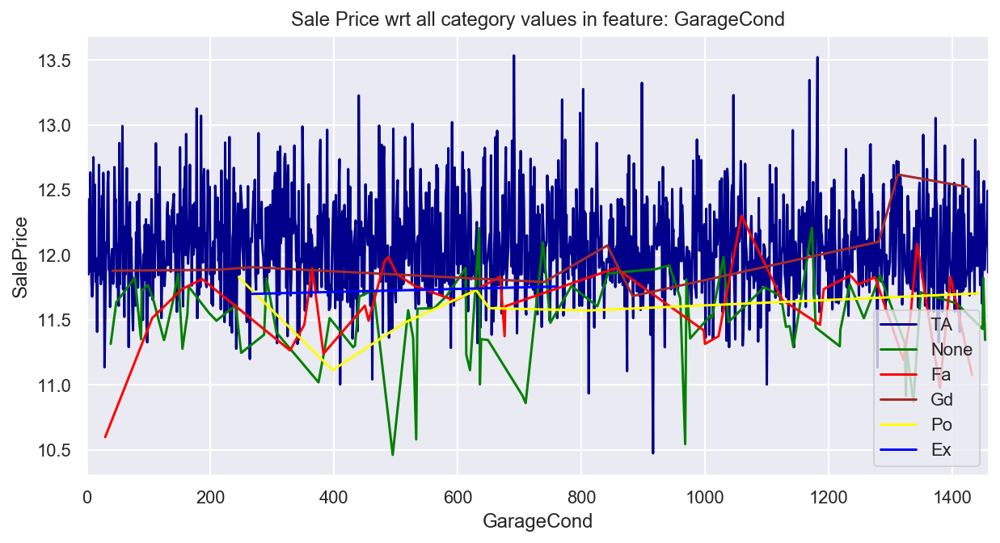

In [816]:
for feature in nominal_features:
    plot_feature(feature)

## Observations from above plot
- We can see that category values have direct relationship with SalePrice
- As the value of category increases , for example from good to excellent, so does the increase in Sale Price
- With thos relationship we will create such features in numbers using LabelEncoder. We can do so by using map function as well but for now we will go ahead with LabelEncoder

In [817]:
label_encoder = LabelEncoder()
houseprice_df[nominal_features] = houseprice_df[nominal_features].apply(
    lambda col: label_encoder.fit_transform(col))
houseprice_df[nominal_features].head()

,OverallQual,OverallCond,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,HeatingQC,KitchenQual,FireplaceQu,GarageQual,GarageCond
0,6,4,2,4,2,4,3,2,6,0,2,3,5,5
1,5,7,3,4,2,4,1,0,6,0,3,5,5,5
2,6,4,2,4,2,4,2,2,6,0,2,5,5,5
3,6,4,3,4,4,1,3,0,6,2,2,2,5,5
4,7,4,2,4,2,4,0,2,6,0,2,5,5,5


## 9.2 Convert the variables using get_dummies<a id='Get dummies'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

In [818]:
categorical_features=['MSSubClass','MSZoning', 'Alley', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 
                      'Neighborhood', 'Condition1', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 
                      'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Foundation','Heating', 
                      'Electrical', 'Functional','GarageType', 'GarageFinish', 'PavedDrive', 
                      'Fence', 'MiscFeature', 'SaleType', 'SaleCondition', 'MoSold']
houseprice_df = pd.get_dummies(data=houseprice_df,columns=categorical_features,drop_first=True)
houseprice_df.sample(10)

,SalePrice,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,TotalBsmtSF,HeatingQC,CentralAir,GrLivArea,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageCars,GarageArea,GarageQual,GarageCond,MiscVal,AgeOfHouse,AgeOfRemodAdd,AgeOfGarage,TotalPorchArea,TotalBath,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSSubClass_20,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Alley_None,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_Other,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_None,MiscFeature_Othr,MiscFeature_Shed,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,MoSold_10,MoSold_11,MoSold_12,MoSold_2,MoSold_3,MoSold_4,MoSold_5,MoSold_6,MoSold_7,MoSold_8,MoSold_9
1290,12.103492,73.0,14112,4,6,86.0,3,4,4,4,0,2,6,1152,4,1,1152,3,1,3,6,1,2,2,484,5,5,0,46,46,46,227,2.0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
1079,11.744045,65.0,8775,4,4,0.0,3,4,2,4,3,2,6,990,2,1,990,3,1,3,5,0,3,1,299,5,5,0,16,16,14,64,1.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,

# 10. Model Preparation<a id='Model Preparation'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

## 10.1 Divide into X and Y for model building<a id='Create X and y'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

In [819]:
X = houseprice_df.drop(columns = ['SalePrice'])
y = houseprice_df['SalePrice']

## 10.2 Train-Test Split<a id='Train Test Split'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

In [820]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

In [821]:
print('shape of train set: {0}'.format(X_train.shape))
print('shape of test set: {0}'.format(X_test.shape))

shape of train set: (1014, 209)
shape of test set: (435, 209)


In [822]:
X_train.head()

,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,TotalBsmtSF,HeatingQC,CentralAir,GrLivArea,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageCars,GarageArea,GarageQual,GarageCond,MiscVal,AgeOfHouse,AgeOfRemodAdd,AgeOfGarage,TotalPorchArea,TotalBath,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSSubClass_20,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Alley_None,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_Other,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_None,MiscFeature_Othr,MiscFeature_Shed,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,MoSold_10,MoSold_11,MoSold_12,MoSold_2,MoSold_3,MoSold_4,MoSold_5,MoSold_6,MoSold_7,MoSold_8,MoSold_9
813,75.0,9750,5,5,243.0,3,4,4,4,3,5,6,1442,2,1,1442,4,1,3,7,0,3,1,301,5,5,500,52,52,52,275,1.5,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
862,81.0,9672,5,4,0.0,3,4,2,4,3,2,6,1040,4,1,1097,3,1,3,6,0,3,2,480,5,5,0,26,25,24,0,2.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1

## 10.3 Scale features<a id='Scaling'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

In [823]:
#scaled_columns = ['LotFrontage', 'TotalBsmtSF', 'GarageArea', 'AgeOfHouse', 'AgeOfRemodAdd', 'AgeOfGarage']
scaled_columns = ['LotFrontage', 'LotArea', 'MasVnrArea', 'TotalBsmtSF', 'GrLivArea', 'GarageArea', 
                  'MiscVal', 'AgeOfHouse', 'AgeOfRemodAdd', 'AgeOfGarage', 'TotalPorchArea',
                  'OverallQual','OverallCond','ExterQual','ExterCond','BsmtQual',
                  'BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','HeatingQC','KitchenQual',
                  'FireplaceQu','GarageQual','GarageCond','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd',
                 'Fireplaces','GarageCars','TotalBath']
sc = StandardScaler()
X_train[scaled_columns] = sc.fit_transform(X_train[scaled_columns])
X_test[scaled_columns] = sc.transform(X_test[scaled_columns])

In [824]:
X_train.head()

,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,TotalBsmtSF,HeatingQC,CentralAir,GrLivArea,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageCars,GarageArea,GarageQual,GarageCond,MiscVal,AgeOfHouse,AgeOfRemodAdd,AgeOfGarage,TotalPorchArea,TotalBath,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSSubClass_20,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Alley_None,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_Other,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_None,MiscFeature_Othr,MiscFeature_Shed,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,MoSold_10,MoSold_11,MoSold_12,MoSold_2,MoSold_3,MoSold_4,MoSold_5,MoSold_6,MoSold_7,MoSold_8,MoSold_9
813,0.265302,-0.065365,-0.077332,0.384589,0.811377,0.669783,0.358979,1.013478,0.311912,0.60811,0.798766,0.329524,0.934476,0.292423,1,-0.134539,1.378018,-0.215703,0.807171,0.314733,-0.940800,-0.067065,-1.051590,-0.812473,0.322251,0.292098,1.463660,0.432452,1.296751,0.832359,0.606121,-0.887134,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
862,0.558294,-0.072663,-0.077332,-0.516042,-0.569501,0.669783,0.358979

In [825]:
X_test.head()

,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,TotalBsmtSF,HeatingQC,CentralAir,GrLivArea,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageCars,GarageArea,GarageQual,GarageCond,MiscVal,AgeOfHouse,AgeOfRemodAdd,AgeOfGarage,TotalPorchArea,TotalBath,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSSubClass_20,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Alley_None,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_Other,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_None,MiscFeature_Othr,MiscFeature_Shed,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,MoSold_10,MoSold_11,MoSold_12,MoSold_2,MoSold_3,MoSold_4,MoSold_5,MoSold_6,MoSold_7,MoSold_8,MoSold_9
539,0.021141,0.091168,1.402188,-0.516042,2.152478,-0.813098,0.358979,-0.556677,0.311912,-1.957591,-0.531928,0.329524,1.273513,-0.868113,1,0.179798,0.165075,-0.215703,-0.405379,-0.301366,0.625655,1.676632,0.294764,0.937740,0.322251,0.292098,6.195722,-0.977852,-0.831789,-0.840493,-0.000239,1.030892,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0
278,1.827928,0.374387,2.141948,-0.516042,1.220527,-3.778860,0.358

# 11. Data Modelling<a id='Data Modelling'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

## Common functions

### 11.1 Setup cross validation folds<a id='Cross Validation'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

In [826]:
kfold = KFold(n_splits=10, random_state=42, shuffle = True)

### 11.2 Define metrics<a id='Define metrics'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

In [827]:
def rmse_model(y, y_pred):
    return np.sqrt(mean_squared_error(y,y_pred))

def cv_rmse_model(model,X_df,y_df):
    rmse_val = np.sqrt(-cross_val_score(model,X_df,y_df, scoring="neg_mean_squared_error", cv=kfold))
    return (rmse_val.mean())

### 11.3 Create DataFrame to save results<a id='DataFrame Save Results'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

In [828]:
result_df = pd.DataFrame(columns=['model','alpha','r2_score_train','r2_score_test','rmse_train','rmse_test'])

# 11.4 Model 1 - Linear Regression without Regularization<a id='LinearRegression'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

In [829]:
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train) 

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [830]:
y_train_pred = lin_reg.predict(X_train)
r2_train_score_of_model = r2_score(y_train, y_train_pred)
print('r2 score of train data using Linear Regression model is: {0}'.format(r2_train_score_of_model))

r2 score of train data using Linear Regression model is: 0.9386502279511008


In [831]:
y_pred = lin_reg.predict(X_test)

In [832]:
r2_score_of_model = r2_score(y_test, y_pred)
print('r2 score of test data using Linear Regression model is: {0}'.format(r2_score_of_model))

r2 score of test data using Linear Regression model is: -1.4683037046689424e+22


In [833]:
rmse_train_of_model = cv_rmse_model(lin_reg,X_train, y_train)
print('rmse of train data using Linear Regression model is: {0}'.format(rmse_train_of_model))
rmse_of_model = cv_rmse_model(lin_reg,X_test, y_test)
print('rmse of test data using Linear Regression model is: {0}'.format(rmse_of_model))

rmse of train data using Linear Regression model is: 30858840129.101624
rmse of test data using Linear Regression model is: 99497655185.871


In [834]:
result_df.loc[0,'model'] = 'LinearRegression'
result_df.loc[0,'alpha'] = np.NaN
result_df.loc[0,'r2_score_train'] = r2_train_score_of_model
result_df.loc[0,'r2_score_test'] = r2_score_of_model
result_df.loc[0,'rmse_train'] = rmse_train_of_model
result_df.loc[0,'rmse_test'] = rmse_of_model

## Observations from above plot
- r2 score of train and test are way too different also RMSE of the model is too high
- We need to regularise the model

# Regularization

# 11.5 Model 2 - Lasso<a id='Lasso'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

In [835]:
# lasso_alphas = np.linspace(.001, 100, 500)
# lasso_model = LassoCV(alphas=lasso_alphas, cv=kfold)
# lasso_cv_mean_mse = -cross_val_score(lasso_model, X_train, y_train, cv=10, 
#                                      scoring='neg_mean_squared_error').mean()
# lasso_cv_mean_r2 = cross_val_score(lasso_model, X_train, y_train, cv=10, scoring='r2').mean()
# lasso_cv_mean_mse, lasso_cv_mean_r2

In [836]:
params = {'alpha': np.linspace(.001, 0.005, 1000)}

lasso_reg = Lasso()

# cross validation
model_cv = GridSearchCV(estimator = lasso_reg, 
                        param_grid = params, 
                        scoring= 'neg_mean_squared_error', 
                        cv = kfold, 
                        return_train_score=True,
                        verbose = 1)            

model_cv.fit(X_train, y_train) 

Fitting 10 folds for each of 1000 candidates, totalling 10000 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 10000 out of 10000 | elapsed:  1.3min finished


GridSearchCV(cv=KFold(n_splits=10, random_state=42, shuffle=True),
             error_score=nan,
             estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='deprecated', n_jobs=None,
             param_grid={'alpha': array([0.001     , 0.001004  , 0.00100801, 0.0...
       0.0049039 , 0.00490791, 0.00491191, 0.00491592, 0.00491992,
       0.00492392, 0.00492793, 0.00493193, 0.00493594, 0.00493994,
       0.00494394, 0.00494795, 0.00495195, 0.00495596, 0.00495996,
       0.00496396, 0.00496797, 0.00497197, 0.00497598, 0.00497998,
       0.00498398, 0.00498799, 0.00499199, 0.004996  , 0.005     ])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='neg_mean_squared_error', verbose=1)

In [837]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
0,0.007024,0.001043,0.000982,0.000190,0.001,{'alpha': 0.001},-0.008429,-0.013811,-0.012948,-0.016311,-0.040472,-0.014581,-0.018586,-0.014108,-0.014735,-0.012516,-0.016650,0.008320,1,-0.013601,-0.013198,-0.013230,-0.013071,-0.010901,-0.013057,-0.012865,-0.013254,-0.013049,-0.013264,-0.012949,0.000707
1,0.006899,0.000686,0.001013,0.000210,0.001004,{'alpha': 0.0010040040040040041},-0.008430,-0.013815,-0.012948,-0.016323,-0.040472,-0.014582,-0.018593,-0.014117,-0.014736,-0.012513,-0.016653,0.008320,2,-0.013611,-0.013206,-0.013238,-0.013080,-0.010908,-0.013065,-0.012873,-0.013263,-0.013058,-0.013272,-0.012957,0.000707
2,0.007821,0.001475,0.001074,0.000229,0.00100801,{'alpha': 0.001008008008008008},-0.008430,-0.013817,-0.012949,-0.016335,-0.040471,-0.014583,-0.018600,-0.014127,-0.014737,-0.012511,-0.016656,0.008319,3,-0.013620,-0.013213,-0.013246,-0.013089,-0.010914,-0.013073,-0.012880,-0.013272,-0.013067,-0.013280,-0.012965,0.000708
3,0.007065,0.001538,0.001035,0.000230,0.00101201,{'alpha': 0.0010120120120120121},-0.008431,-0.013820,-0.012949,-0.016347,-0.040471,-0.014584,-0.018607,-0.014135,-0.014739,-0.012509,-0.016659,0.008319,4,-0.013630,-0.013221,-0.013254,-0.013098,-0.010921,-0.013081,-0.012888,-0.013280,-0.013076,-0.013288,-0.012974,0.000709
4,0.007970,0.000961,0.001057,0.000149,0.00101602,{'alpha': 0.001016016016016016},-0.008432,-0.013823,-0.012949,-0.016359,-0.040471,-0.014585,-0.018615,-0.014143,-0.014743,-0.012507,-0.016663,0.008318,5,-0.013639,-0.013228,-0.013263,-0.013106,-0.010927,-0.013088,-0.012895,-0.013288,-0.013085,-0.013295,-0.012982,0.000709


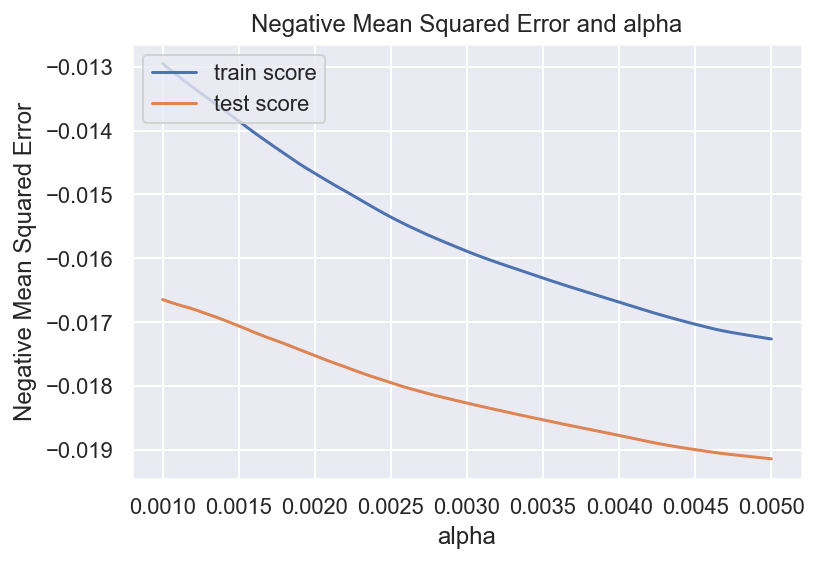

In [838]:
# plotting mean test and train scoes with alpha 
cv_results['param_alpha'] = cv_results['param_alpha'].astype('float32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Squared Error')

plt.title("Negative Mean Squared Error and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

In [839]:
model_cv.best_params_

{'alpha': 0.001}

In [840]:
#this best score is of neg_mean_squared_error
model_cv.best_score_

-0.01664981071408416

## Create Lasso Model with this best alpha

In [841]:
lasso_final = Lasso(alpha=model_cv.best_params_['alpha'])
        
lasso_final.fit(X_train, y_train) 

Lasso(alpha=0.001, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

In [842]:
y_train_pred = lasso_final.predict(X_train)
r2_train_score_of_model = r2_score(y_train, y_train_pred)
print('r2 score of train data using lasso model is: {0}'.format(r2_train_score_of_model))

r2 score of train data using lasso model is: 0.9138695856686178


In [843]:
rmse_train_of_model = rmse_model(y_train, y_train_pred)
print('rmse of train data using lasso model is: {0}'.format(rmse_train_of_model))

rmse of train data using lasso model is: 0.11483904163144452


In [844]:
y_pred = lasso_final.predict(X_test)

In [845]:
r2_score_of_model = r2_score(y_test, y_pred)
print('r2 score of test data using lasso model is: {0}'.format(r2_score_of_model))

r2 score of test data using lasso model is: 0.9145969387148621


In [846]:
rmse_of_model = rmse_model(y_test, y_pred)
print('rmse of test data using lasso model is: {0}'.format(rmse_of_model))

rmse of test data using lasso model is: 0.12216485123910106


### Save results

In [847]:
result_df.loc[1,'model'] = 'LassoRegression'
result_df.loc[1,'alpha'] = model_cv.best_params_['alpha']
result_df.loc[1,'r2_score_train'] = r2_train_score_of_model
result_df.loc[1,'r2_score_test'] = r2_score_of_model
result_df.loc[1,'rmse_train'] = rmse_train_of_model
result_df.loc[1,'rmse_test'] = rmse_of_model

## Residual analysis of test data

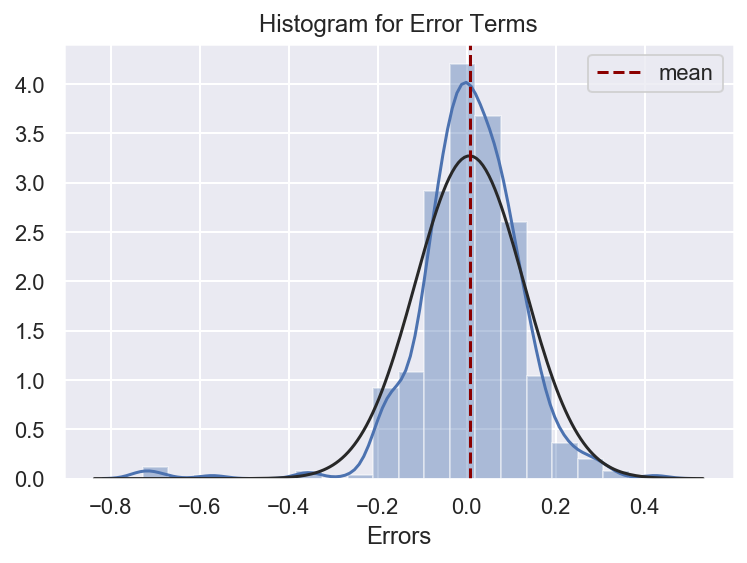

In [848]:
sns.distplot((y_test - y_pred), bins = 20,fit=norm, kde=True) 
mean_val = (y_test - y_pred).mean()#[0]
plt.title("Histogram for Error Terms")
plt.xlabel('Errors') 
plt.axvline(x = mean_val, label = "mean", color = "darkred").set_linestyle("--")
plt.legend();

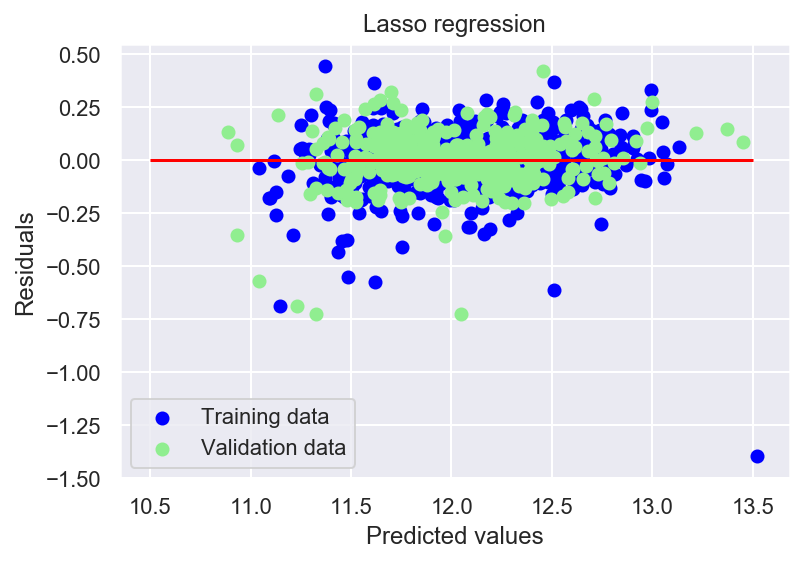

In [849]:
# Plot residuals
plt.scatter(y_train_pred, y_train - y_train_pred, c = "blue", label = "Training data")
plt.scatter(y_pred, y_test - y_pred , c = "lightgreen", label = "Validation data")
plt.title("Lasso regression")
plt.xlabel("Predicted values")
plt.ylabel("Residuals")
plt.legend(loc = "bottom left")
plt.hlines(y = 0, xmin = 10.5, xmax = 13.5, color = "red")
plt.show()

## Observations from above plot
- the error terms are homoscedastic thus depicting a good fit of model

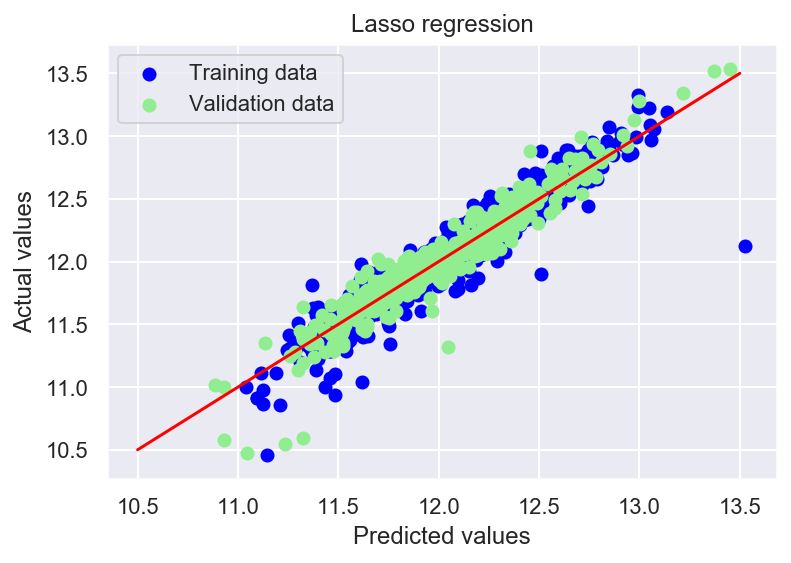

In [850]:
# Plot predictions
plt.scatter(y_train_pred, y_train, c = "blue", label = "Training data")
plt.scatter(y_pred, y_test, c = "lightgreen", label = "Validation data")
plt.title("Lasso regression")
plt.xlabel("Predicted values")
plt.ylabel("Actual values")
plt.legend(loc = "upper left")
plt.plot([10.5, 13.5], [10.5, 13.5], c = "red")
plt.show()

## Observations from above plot
- With few exceptions, the predicted and actual values are linearly following the straight line 

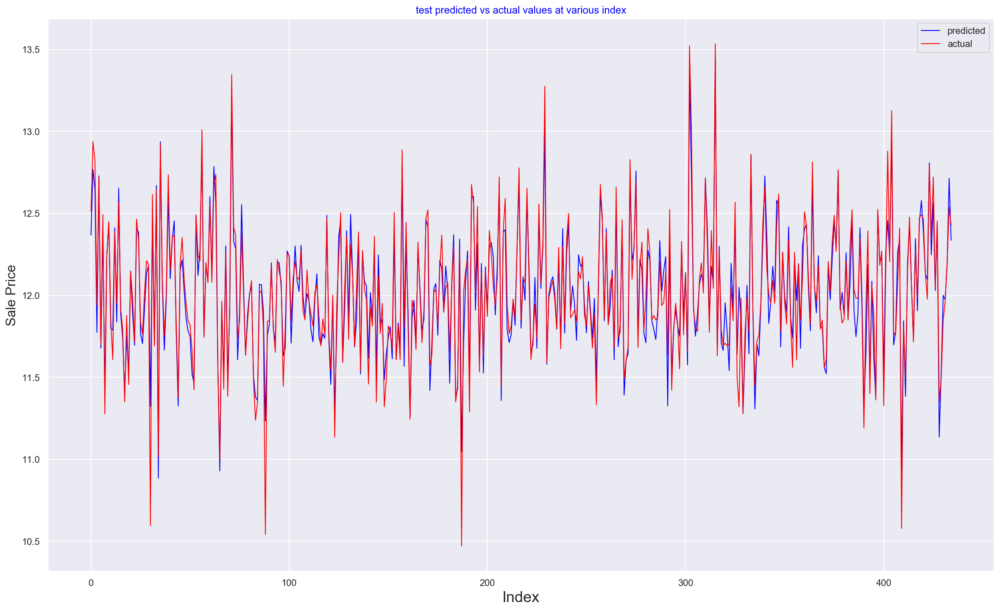

In [851]:
# Actual vs Predicted
items=len(list(y_test.index.sort_values()))
c = [i for i in range(0,items,1)]
d = [i for i in range(0,items,1)]
plt.figure(figsize=(20,12))
plt.plot(c, y_pred, color="blue", linewidth=1, linestyle="-", label='predicted')     #Plotting predicted
plt.plot(d, y_test, color="red",  linewidth=1, linestyle="-", label='actual')  #Plotting Actual
plt.title('test predicted vs actual values at various index',color='blue')
plt.xlabel('Index', fontsize=18)                               # X-label
plt.ylabel('Sale Price', fontsize=16)  
plt.legend()
plt.show()

## Observations from above plot
- House Sale Price of actual and predicted are almost in sync. Predicted prices are almost following the same pattern as of actual prices
- There are few obervations where predicted prices are lower than the actual prices while for some observations its more than the actual values but overall it shows the predictions are good

## Lets plot the predictors with coefficients

Number of features selected by Lasso are: 73 and number of features eliminated are: 136 


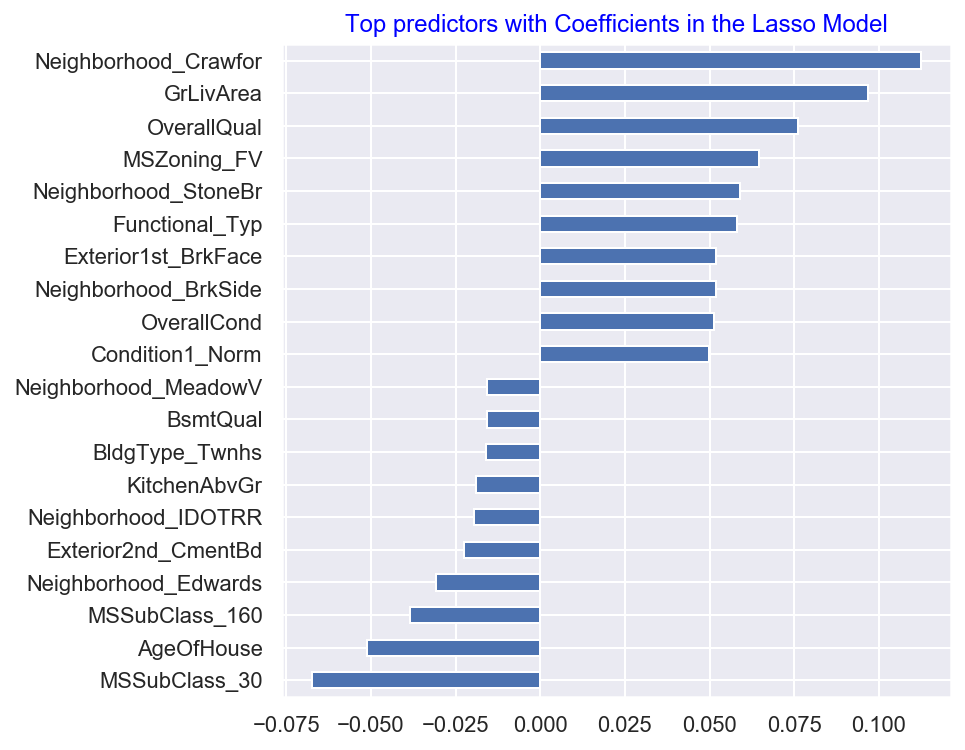

In [852]:
# Plot important coefficients
lasso_coefs = pd.Series(lasso_final.coef_, index = X_train.columns)
print("Number of features selected by Lasso are: {0} and number of features eliminated are: {1} ".format(
    sum(lasso_coefs != 0),sum(lasso_coefs == 0)))
lasso_imp_coefs = pd.concat([lasso_coefs.sort_values().head(10),
                     lasso_coefs.sort_values().tail(10)])
lasso_imp_coefs.plot(kind = "barh",figsize=(6,6))

plt.title("Top predictors with Coefficients in the Lasso Model",color='blue')
plt.show()

## Observations from above plot
- The top 5 predictors are:
    - Neighborhood_Crawfor (Positive)
    - GrLivArea (Positive)
    - OverallQual (Positive)
    - MSSubClass_30 (Negative)
    - MSZoning_FV (Positive)
- Neighborhood_Crawfor is the top positive predictor and MSSubClass_30 is the top negative predictor

In [853]:
print('Total number of features: {0}'.format(lasso_coefs.count()))
lasso_coefs.sort_values(ascending=False)

Total number of features: 209


Neighborhood_Crawfor     0.112356
GrLivArea                0.096901
OverallQual              0.076057
MSZoning_FV              0.064479
Neighborhood_StoneBr     0.059055
Functional_Typ           0.057967
Exterior1st_BrkFace      0.051838
Neighborhood_BrkSide     0.051782
OverallCond              0.051310
Condition1_Norm          0.049831
MSZoning_RL              0.046635
SaleType_New             0.045954
TotalBsmtSF              0.041885
LotConfig_CulDSac        0.038859
TotalBath                0.034108
CentralAir               0.032156
SaleCondition_Normal     0.028993
Neighborhood_NridgHt     0.027553
GarageCars               0.025149
PavedDrive_Y             0.022516
GarageArea               0.021660
TotRmsAbvGrd             0.021570
Foundation_PConc         0.021372
TotalPorchArea           0.020581
Fireplaces               0.017876
LotArea                  0.016074
Alley_Pave               0.013553
MSSubClass_20            0.011333
GarageType_Attchd        0.011069
Exterior1st_Vi

# 11.6 Model 3 - Ridge<a id='Ridge'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

In [854]:
# list of alphas to tune
params = {'alpha': np.linspace(.001, 30, 100)}

ridge_reg = Ridge()

# cross validation
model_cv = GridSearchCV(estimator = ridge_reg, 
                        param_grid = params, 
                        scoring= 'neg_mean_squared_error', 
                        cv = kfold, 
                        return_train_score=True,
                        verbose = 1)            

model_cv.fit(X_train, y_train) 

Fitting 10 folds for each of 100 candidates, totalling 1000 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:    5.4s finished


GridSearchCV(cv=KFold(n_splits=10, random_state=42, shuffle=True),
             error_score=nan,
             estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=None, normalize=False, random_state=None,
                             solver='auto', tol=0.001),
             iid='deprecated', n_jobs=None,
             param_grid={'alpha': array([1.00000000e-03, 3.04020202e-01, 6.07040404e-01, 9.10060606e-01,
       1.21308081e+00, 1.5161010...
       2.42426162e+01, 2.45456364e+01, 2.48486566e+01, 2.51516768e+01,
       2.54546970e+01, 2.57577172e+01, 2.60607374e+01, 2.63637576e+01,
       2.66667778e+01, 2.69697980e+01, 2.72728182e+01, 2.75758384e+01,
       2.78788586e+01, 2.81818788e+01, 2.84848990e+01, 2.87879192e+01,
       2.90909394e+01, 2.93939596e+01, 2.96969798e+01, 3.00000000e+01])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='neg_mean_squared_error', verbose=1)

In [855]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
0,0.004242,0.000637,0.001161,0.000157,0.001,{'alpha': 0.001},-0.012754,-0.016090,-0.011943,-0.014691,-0.040509,-0.013277,-0.023500,-0.013344,-0.020320,-0.017120,-0.018355,0.008152,100,-0.009130,-0.008967,-0.009204,-0.009064,-0.007203,-0.009184,-0.008809,-0.009180,-0.008798,-0.008972,-0.008851,0.000567
1,0.003614,0.000384,0.001002,0.000109,0.30402,{'alpha': 0.304020202020202},-0.011736,-0.014605,-0.011609,-0.014777,-0.040416,-0.013718,-0.020064,-0.012877,-0.020270,-0.016050,-0.017612,0.008129,99,-0.009351,-0.009183,-0.009411,-0.009272,-0.007392,-0.009367,-0.009029,-0.009414,-0.008990,-0.009180,-0.009059,0.000574
2,0.003932,0.000747,0.001121,0.000273,0.60704,{'alpha': 0.607040404040404},-0.011324,-0.014330,-0.011561,-0.015116,-0.040385,-0.013734,-0.019274,-0.013208,-0.020248,-0.015562,-0.017474,0.008124,98,-0.009601,-0.009421,-0.009651,-0.009483,-0.007605,-0.009578,-0.009267,-0.009644,-0.009207,-0.009421,-0.009288,0.000579
3,0.003751,0.000396,0.001011,0.000109,0.910061,{'alpha': 0.9100606060606061},-0.011046,-0.014205,-0.011558,-0.015329,-0.040295,-0.013707,-0.018900,-0.013462,-0.020102,-0.015213,-0.017382,0.008103,97,-0.009805,-0.009613,-0.009846,-0.009647,-0.007782,-0.009752,-0.009455,-0.009819,-0.009385,-0.009619,-0.009472,0.000582
4,0.003497,0.000252,0.000953,0.000114,1.21308,{'alpha': 1.213080808080808},-0.010828,-0.014122,-0.011567,-0.015461,-0.040184,-0.013683,-0.018668,-0.013635,-0.019910,-0.014934,-0.017299,0.008079,96,-0.009973,-0.009770,-0.010005,-0.009779,-0.007928,-0.009897,-0.009608,-0.009957,-0.009532,-0.009783,-0.009623,0.000584


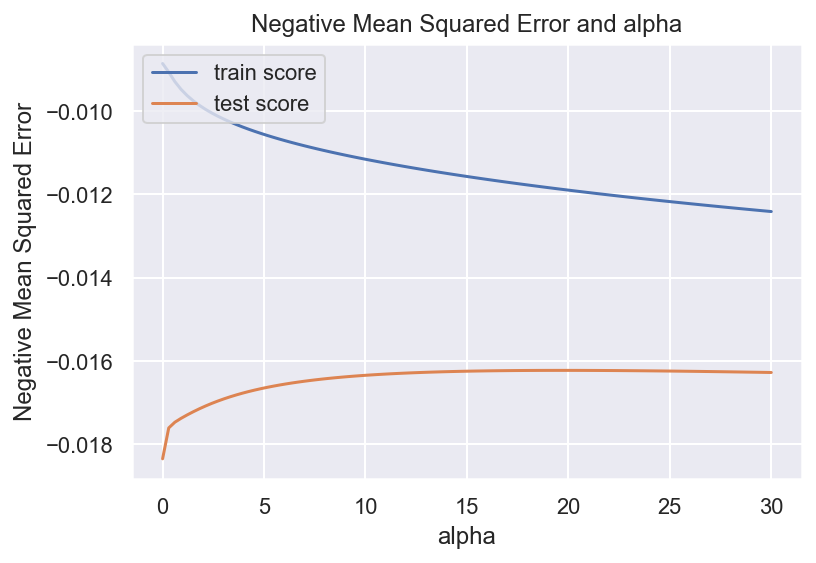

In [856]:
# plotting mean test and train scoes with alpha 
cv_results['param_alpha'] = cv_results['param_alpha'].astype('float32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Squared Error')

plt.title("Negative Mean Squared Error and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

In [857]:
model_cv.best_params_

{'alpha': 19.697313131313134}

In [858]:
model_cv.best_params_['alpha']

19.697313131313134

In [859]:
# this best score is of neg_mean_squared_error
model_cv.best_score_

-0.016228529871988577

## Create Ridge Model with this best alpha

In [860]:
ridge_final = Ridge(alpha=model_cv.best_params_['alpha'])
        
ridge_final.fit(X_train, y_train) 

Ridge(alpha=19.697313131313134, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

In [861]:
y_train_pred = ridge_final.predict(X_train)
r2_train_score_of_model = r2_score(y_train, y_train_pred)
print('r2 score of train data using ridge model is: {0}'.format(r2_train_score_of_model))

r2 score of train data using ridge model is: 0.9215929142905533


In [862]:
rmse_train_of_model = rmse_model(y_train, y_train_pred)
print('rmse of train data using ridge model is: {0}'.format(rmse_train_of_model))

rmse of train data using ridge model is: 0.10956931518939889


In [863]:
y_pred = ridge_final.predict(X_test)

In [864]:
r2_score_of_model = r2_score(y_test, y_pred)
print('r2 score of test data using ridge model is: {0}'.format(r2_score_of_model))

r2 score of test data using ridge model is: 0.9110799352654493


In [865]:
rmse_of_model = rmse_model(y_test, y_pred)
print('rmse of test data using ridge model is: {0}'.format(rmse_of_model))

rmse of test data using ridge model is: 0.12465492347143671


### Save results

In [866]:
result_df.loc[2,'model'] = 'RidgeRegression'
result_df.loc[2,'alpha'] = model_cv.best_params_['alpha']
result_df.loc[2,'r2_score_train'] = r2_train_score_of_model
result_df.loc[2,'r2_score_test'] = r2_score_of_model
result_df.loc[2,'rmse_train'] = rmse_train_of_model
result_df.loc[2,'rmse_test'] = rmse_of_model

## Residual analysis of test data

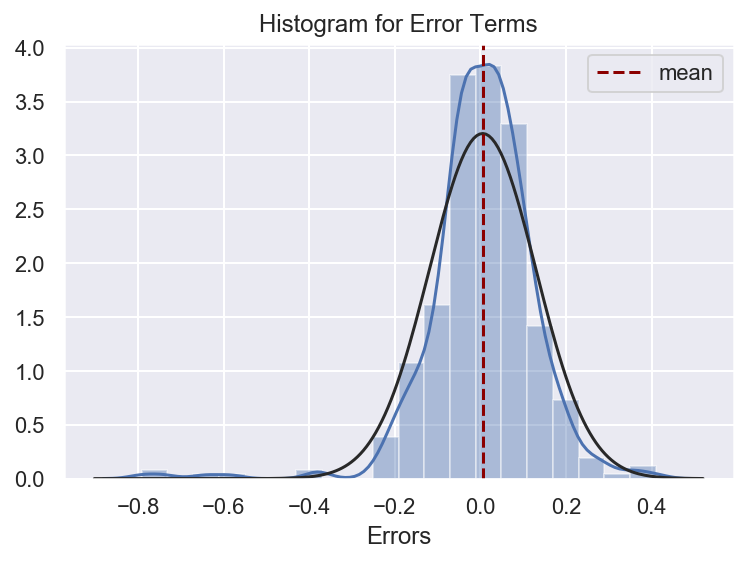

In [867]:
sns.distplot((y_test - y_pred), bins = 20,fit=norm, kde=True) 
mean_val = (y_test - y_pred).mean()#[0]
plt.title("Histogram for Error Terms")
plt.xlabel('Errors') 
plt.axvline(x = mean_val, label = "mean", color = "darkred").set_linestyle("--")
plt.legend();

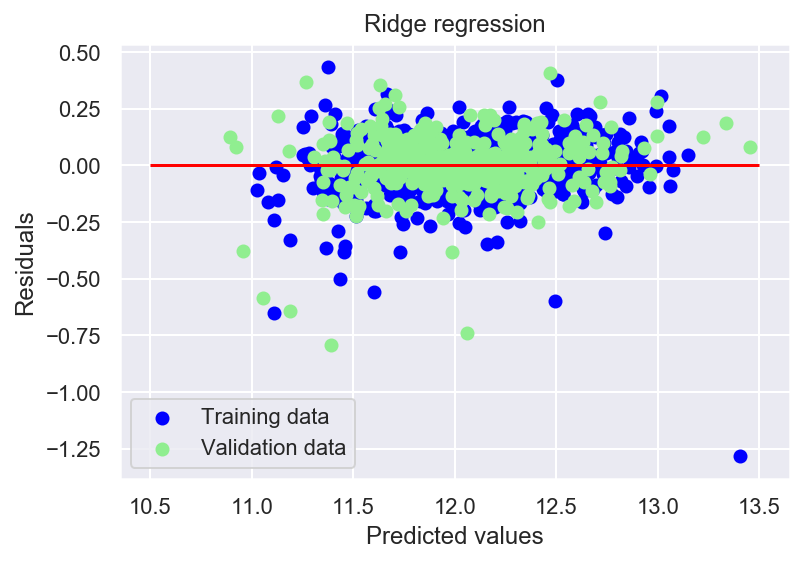

In [868]:
# Plot residuals
plt.scatter(y_train_pred, y_train - y_train_pred, c = "blue", label = "Training data")
plt.scatter(y_pred, y_test - y_pred , c = "lightgreen", label = "Validation data")
plt.title("Ridge regression")
plt.xlabel("Predicted values")
plt.ylabel("Residuals")
plt.legend(loc = "bottom left")
plt.hlines(y = 0, xmin = 10.5, xmax = 13.5, color = "red")
plt.show()

## Observations from above plot
- the error terms are homoscedastic thus depicting a good fit of model

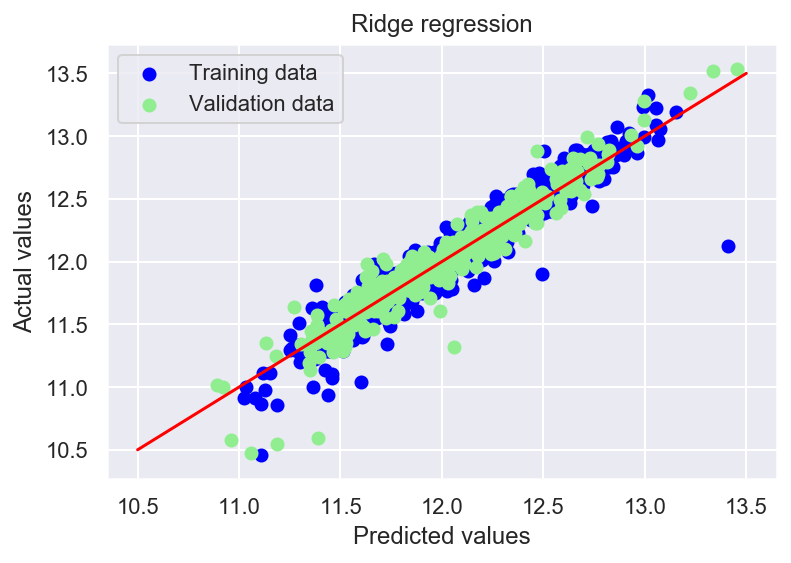

In [869]:
# Plot predictions
plt.scatter(y_train_pred, y_train, c = "blue", label = "Training data")
plt.scatter(y_pred, y_test, c = "lightgreen", label = "Validation data")
plt.title("Ridge regression")
plt.xlabel("Predicted values")
plt.ylabel("Actual values")
plt.legend(loc = "upper left")
plt.plot([10.5, 13.5], [10.5, 13.5], c = "red")
plt.show()

## Observations from above plot
- With few exceptions, the predicted and actual values are linearly following the straight line 

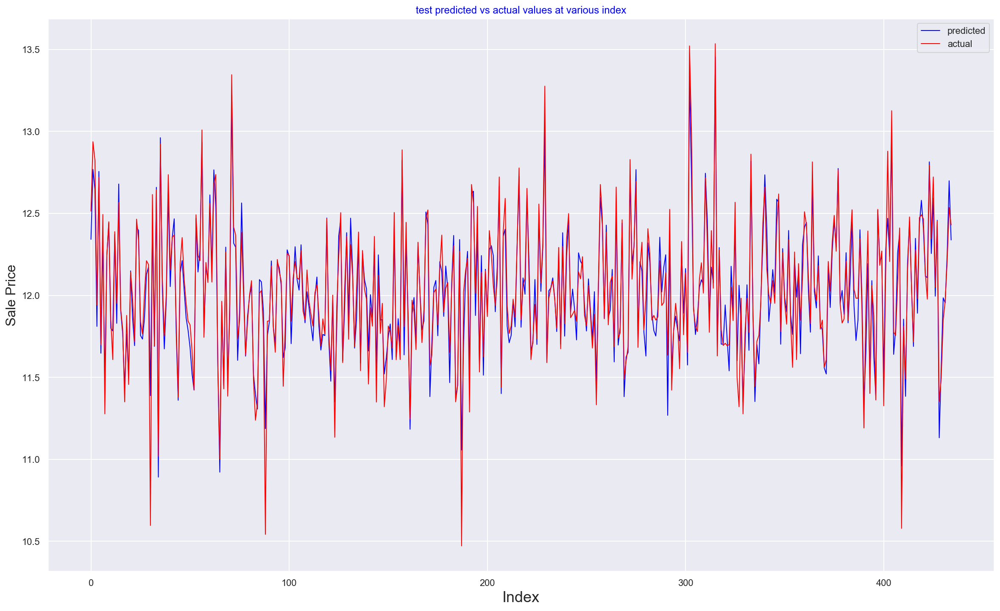

In [870]:
# Actual vs Predicted
items=len(list(y_test.index.sort_values()))
c = [i for i in range(0,items,1)]
d = [i for i in range(0,items,1)]
plt.figure(figsize=(20,12))
plt.plot(c, y_pred, color="blue", linewidth=1, linestyle="-", label='predicted')     #Plotting predicted
plt.plot(d, y_test, color="red",  linewidth=1, linestyle="-", label='actual')  #Plotting Actual
plt.title('test predicted vs actual values at various index',color='blue')
plt.xlabel('Index', fontsize=18)                               # X-label
plt.ylabel('Sale Price', fontsize=16)  
plt.legend()
plt.show()

## Observations from above plot
- House Sale Price of actual and predicted are almost in sync. Predicted prices are almost following the same pattern as of actual prices
- There are few obervations where predicted prices are lower than the actual prices while for some observations its more than the actual values but overall it shows the predictions are good

## Lets plot the predictors with coefficients

Number of features selected by Ridge are: 209 and number of features eliminated are: 0 


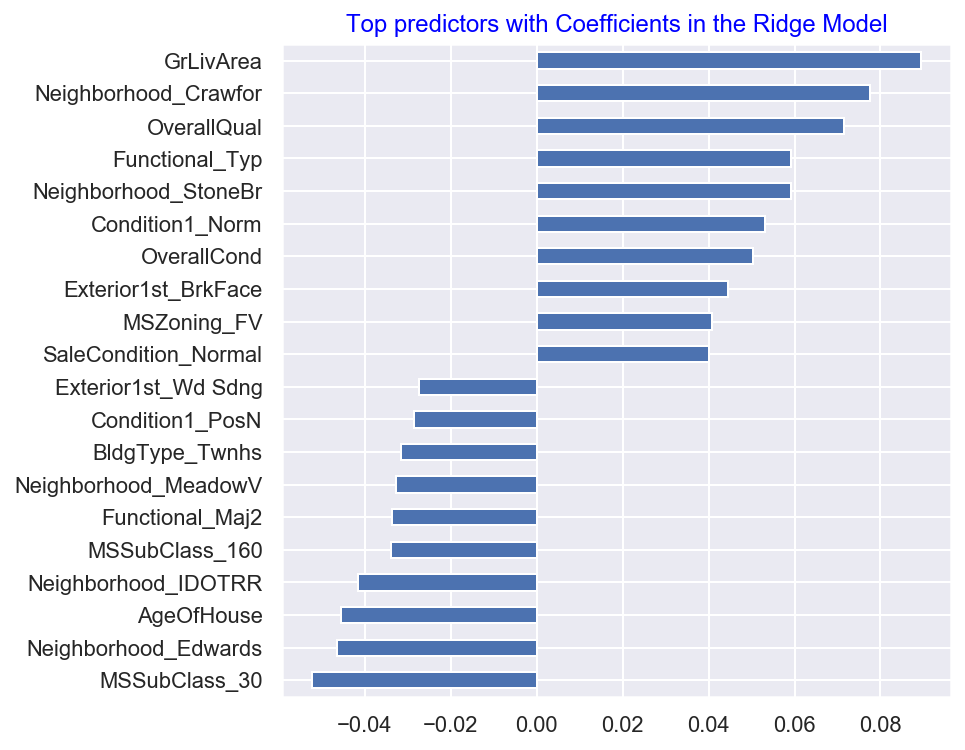

In [871]:
# Plot important coefficients
ridge_coefs = pd.Series(ridge_final.coef_, index = X_train.columns)
print("Number of features selected by Ridge are: {0} and number of features eliminated are: {1} ".format(
    sum(ridge_coefs != 0),sum(ridge_coefs == 0)))
ridge_imp_coefs = pd.concat([ridge_coefs.sort_values().head(10),
                     ridge_coefs.sort_values().tail(10)])
ridge_imp_coefs.plot(kind = "barh",figsize=(6,6))

plt.title("Top predictors with Coefficients in the Ridge Model",color='blue')
plt.show()

## Observations from above plot
- The top 5 predictors are:
    - GrLivArea (Positive)
    - Neighborhood_Crawfor (Positive)
    - OverallQual (Positive)
    - Functional_Typ (Positive)
    - Neighborhood_StoneBr (Positive)
- GrLivArea is the top positive predictor

In [872]:
print('Total number of features: {0}'.format(ridge_coefs.count()))
ridge_coefs.sort_values(ascending=False)

Total number of features: 209


GrLivArea                0.089407
Neighborhood_Crawfor     0.077472
OverallQual              0.071460
Functional_Typ           0.059256
Neighborhood_StoneBr     0.059222
Condition1_Norm          0.053160
OverallCond              0.050243
Exterior1st_BrkFace      0.044478
MSZoning_FV              0.040690
SaleCondition_Normal     0.040061
Neighborhood_BrkSide     0.037692
TotalBsmtSF              0.037580
Neighborhood_NridgHt     0.037357
LotConfig_CulDSac        0.035669
TotalBath                0.035298
CentralAir               0.035273
MSZoning_RL              0.035159
SaleType_New             0.033360
PavedDrive_Y             0.032633
LandContour_HLS          0.032401
Alley_Pave               0.030690
MSSubClass_70            0.028778
TotRmsAbvGrd             0.026239
Neighborhood_NoRidge     0.026075
Neighborhood_Somerst     0.023070
Functional_Min2          0.022810
RoofMatl_WdShngl         0.022771
GarageCars               0.022341
GarageType_Attchd        0.022324
TotalPorchArea

# 11.7 Model 4 - ElasticNet<a id='ElasticNet'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

In [873]:
# list of alphas to tune
#params = {'alpha': np.linspace(.0001, 1, 500)}
params = {'alpha': np.linspace(.001, 0.005, 1000)}
elasticnet_reg = ElasticNet()

# cross validation
model_cv = GridSearchCV(estimator = elasticnet_reg, 
                        param_grid = params, 
                        scoring= 'neg_mean_squared_error', 
                        cv = kfold, 
                        return_train_score=True,
                        verbose = 1)            

model_cv.fit(X_train, y_train) 

Fitting 10 folds for each of 1000 candidates, totalling 10000 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 10000 out of 10000 | elapsed:  1.6min finished


GridSearchCV(cv=KFold(n_splits=10, random_state=42, shuffle=True),
             error_score=nan,
             estimator=ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True,
                                  l1_ratio=0.5, max_iter=1000, normalize=False,
                                  positive=False, precompute=False,
                                  random_state=None, selection='cyclic',
                                  tol=0.0001, warm_start=False),
             iid='deprecated', n_jobs=None,
             param_grid={'alpha': array([0.001     , 0.001...
       0.0049039 , 0.00490791, 0.00491191, 0.00491592, 0.00491992,
       0.00492392, 0.00492793, 0.00493193, 0.00493594, 0.00493994,
       0.00494394, 0.00494795, 0.00495195, 0.00495596, 0.00495996,
       0.00496396, 0.00496797, 0.00497197, 0.00497598, 0.00497998,
       0.00498398, 0.00498799, 0.00499199, 0.004996  , 0.005     ])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring

In [874]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
0,0.011981,0.002522,0.001100,0.000168,0.001,{'alpha': 0.001},-0.008734,-0.013466,-0.012631,-0.015353,-0.040414,-0.014505,-0.017779,-0.013567,-0.016150,-0.012836,-0.016543,0.008279,182,-0.012335,-0.012037,-0.012074,-0.011773,-0.009881,-0.011982,-0.011716,-0.011971,-0.011675,-0.012113,-0.011756,0.000653
1,0.011432,0.002129,0.001217,0.000252,0.001004,{'alpha': 0.0010040040040040041},-0.008731,-0.013467,-0.012634,-0.015354,-0.040412,-0.014507,-0.017780,-0.013562,-0.016131,-0.012832,-0.016541,0.008279,180,-0.012341,-0.012043,-0.012080,-0.011780,-0.009886,-0.011989,-0.011722,-0.011978,-0.011684,-0.012119,-0.011762,0.000653
2,0.011909,0.001832,0.001152,0.000220,0.00100801,{'alpha': 0.001008008008008008},-0.008728,-0.013469,-0.012637,-0.015356,-0.040410,-0.014508,-0.017781,-0.013557,-0.016112,-0.012829,-0.016539,0.008279,177,-0.012348,-0.012049,-0.012085,-0.011786,-0.009891,-0.011995,-0.011728,-0.011985,-0.011692,-0.012124,-0.011768,0.000654
3,0.011082,0.001541,0.001057,0.000164,0.00101201,{'alpha': 0.0010120120120120121},-0.008726,-0.013470,-0.012640,-0.015357,-0.040409,-0.014511,-0.017783,-0.013553,-0.016093,-0.012826,-0.016537,0.008279,174,-0.012354,-0.012056,-0.012091,-0.011793,-0.009897,-0.012001,-0.011734,-0.011992,-0.011700,-0.012130,-0.011775,0.000654
4,0.010249,0.001897,0.000905,0.000018,0.00101602,{'alpha': 0.001016016016016016},-0.008723,-0.013471,-0.012643,-0.015359,-0.040408,-0.014510,-0.017784,-0.013548,-0.016074,-0.012823,-0.016534,0.008279,171,-0.012361,-0.012062,-0.012097,-0.011800,-0.009902,-0.012007,-0.011740,-0.011999,-0.011708,-0.012135,-0.011781,0.000654


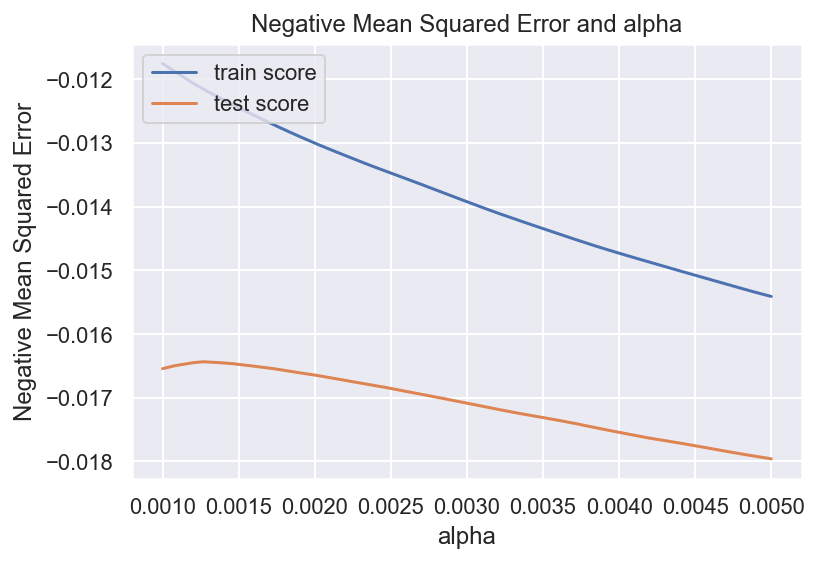

In [875]:
# plotting mean test and train scoes with alpha 
cv_results['param_alpha'] = cv_results['param_alpha'].astype('float32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Squared Error')

plt.title("Negative Mean Squared Error and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

In [876]:
model_cv.best_params_

{'alpha': 0.0012682682682682682}

In [877]:
# this best score is of neg_mean_squared_error
model_cv.best_score_

-0.01643580772034306

## Create ElasticNet Model with this best alpha

In [878]:
elasticnet_final = ElasticNet(alpha=model_cv.best_params_['alpha'])
        
elasticnet_final.fit(X_train, y_train) 

ElasticNet(alpha=0.0012682682682682682, copy_X=True, fit_intercept=True,
           l1_ratio=0.5, max_iter=1000, normalize=False, positive=False,
           precompute=False, random_state=None, selection='cyclic', tol=0.0001,
           warm_start=False)

In [879]:
y_pred = elasticnet_final.predict(X_test)

In [880]:
y_train_pred = elasticnet_final.predict(X_train)
r2_train_score_of_model = r2_score(y_train, y_train_pred)
print('r2 score of train data using elasticnet model is: {0}'.format(r2_train_score_of_model))

r2 score of train data using elasticnet model is: 0.9188726612990212


In [881]:
rmse_train_of_model = rmse_model(y_test, y_pred)
print('rmse of train data using elasticnet model is: {0}'.format(rmse_train_of_model))

rmse of train data using elasticnet model is: 0.12245257872379235


In [882]:
r2_score_of_model = r2_score(y_test, y_pred)
print('r2 score of test data using elasticnet model is: {0}'.format(r2_score_of_model))

r2 score of test data using elasticnet model is: 0.9141941756421263


In [883]:
rmse_of_model = rmse_model(y_test, y_pred)
print('rmse of test data using elasticnet model is: {0}'.format(rmse_of_model))

rmse of test data using elasticnet model is: 0.12245257872379235


### Save results

In [884]:
result_df.loc[3,'model'] = 'ElasticNetRegression'
result_df.loc[3,'alpha'] = model_cv.best_params_['alpha']
result_df.loc[3,'r2_score_train'] = r2_train_score_of_model
result_df.loc[3,'r2_score_test'] = r2_score_of_model
result_df.loc[3,'rmse_train'] = rmse_train_of_model
result_df.loc[3,'rmse_test'] = rmse_of_model

## Residual analysis of test data

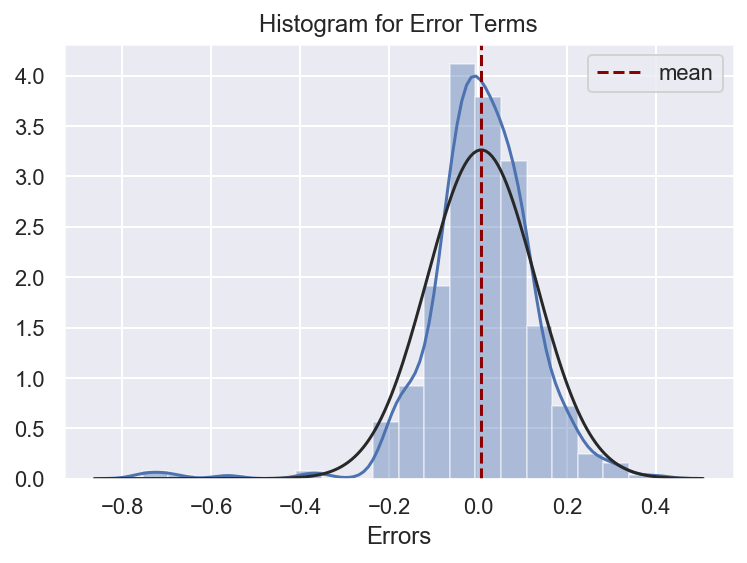

In [885]:
sns.distplot((y_test - y_pred), bins = 20,fit=norm, kde=True) 
mean_val = (y_test - y_pred).mean()#[0]
plt.title("Histogram for Error Terms")
plt.xlabel('Errors') 
plt.axvline(x = mean_val, label = "mean", color = "darkred").set_linestyle("--")
plt.legend();

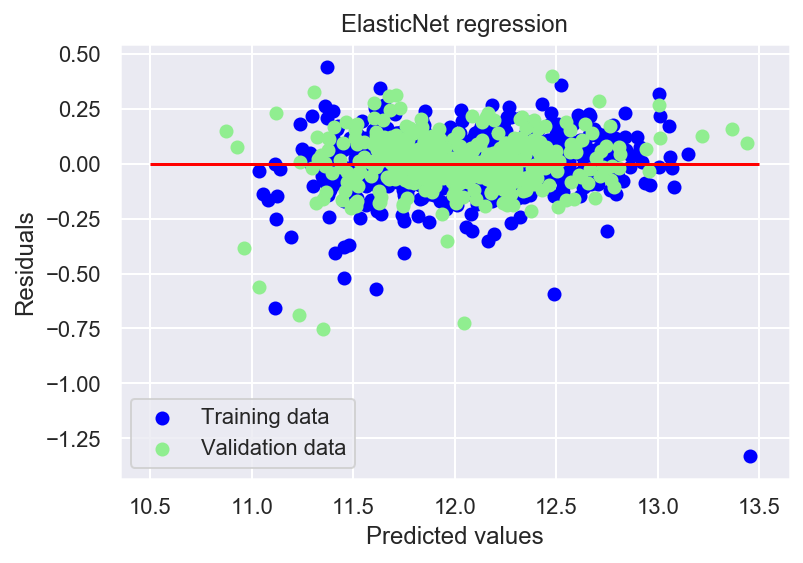

In [886]:
# Plot residuals
plt.scatter(y_train_pred, y_train - y_train_pred, c = "blue", label = "Training data")
plt.scatter(y_pred, y_test - y_pred , c = "lightgreen", label = "Validation data")
plt.title("ElasticNet regression")
plt.xlabel("Predicted values")
plt.ylabel("Residuals")
plt.legend(loc = "bottom left")
plt.hlines(y = 0, xmin = 10.5, xmax = 13.5, color = "red")
plt.show()

## Observations from above plot
- the error terms are homoscedastic thus depicting a good fit of model

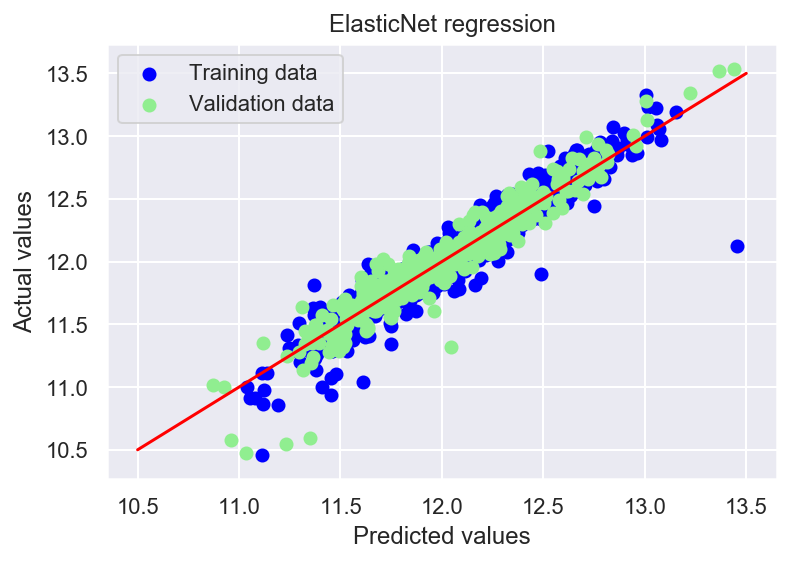

In [887]:
# Plot predictions
plt.scatter(y_train_pred, y_train, c = "blue", label = "Training data")
plt.scatter(y_pred, y_test, c = "lightgreen", label = "Validation data")
plt.title("ElasticNet regression")
plt.xlabel("Predicted values")
plt.ylabel("Actual values")
plt.legend(loc = "upper left")
plt.plot([10.5, 13.5], [10.5, 13.5], c = "red")
plt.show()

## Observations from above plot
- With few exceptions, the predicted and actual values are linearly following the straight line 

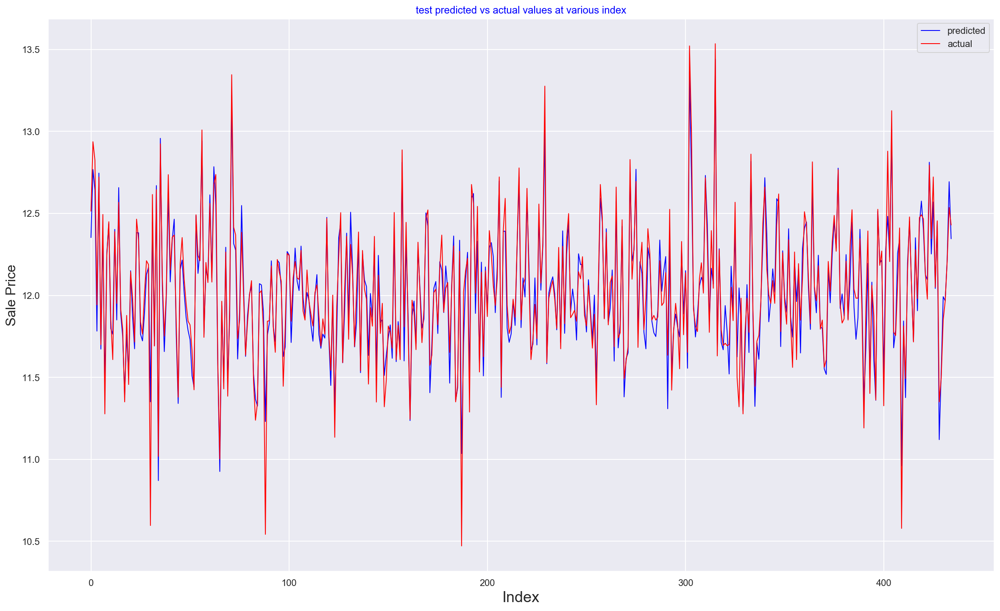

In [888]:
# Actual vs Predicted
items=len(list(y_test.index.sort_values()))
c = [i for i in range(0,items,1)]
d = [i for i in range(0,items,1)]
plt.figure(figsize=(20,12))
plt.plot(c, y_pred, color="blue", linewidth=1, linestyle="-", label='predicted')     #Plotting predicted
plt.plot(d, y_test, color="red",  linewidth=1, linestyle="-", label='actual')  #Plotting Actual
plt.title('test predicted vs actual values at various index',color='blue')
plt.xlabel('Index', fontsize=18)                               # X-label
plt.ylabel('Sale Price', fontsize=16)  
plt.legend()
plt.show()

## Observations from above plot
- House Sale Price of actual and predicted are almost in sync. Predicted prices are almost following the same pattern as of actual prices
- There are few obervations where predicted prices are lower than the actual prices while for some observations its more than the actual values but overall it shows the predictions are good

## Lets plot the predictors with coefficients

Number of features selected by ElasticNet are: 93 and number of features eliminated are: 116 


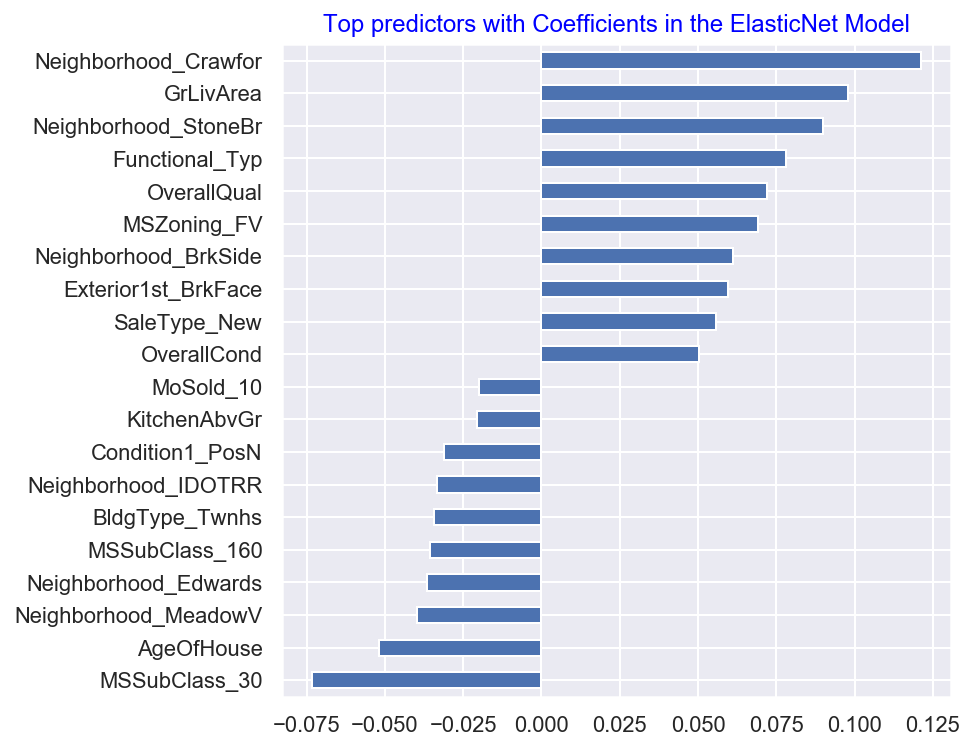

In [889]:
# Plot important coefficients
elasticnet_coefs = pd.Series(elasticnet_final.coef_, index = X_train.columns)
print("Number of features selected by ElasticNet are: {0} and number of features eliminated are: {1} ".format(
    sum(elasticnet_coefs != 0),sum(elasticnet_coefs == 0)))
elasticnet_imp_coefs = pd.concat([elasticnet_coefs.sort_values().head(10),
                     elasticnet_coefs.sort_values().tail(10)])
elasticnet_imp_coefs.plot(kind = "barh",figsize=(6,6))

plt.title("Top predictors with Coefficients in the ElasticNet Model",color='blue')
plt.show()

## Observations from above plot
- The top 5 predictors are:
    - Neighborhood_Crawfor (Positive)
    - GrLivArea (Positive)
    - Neighborhood_StoneBr (Positive)
    - Functional_Typ (Positive)
    - MSSubClass_30 (Negative)
- Neighborhood_Crawfor is the top positive predictor and MSSubClass_30 is the top negative predictor

In [890]:
print('Total number of features: {0}'.format(elasticnet_coefs.count()))
elasticnet_coefs.sort_values(ascending=False)

Total number of features: 209


Neighborhood_Crawfor     0.121147
GrLivArea                0.097903
Neighborhood_StoneBr     0.090068
Functional_Typ           0.078181
OverallQual              0.072077
MSZoning_FV              0.069026
Neighborhood_BrkSide     0.061264
Exterior1st_BrkFace      0.059586
SaleType_New             0.055657
OverallCond              0.050443
Condition1_Norm          0.049847
Neighborhood_NridgHt     0.046776
MSZoning_RL              0.043549
LotConfig_CulDSac        0.042596
TotalBsmtSF              0.039451
SaleCondition_Normal     0.037903
CentralAir               0.034911
TotalBath                0.033751
Functional_Min2          0.030513
PavedDrive_Y             0.026524
Alley_Pave               0.026118
Neighborhood_NoRidge     0.024520
GarageCars               0.023070
TotRmsAbvGrd             0.022964
GarageArea               0.022635
TotalPorchArea           0.021678
Foundation_PConc         0.019799
Fireplaces               0.016804
LotArea                  0.015879
GarageType_Att

In [891]:
result_df

,model,alpha,r2_score_train,r2_score_test,rmse_train,rmse_test
0,LinearRegression,NaN,0.93865,-1.4683e+22,3.08588e+10,9.94977e+10
1,LassoRegression,0.001,0.91387,0.914597,0.114839,0.122165
2,RidgeRegression,19.6973,0.921593,0.91108,0.109569,0.124655
3,ElasticNetRegression,0.00126827,0.918873,0.914194,0.122453,0.122453


In [892]:
result_df.loc[1]

model             LassoRegression
alpha                       0.001
r2_score_train            0.91387
r2_score_test            0.914597
rmse_train               0.114839
rmse_test                0.122165
Name: 1, dtype: object

## 11.8 Conclusion and Recommendations<a id='Conclusion and Recommendations'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>
- Linear Regression is too simple model and RMSE of this model is too high so its rejected
- After doing regularization, Lasso and ElasticNet Regression produced similar results where test r2score of Lasso model is slightly higher than ElasticNet model. Similary test RMSE of Lasso model is slightly lower than that of ElasticNet 
- So we conclude that Lasso model is better and we recommend to use Lasso model to predict the house sale prices

# 12. Subjective Questions<a id='Subjective Questions'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

# 12.1 Question 1<a id='Question1'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

What is the optimal value of alpha for ridge and lasso regression? What will be the changes in the model if you choose double the value of alpha for both ridge and lasso? What will be the most important predictor variables after the change is implemented?

## Answer1

- The optimal value of alpha for Ridge is 19.6973 and that of Lasso is 0.001

### Lets double the value of alpha for Lasso model

In [893]:
lasso_double = Lasso(alpha=0.002)
        
lasso_double.fit(X_train, y_train) 

Lasso(alpha=0.002, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

In [894]:
y_train_pred_double = lasso_double.predict(X_train)
r2_train_double = r2_score(y_train, y_train_pred_double)
print('r2 score of train data using lasso model when alpha value is doubled is: {0}'.format(r2_train_double))

r2 score of train data using lasso model when alpha value is doubled is: 0.9029158017092265


In [895]:
print('r2 score of train has decreased by {0} when alpha value is doubled'.format(
    result_df[result_df['model']=='LassoRegression']['r2_score_train'][1] - r2_train_double))

r2 score of train has decreased by 0.010953783959391283 when alpha value is doubled


In [896]:
rmse_train_double = rmse_model(y_train, y_train_pred_double)
print('rmse of train data using lasso model when alpha value is doubled is: {0}'.format(rmse_train_double))

rmse of train data using lasso model when alpha value is doubled is: 0.12192297905034355


In [897]:
print('rmse of train has increased by {0} when alpha value is doubled'.format(rmse_train_double - 
    result_df[result_df['model']=='LassoRegression']['rmse_train'][1]))

rmse of train has increased by 0.007083937418899025 when alpha value is doubled


In [898]:
y_pred_double = lasso_double.predict(X_test)

In [899]:
r2_test_double = r2_score(y_test, y_pred_double)
print('r2 score of test data using lasso model when alpha value is doubled is: {0}'.format(r2_test_double))

r2 score of test data using lasso model when alpha value is doubled is: 0.9088001804187689


In [900]:
print('r2 score of test has decreased by {0} when alpha value is doubled'.format(
    result_df[result_df['model']=='LassoRegression']['r2_score_test'][1] - r2_test_double))

r2 score of test has decreased by 0.005796758296093274 when alpha value is doubled


In [901]:
rmse_test_double = rmse_model(y_test, y_pred_double)
print('rmse of test data using lasso model is: {0}'.format(rmse_test_double))

rmse of test data using lasso model is: 0.1262427774756443


In [902]:
print('rmse of test has increased by {0} when alpha value is doubled'.format(rmse_test_double - 
    result_df[result_df['model']=='LassoRegression']['rmse_test'][1]))

rmse of test has increased by 0.004077926236543239 when alpha value is doubled


## Observations from above cell
- When alpha value is doubled in Lasso Regression model
    - r2 score of train and test data has reduced by 0.011 and 0.122 respectively
    - RMSE of train and test data has increased by 0.007 and 0.004 respectively
    - r2score of train data is 0.903 and r2score of test data is 0.909
    - RMSE of train data is 0.122 and or test data is 0.126

## Lets plot the predictors with coefficients

Number of features selected by Lasso are: 54 and number of features eliminated are: 155 


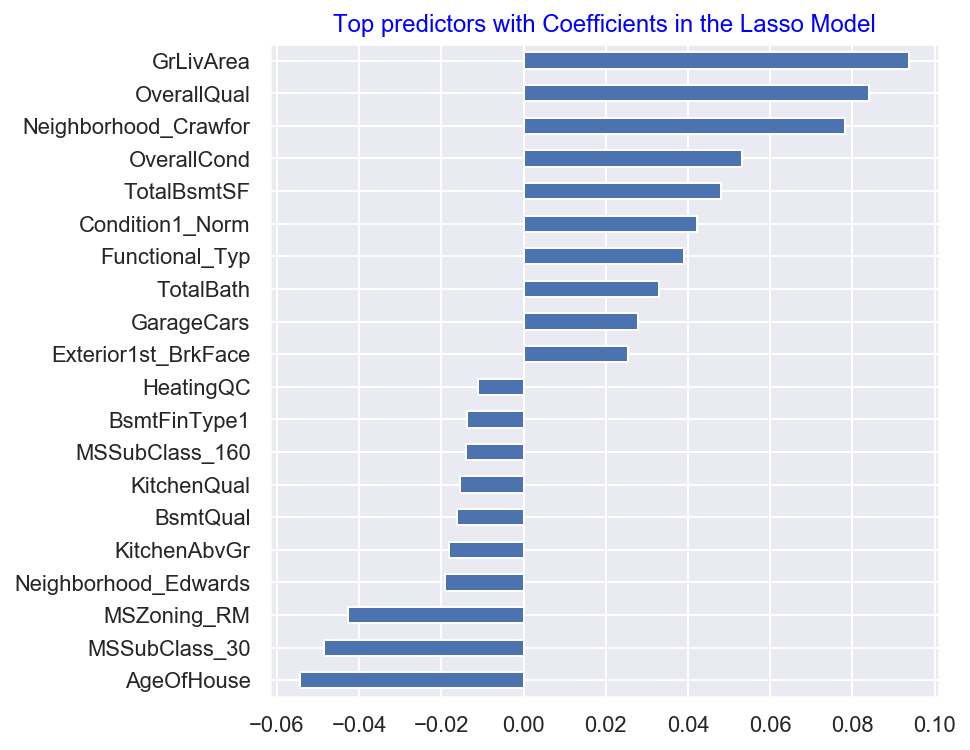

In [903]:
# Plot important coefficients
lasso_coefs = pd.Series(lasso_double.coef_, index = X_train.columns)
print("Number of features selected by Lasso are: {0} and number of features eliminated are: {1} ".format(
    sum(lasso_coefs != 0),sum(lasso_coefs == 0)))
lasso_imp_coefs = pd.concat([lasso_coefs.sort_values().head(10),
                     lasso_coefs.sort_values().tail(10)])
lasso_imp_coefs.plot(kind = "barh",figsize=(6,6))

plt.title("Top predictors with Coefficients in the Lasso Model",color='blue')
plt.show()

## Observations from above plot
- GrLivArea is the top positive predictor and AgeOfHouse is the top negative predictor when alpha value is doubled in Lasso Regression model
- The top 5 predictors are:
    - GrLivArea (Positive)
    - OverallQual (Positive)
    - Neighborhood_Crawfor (Positive)
    - AgeOfHouse (Negative)
    - OverallCond (Positive)

In [904]:
print('Total number of features: {0}'.format(lasso_coefs.count()))
lasso_coefs.sort_values(ascending=False)

Total number of features: 209


GrLivArea                0.093733
OverallQual              0.083943
Neighborhood_Crawfor     0.078156
OverallCond              0.053191
TotalBsmtSF              0.047966
Condition1_Norm          0.042190
Functional_Typ           0.038990
TotalBath                0.032995
GarageCars               0.027830
Exterior1st_BrkFace      0.025477
Neighborhood_BrkSide     0.023254
Fireplaces               0.020727
GarageArea               0.020641
CentralAir               0.020328
LotConfig_CulDSac        0.018329
TotRmsAbvGrd             0.018284
TotalPorchArea           0.018225
Foundation_PConc         0.017947
SaleType_New             0.016653
LotArea                  0.016631
PavedDrive_Y             0.014496
LotFrontage              0.008376
ExterCond                0.008219
SaleCondition_Normal     0.007752
MSSubClass_20            0.007584
GarageType_Attchd        0.007430
Exterior1st_VinylSd      0.006573
MSZoning_RL              0.005993
BsmtFinType2             0.005907
MasVnrArea    

### Lets double the value of alpha for Ridge model

In [905]:
ridge_double = Ridge(alpha=39.3946)
        
ridge_double.fit(X_train, y_train) 

Ridge(alpha=39.3946, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

In [906]:
y_train_pred_double = ridge_double.predict(X_train)
r2_train_double = r2_score(y_train, y_train_pred_double)
print('r2 score of train data using ridge model when alpha value is doubled is: {0}'.format(r2_train_double))

r2 score of train data using ridge model when alpha value is doubled is: 0.9160338087832088


In [907]:
print('r2 score of train has decreased by {0} when alpha value is doubled'.format(
    result_df[result_df['model']=='RidgeRegression']['r2_score_train'][2] - r2_train_double))

r2 score of train has decreased by 0.005559105507344508 when alpha value is doubled


In [908]:
rmse_train_double = rmse_model(y_train, y_train_pred_double)
print('rmse of train data using ridge model when alpha value is doubled is: {0}'.format(rmse_train_double))

rmse of train data using ridge model when alpha value is doubled is: 0.11338706612574469


In [909]:
print('rmse of train has increased by {0} when alpha value is doubled'.format(rmse_train_double - 
    result_df[result_df['model']=='RidgeRegression']['rmse_train'][2]))

rmse of train has increased by 0.003817750936345801 when alpha value is doubled


In [910]:
y_pred_double = ridge_double.predict(X_test)

In [911]:
r2_test_double = r2_score(y_test, y_pred_double)
print('r2 score of test data using ridge model when alpha value is doubled is: {0}'.format(r2_test_double))

r2 score of test data using ridge model when alpha value is doubled is: 0.9108294274161038


In [912]:
print('r2 score of test has decreased by {0} when alpha value is doubled'.format(
    result_df[result_df['model']=='RidgeRegression']['r2_score_test'][2] - r2_test_double))

r2 score of test has decreased by 0.00025050784934543824 when alpha value is doubled


In [913]:
rmse_test_double = rmse_model(y_test, y_pred_double)
print('rmse of test data using ridge model is: {0}'.format(rmse_test_double))

rmse of test data using ridge model is: 0.12483039047322714


In [914]:
print('rmse of test has increased by {0} when alpha value is doubled'.format(rmse_test_double - 
    result_df[result_df['model']=='RidgeRegression']['rmse_test'][2]))

rmse of test has increased by 0.0001754670017904275 when alpha value is doubled


## Observations from above cell
- When alpha value is doubled in Ridge Regression model
    - r2 score of train and test data has reduced by 0.006 and 0.0003 respectively
    - RMSE of train and test data has increased by 0.0038 and 0.0002 respectively
    - r2score of train data is 0.916 and r2score of test data is 0.911
    - RMSE of train data is 0.113 and or test data is 0.125

## Lets plot the predictors with coefficients

Number of features selected by Ridge are: 209 and number of features eliminated are: 0 


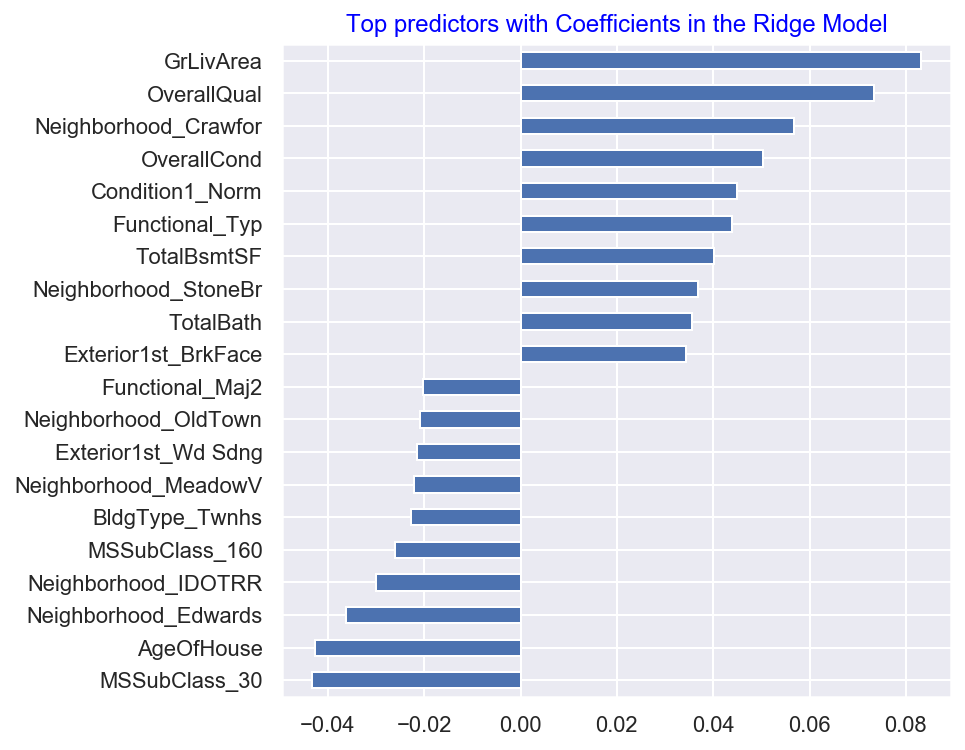

In [915]:
# Plot important coefficients
ridge_coefs = pd.Series(ridge_double.coef_, index = X_train.columns)
print("Number of features selected by Ridge are: {0} and number of features eliminated are: {1} ".format(
    sum(ridge_coefs != 0),sum(ridge_coefs == 0)))
ridge_imp_coefs = pd.concat([ridge_coefs.sort_values().head(10),
                     ridge_coefs.sort_values().tail(10)])
ridge_imp_coefs.plot(kind = "barh",figsize=(6,6))

plt.title("Top predictors with Coefficients in the Ridge Model",color='blue')
plt.show()

## Observations from above plot
- GrLivArea is still the top positive predictor and MSSubClass_30 is the top negative predictor when alpha value is doubled in Ridge Regression model
- However now, OverallQual is the second top positive predictor followed by Neighborhood_Crawfor and AgeOfHouse if the top second negative predictor followed by Neighborhood_Edwards
- The top 5 predictors are:
    - GrLivArea (Positive)
    - OverallQual (Positive)
    - Neighborhood_Crawfor (Positive)
    - OverallCond (Positive)
    - Condition1_Norm (Positive)

In [916]:
print('Total number of features: {0}'.format(ridge_coefs.count()))
ridge_coefs.sort_values(ascending=False)

Total number of features: 209


GrLivArea                0.083109
OverallQual              0.073359
Neighborhood_Crawfor     0.056697
OverallCond              0.050348
Condition1_Norm          0.045030
Functional_Typ           0.044007
TotalBsmtSF              0.040103
Neighborhood_StoneBr     0.036859
TotalBath                0.035580
Exterior1st_BrkFace      0.034323
SaleCondition_Normal     0.031415
CentralAir               0.029582
PavedDrive_Y             0.028805
Neighborhood_BrkSide     0.028548
LotConfig_CulDSac        0.028126
MSZoning_FV              0.027911
TotRmsAbvGrd             0.027752
MSZoning_RL              0.027219
SaleType_New             0.024346
Neighborhood_NridgHt     0.023850
GarageCars               0.023801
LandContour_HLS          0.022826
TotalPorchArea           0.021866
GarageArea               0.021866
Alley_Pave               0.021700
Fireplaces               0.020934
MSSubClass_70            0.020818
Neighborhood_Somerst     0.019610
Foundation_PConc         0.018517
MSSubClass_20 

## Conclusion and Recommendations when alpha value is doubled for Lasso and Ridge Regression
- Ridge preforms better than Lasso model when alpha value is doubled
- test data r2 score of Ridge model is 0.911 while that of Lasso is 0.909
- test data rmse of Ridge model is 0.125 while that of Lasso is 0.126
- With this we conclude that when alpha value is doubled, Ridge performs better and therefore we recommend Ridge model as a better fit in this scenario
- The top 5 predictors are:
    - GrLivArea
    - OverallQual
    - Neighborhood_Crawfor
    - OverallCond
    - Condition1_Norm

# 12.2 Question 2<a id='Question2'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

You have determined the optimal value of lambda for ridge and lasso regression during the assignment. Now, which one will you choose to apply and why?

# Answer 2

In [917]:
result_df

,model,alpha,r2_score_train,r2_score_test,rmse_train,rmse_test
0,LinearRegression,NaN,0.93865,-1.4683e+22,3.08588e+10,9.94977e+10
1,LassoRegression,0.001,0.91387,0.914597,0.114839,0.122165
2,RidgeRegression,19.6973,0.921593,0.91108,0.109569,0.124655
3,ElasticNetRegression,0.00126827,0.918873,0.914194,0.122453,0.122453


## Observations from above results cell
- Lasso Regression model performs better on train and test data with r2 score almost similar on train and test data depicting good fit on data
- Also rmse on test data is the lowest for Lasso
- Based on these observations, we choose Lasso model and will recommend to apply Lasso Regression model to predict House Sales Price

# Question 3<a id='Question3'></a>
<div align="right"><a href='#Table of Contents'>Back to Table of Contents</a></div>

After building the model, you realised that the five most important predictor variables in the lasso model are not available in the incoming data. You will now have to create another model excluding the five most important predictor variables. Which are the five most important predictor variables now?

## Answer 3

### Top predictors of existing final model - Lasso Regression model

Number of features selected by Lasso are: 73 and number of features eliminated are: 136 


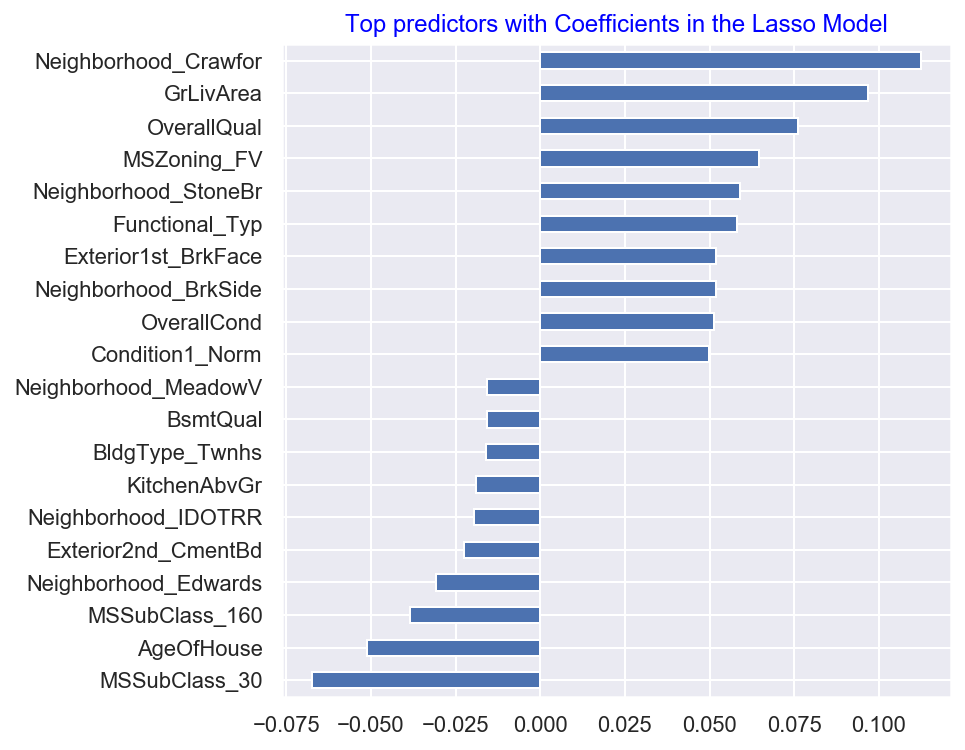

In [918]:
# Plot important coefficients
lasso_coefs = pd.Series(lasso_final.coef_, index = X_train.columns)
print("Number of features selected by Lasso are: {0} and number of features eliminated are: {1} ".format(
    sum(lasso_coefs != 0),sum(lasso_coefs == 0)))
lasso_imp_coefs = pd.concat([lasso_coefs.sort_values().head(10),
                     lasso_coefs.sort_values().tail(10)])
lasso_imp_coefs.plot(kind = "barh",figsize=(6,6))

plt.title("Top predictors with Coefficients in the Lasso Model",color='blue')
plt.show()

In [919]:
print('Total number of features: {0}'.format(lasso_coefs.count()))
lasso_coefs.sort_values(ascending=False)

Total number of features: 209


Neighborhood_Crawfor     0.112356
GrLivArea                0.096901
OverallQual              0.076057
MSZoning_FV              0.064479
Neighborhood_StoneBr     0.059055
Functional_Typ           0.057967
Exterior1st_BrkFace      0.051838
Neighborhood_BrkSide     0.051782
OverallCond              0.051310
Condition1_Norm          0.049831
MSZoning_RL              0.046635
SaleType_New             0.045954
TotalBsmtSF              0.041885
LotConfig_CulDSac        0.038859
TotalBath                0.034108
CentralAir               0.032156
SaleCondition_Normal     0.028993
Neighborhood_NridgHt     0.027553
GarageCars               0.025149
PavedDrive_Y             0.022516
GarageArea               0.021660
TotRmsAbvGrd             0.021570
Foundation_PConc         0.021372
TotalPorchArea           0.020581
Fireplaces               0.017876
LotArea                  0.016074
Alley_Pave               0.013553
MSSubClass_20            0.011333
GarageType_Attchd        0.011069
Exterior1st_Vi

### Observations from above cell
- Top 5 predictors are:
    - Neighborhood_Crawfor (positive)
    - GrLivArea (positive)
    - OverallQual (positive)
    - MSSubClass_30 (negative)
    - MSZoning_FV (positive)
- Since these top predictors are not available in incoming data so lets drop these columns from the data set and try to build the model again and check for the top predictors

In [920]:
X_train_quest3 = X_train.copy()
X_test_quest3 = X_test.copy()
print('shape of X_train before dropping columns: {0}'.format(X_train_quest3.shape))
print('shape of X_test before dropping columns: {0}'.format(X_test_quest3.shape))

shape of X_train before dropping columns: (1014, 209)
shape of X_test before dropping columns: (435, 209)


In [921]:
col_to_drop = ['Neighborhood_Crawfor','GrLivArea','OverallQual','MSSubClass_30','MSZoning_FV']
X_train_quest3.drop(columns=col_to_drop, inplace=True)
X_test_quest3.drop(columns=col_to_drop, inplace=True)
print('shape of X_train after dropping columns: {0}'.format(X_train_quest3.shape))
print('shape of X_test after dropping columns: {0}'.format(X_test_quest3.shape))

shape of X_train after dropping columns: (1014, 204)
shape of X_test after dropping columns: (435, 204)


### Lets fit Lasso model

In [922]:
lasso_quest3 = Lasso(alpha=0.001)
        
lasso_quest3.fit(X_train_quest3, y_train) 

Lasso(alpha=0.001, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

In [923]:
y_train_pred = lasso_quest3.predict(X_train_quest3)
r2_train_score = r2_score(y_train, y_train_pred)
print('r2 score of train data using lasso model is: {0}'.format(r2_train_score))

r2 score of train data using lasso model is: 0.8945451718561195


In [924]:
print('r2 score of train has decreased by {0} '.format(
    result_df[result_df['model']=='LassoRegression']['r2_score_train'][1] - r2_train_score))

r2 score of train has decreased by 0.019324413812498276 


In [925]:
rmse_train = rmse_model(y_train, y_train_pred)
print('rmse of train data using lasso model is: {0}'.format(rmse_train))

rmse of train data using lasso model is: 0.1270704375758946


In [926]:
print('rmse of train has increased by {0}'.format(rmse_train - 
    result_df[result_df['model']=='LassoRegression']['rmse_train'][1]))

rmse of train has increased by 0.012231395944450066


In [927]:
y_pred = lasso_quest3.predict(X_test_quest3)

In [928]:
r2_test = r2_score(y_test, y_pred)
print('r2 score of test data using lasso model is: {0}'.format(r2_test))

r2 score of test data using lasso model is: 0.8822586468241331


In [929]:
print('r2 score of test has decreased by {0}'.format(
    result_df[result_df['model']=='LassoRegression']['r2_score_test'][1] - r2_test))

r2 score of test has decreased by 0.03233829189072901


In [930]:
rmse_test = rmse_model(y_test, y_pred)
print('rmse of test data using lasso model is: {0}'.format(rmse_test))

rmse of test data using lasso model is: 0.14344125050562098


In [931]:
print('rmse of test has increased by {0}'.format(rmse_test - 
    result_df[result_df['model']=='LassoRegression']['rmse_test'][1]))

rmse of test has increased by 0.02127639926651992


## Observations from above cell
- When top 5 predictors are dropped then in Lasso Regression model
    - r2 score of train and test data has reduced by 0.019 and 0.032 respectively
    - RMSE of train and test data has increased by 0.012 and 0.143 respectively
    - r2score of train data is 0.895 and of test data is 0.882
    - RMSE of train data is 0.127 and of test data is 0.143

## Lets plot the predictors with coefficients

Number of features selected by Lasso are: 77 and number of features eliminated are: 127 


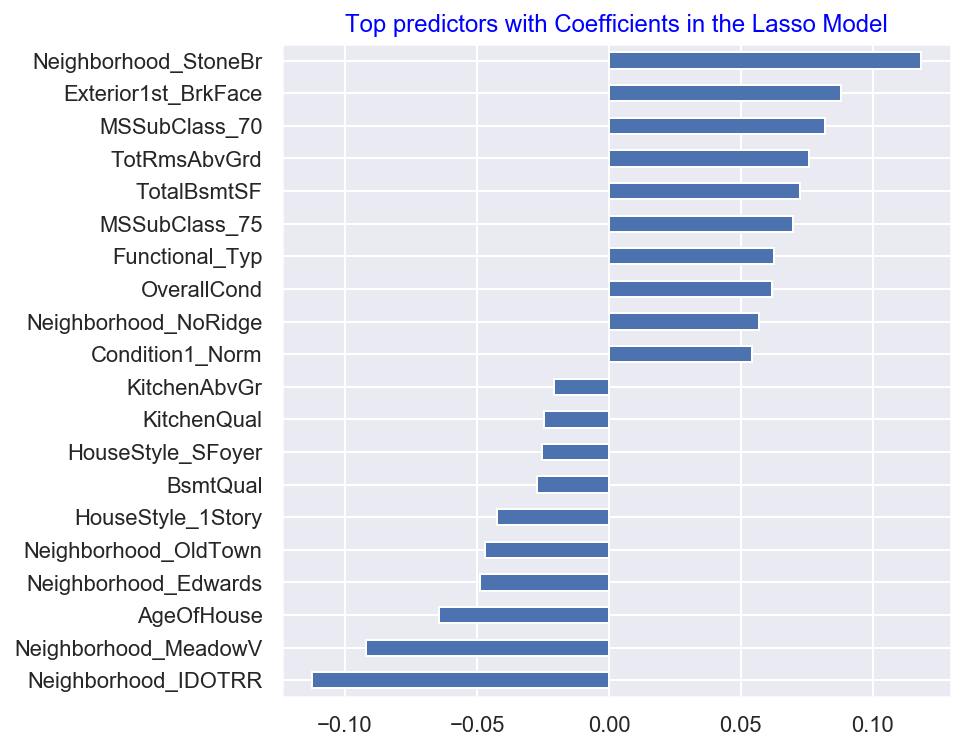

In [932]:
# Plot important coefficients
lasso_coefs = pd.Series(lasso_quest3.coef_, index = X_train_quest3.columns)
print("Number of features selected by Lasso are: {0} and number of features eliminated are: {1} ".format(
    sum(lasso_coefs != 0),sum(lasso_coefs == 0)))
lasso_imp_coefs = pd.concat([lasso_coefs.sort_values().head(10),
                     lasso_coefs.sort_values().tail(10)])
lasso_imp_coefs.plot(kind = "barh",figsize=(6,6))

plt.title("Top predictors with Coefficients in the Lasso Model",color='blue')
plt.show()

In [933]:
print('Total number of features: {0}'.format(lasso_coefs.count()))
lasso_coefs.sort_values(ascending=False)

Total number of features: 204


Neighborhood_StoneBr     0.118188
Exterior1st_BrkFace      0.087976
MSSubClass_70            0.081929
TotRmsAbvGrd             0.075927
TotalBsmtSF              0.072405
MSSubClass_75            0.069750
Functional_Typ           0.062712
OverallCond              0.061781
Neighborhood_NoRidge     0.057018
Condition1_Norm          0.054392
TotalBath                0.048446
Alley_Pave               0.044942
Neighborhood_Somerst     0.041619
MSSubClass_50            0.037774
Fireplaces               0.036825
LotConfig_CulDSac        0.036715
PavedDrive_Y             0.036010
LandContour_HLS          0.035632
CentralAir               0.033414
SaleType_New             0.033029
GarageArea               0.030980
SaleCondition_Normal     0.030373
TotalPorchArea           0.029115
Neighborhood_NridgHt     0.027969
GarageCars               0.027145
LandSlope_Mod            0.017483
Foundation_PConc         0.015444
GarageType_Attchd        0.014950
LotFrontage              0.014043
LotArea       

## Observations from above plot
- Top 5 predictors are 
    - Neighborhood_StoneBr (positive predictor)
    - Neighborhood_IDOTRR (negative predictor)
    - Neighborhood_MeadowV (negative predictor)
    - Exterior1st_BrkFace (positive predictor)
    - MSSubClass_70 (positive predictor)